# Making my own version

In [1]:
#import necessary libraries
import xarray as xr
from netCDF4 import Dataset, MFDataset, num2date
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pyproj import Proj
import geopandas as gpd

In [2]:
baseline = xr.open_dataset("avg_201601.nc")
no_rwc = xr.open_dataset("no_rwc_avg_201601.nc")

In [3]:
baseline

<xarray.Dataset>
Dimensions:        (TSTEP: 1, VAR: 123, DATE-TIME: 2, LAY: 1, ROW: 726,
                    COL: 1155)
Dimensions without coordinates: TSTEP, VAR, DATE-TIME, LAY, ROW, COL
Data variables: (12/124)
    TFLAG          (TSTEP, VAR, DATE-TIME) int32 ...
    RH             (TSTEP, LAY, ROW, COL) float32 ...
    SFC_TMP        (TSTEP, LAY, ROW, COL) float32 ...
    PBLH           (TSTEP, LAY, ROW, COL) float32 ...
    precip         (TSTEP, LAY, ROW, COL) float32 ...
    ALD2           (TSTEP, LAY, ROW, COL) float32 ...
    ...             ...
    PM25_NO3_loss  (TSTEP, LAY, ROW, COL) float32 ...
    ANO3IJ_loss    (TSTEP, LAY, ROW, COL) float32 ...
    PM25_NH4_loss  (TSTEP, LAY, ROW, COL) float32 ...
    ANH4IJ_loss    (TSTEP, LAY, ROW, COL) float32 ...
    PMIJ_FRM       (TSTEP, LAY, ROW, COL) float32 ...
    PM25_FRM       (TSTEP, LAY, ROW, COL) float32 ...
Attributes: (12/35)
    IOAPI_VERSION:             $Id: @(#) ioapi library version 3.1 $         ...
    EXEC_ID:                   ????????????????                              ...
    FTYPE:                     1
    CDATE:                     2021272
    CTIME:                     173149
    WDATE:                     2021272
    ...                        ...
    UPNAM:                     COMBINE         
    VAR-LIST:                  RH              SFC_TMP         PBLH          ...
    FILEDESC:                  Concentration file output                     ...
    HISTORY:                   Mon May 13 21:27:35 2024: ncra COMBINE_ACONC_2...
    NCO:                       "4.5.3"
    nco_openmp_thread_number:  1

In [4]:
# Define the Lambert Conformal Conic projection parameters
def map_lat_lon(proj_params, xorig, yorig, ncols, nrows):
    # Define the projection transformation
    lcc_proj = Proj(proj_params)

    # Define the grid indices
    xcell, ycell = 4000, 4000  # Size of grid cells
    
    # Generate grid points
    x = np.arange(xorig, xorig + xcell * ncols, xcell)
    y = np.arange(yorig, yorig + ycell * nrows, ycell)
    
    # Create a meshgrid from the grid points
    x_mesh, y_mesh = np.meshgrid(x, y)
    
    # Convert grid indices to latitude and longitude using the projection
    lon_4km, lat_4km = lcc_proj(x_mesh, y_mesh, inverse=True)

    # Print latitude and longitude for a sample point
    print("Latitude at index (0, 0):", lat_4km[1, 1])
    print("Longitude at index (0, 0):", lon_4km[0, 1])
    
    return lon_4km, lat_4km

lon, lat = map_lat_lon(
    proj_params = {'proj': 'lcc',
                   'lat_1': 33,
                   'lat_2': 45,
                   'lon_0': -97,
                   'lat_0': 40},
    xorig = -2292000, yorig= -1584000,  # Coordinates of the origin
    ncols = 1155, nrows = 726  # Number of columns and rows
    )

Latitude at index (0, 0): 23.348182028774666
Longitude at index (0, 0): -118.91550946462284


In [5]:
baseline

<xarray.Dataset>
Dimensions:        (TSTEP: 1, VAR: 123, DATE-TIME: 2, LAY: 1, ROW: 726,
                    COL: 1155)
Dimensions without coordinates: TSTEP, VAR, DATE-TIME, LAY, ROW, COL
Data variables: (12/124)
    TFLAG          (TSTEP, VAR, DATE-TIME) int32 ...
    RH             (TSTEP, LAY, ROW, COL) float32 ...
    SFC_TMP        (TSTEP, LAY, ROW, COL) float32 ...
    PBLH           (TSTEP, LAY, ROW, COL) float32 ...
    precip         (TSTEP, LAY, ROW, COL) float32 ...
    ALD2           (TSTEP, LAY, ROW, COL) float32 ...
    ...             ...
    PM25_NO3_loss  (TSTEP, LAY, ROW, COL) float32 ...
    ANO3IJ_loss    (TSTEP, LAY, ROW, COL) float32 ...
    PM25_NH4_loss  (TSTEP, LAY, ROW, COL) float32 ...
    ANH4IJ_loss    (TSTEP, LAY, ROW, COL) float32 ...
    PMIJ_FRM       (TSTEP, LAY, ROW, COL) float32 ...
    PM25_FRM       (TSTEP, LAY, ROW, COL) float32 ...
Attributes: (12/35)
    IOAPI_VERSION:             $Id: @(#) ioapi library version 3.1 $         ...
    EXEC_ID:                   ????????????????                              ...
    FTYPE:                     1
    CDATE:                     2021272
    CTIME:                     173149
    WDATE:                     2021272
    ...                        ...
    UPNAM:                     COMBINE         
    VAR-LIST:                  RH              SFC_TMP         PBLH          ...
    FILEDESC:                  Concentration file output                     ...
    HISTORY:                   Mon May 13 21:27:35 2024: ncra COMBINE_ACONC_2...
    NCO:                       "4.5.3"
    nco_openmp_thread_number:  1

In [6]:
lat

array([[23.30577439, 23.31415065, 23.32251341, ..., 23.25523374,
        23.24676318, 23.23827916],
       [23.33980114, 23.34818203, 23.35654941, ..., 23.2892326 ,
        23.28075736, 23.27226866],
       [23.37383204, 23.38221755, 23.39058955, ..., 23.32323559,
        23.31475567, 23.30626229],
       ...,
       [48.2002066 , 48.21221363, 48.2242016 , ..., 48.12776466,
        48.11562446, 48.10346527],
       [48.23381379, 48.24582618, 48.2578195 , ..., 48.16133951,
        48.14919389, 48.13702928],
       [48.26741499, 48.27943274, 48.29143142, ..., 48.19490837,
        48.18275734, 48.1705873 ]])

# WRF Validation

### Fixing step 1

In [61]:
# -----------------
# Step 1
# -----------------

# Data for comparison
# LCD data from noaa: https://www.ncei.noaa.gov/data/local-climatological-data/access/2018/
# LCD station names -- metadata of stations -- must make CSV: https://www.ncdc.noaa.gov/homr/file/lcd-stations.txt
# Currently the UTC offset calculator is for negative offsets, simple loop fix to do positive offsets
# ---------------------------------------------------------------------------------------------------------
# ~~~~~~ START USER INPUT ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
monthNum=[i for i in range(12)]
daysOfMonths=[31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
year='2016'
month='01'
dayend = 31 

# Location of US Data, site currently down
NOAAdataLink="https://www.ncei.noaa.gov/data/local-climatological-data/access/"+year+"/"
listOfStationsFile="/projects/b1045/vlang/CMAQ_LCD/lcd-stations.csv" #metadata of stations

# Name of run
#runname='/daysOfMonthsoutput_BASE_FINAL_fall_1.33km_sf_rrtmg_5_8_1_v3852'
#BASE_PXLSM_v0
# Location of WRF output
#runname='wrf_pure_202108v2'
#runname='wrf_pure_202202'
#runname='output_BASE_FINAL_spring_1.33km_sf_rrtmg_5_8_1_v3852'
#runnamed02 = 'output_BASE_spring_4km_sf_rrtmg_10_8_1_v3852'
#runname='output_BASE_FINAL_1.33km_sf_rrtmg_5_8_1_v3852'
#runnamed02='output_BASE_FINAL_4km_sf_rrtmg_10_8_1_v3852'
#runname='output_BASE_FINAL_wint_1.33km_sf_rrtmg_5_8_1_v3852'
#runnamed02='output_BASE_FINAL_wint_4km_sf_rrtmg_10_8_1_v3852'
#runname='output_BASE_FINAL_fall_1.33km_sf_rrtmg_5_8_1_v3852'
#runnamed02='output_BASE_fall_4km_sf_rrtmg_10_8_1_v3852'
#runname='output_202202_1.33km_sf_rrtmg_5_8_1_v3852'
#runnamed02='output_202202_4km_sf_rrtmg_10_8_1_v3852'
#runname='output_202108_1.33km_sf_rrtmg_5_8_1_v3852'
#runnamed02='output_202108_4km_sf_rrtmg_10_8_1_v3852'

# runname='output_ChicagoLADCO_d03.2018-08_WHbase_1.33km_sf_rrtmg_5_8_1_v3852'
#runnamed02='output_ChicagoLADCO_d03.2018-08_WHbase_1.33km_sf_rrtmg_5_8_1_v3852'
runnamed02='output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852'

#dirToWRF_d03='/projects/b1045/wrf-cmaq/output/Chicago_LADCO/output_BASE_FINAL_fall_1.33km_sf_rrtmg_5_8_1_v3852/'
#dirToWRF_d02='/projects/b1045/wrf-cmaq/output/Chicago_LADCO/output_BASE_fall_4km_sf_rrtmg_10_8_1_v3852/'

# dirToWRF_d03 = '/projects/b1045/wrf-cmaq/output/Chicago_LADCO/'+runname+'/'
dirToWRF_d02 = '/projects/b1045/wrf-cmaq/output/CONUS4K/'+runnamed02+'/'

listOfStationsFile = "/projects/b1045/vlang/CMAQ_LCD/lcd-stations.csv"
dirout='/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/'+runnamed02+'/'
grid= 'latlon.nc'  #'latlon_ChicagoLADCO_d03.nc'
#
Chatty= True       # false if you want to remove print statements
written= False    #if the station files have been filtered for d01 and missing links (the function findStations() has previously been run)

#File out names
comp_dataset_name = 'wrfcheck_withstations_'+runnamed02+'_'+month+year+'.csv'                     # name and directory to write out to
comp_dataset_extra = 'completeddata_mini_extras2.csv'
station_out_name = 'station_out_removedmissing.csv' #name of intermediate file
comp_dataset_name2= 'wrfcheck_withstations_complete_rain.csv' 

four=['SLP', 'RH', 'WindDir', 'Wind']
comp_dataset_name_list_of4=['wrfcheck_withstations_'+runnamed02+'_'+four[i]+'.csv' for i in range(len(four))]

if Chatty: print('Starting ....')

Starting ....


In [62]:

# --------------------------------------------------------------------------------------------------------
# ~~~~~~ IMPORT PACKAGES ~~~~~~~~~~~~
#Station
import glob, os
import pandas as pd, numpy as np, matplotlib.pyplot as plt, cartopy.crs as crs, cartopy.feature as cpf
from netCDF4 import Dataset
from matplotlib.cm import get_cmap
from cartopy.feature import NaturalEarthFeature
from wrf import (to_np, getvar, smooth2d, get_cartopy, cartopy_xlim, cartopy_ylim, latlon_coords)
import time
from timezonefinder import TimezoneFinder
from pytz import timezone
import pytz
from datetime import datetime,date, timedelta
import dateutil.parser as dparser
from wrf import ll_to_xy
tf = TimezoneFinder(in_memory=True)

# ~~~~~~ CUSTOM FUNCTIONS ~~~~~~~~~~~~
# adapted from : http://kbkb-wx-python.blogspot.com/2016/08/find-nearest-latitude-and-longitude.html
# wrf -- list (grid)
def find_index(stn_lon, stn_lat, wrf_lon, wrf_lat):
# stn -- list (points) 
# wrf -- list (grid)
   xx=[];yy=[]
   for i in range(len(stn_lat)):
      abslat = np.abs(wrf_lat-stn_lat[i])
      abslon= np.abs(wrf_lon-stn_lon[i])
      c = np.maximum(abslon,abslat)
      latlon_idx = (c).min
      x, y = np.where(c == np.min(c))
      #add indices of nearest wrf point station
      xx.append(x) 
      yy.append(y)
   #xx=[xx[i][0] for i in range(len(xx))];yy=[yy[i][0] for i in range(len(yy))]
   #return indices list
   return xx, yy

# modified from https://stackoverflow.com/questions/16685384/finding-the-indices-of-matching-elements-in-list-in-python
def find(lst, a):
    return [i for i, x in enumerate(lst) if x==a]

#  ----------------------------------------------------
utc = pytz.utc
def offset(lat,lon):
    #returns a location's time zone offset from UTC in minutes.
    today = datetime.now()
    tz_target = timezone(tf.certain_timezone_at(lat=lat, lng=lon))
    # ATTENTION: tz_target could be None! handle error case
    today_target = tz_target.localize(today)
    today_utc = utc.localize(today)
    return (today_utc - today_target).total_seconds() / 3600

#  ----------------------------------------------------
# pull in real data, apply UTC, and average and remove hourly values
def getRealData(LCD):
   big_start=time.time()
   date_noTime=[]; time_noDate=[]
   date_noTime= [LCD['DATE'][z].split('T')[0] for z in range(len(LCD['DATE']))]
   time_noDate=[LCD['DATE'][z].split('T')[1] for z in range(len(LCD['DATE']))]
   UTC_offset=-offset(lon=LCD['LONGITUDE'][0], lat=LCD['LATITUDE'][0])
#get day before and after for UTC offset sake
   date_onedaybefore=(dparser.parse(dates[0])-timedelta(days=1)).isoformat().split('T')[0]
   date_onedayafter=(dparser.parse(dates[-1])+timedelta(days=1)).isoformat().split('T')[0]
   #print("date_noTime:", date_noTime, "date_onedaybefore", date_onedaybefore, "date_onedayafter", date_onedayafter)
    #print("date_noTime:", date_noTime, "date_onedaybefore", date_onedaybefore, "date_onedayafter", date_onedayafter)
   try:
        start_ind_dataset = find(date_noTime, date_onedaybefore)[0]
        end_ind_dataset= find(date_noTime, date_onedayafter)[-1]
   except Exception as e:
        date_onedaybefore = (dparser.parse(date_onedaybefore) + timedelta(days=1)).isoformat().split('T')[0]
        date_onedayafter = (dparser.parse(date_onedayafter) - timedelta(days=1)).isoformat().split('T')[0]
        start_ind_dataset = find(date_noTime, date_onedaybefore)[0]
        end_ind_dataset= find(date_noTime, date_onedayafter)[-1]
   if Chatty: print('-> Adding UTC offset to timestamp and averaging repeated values (%.2f)'%(time.time()-big_start,))
   # UTC offset calculator
   # Get the time and round up or round down, also add the UTC offset such that correct time is in UTC
   correctedTime=[];correctedSLP=[]; correctedWindDir=[]; correctedRH=[]; correctedWind =[]; correctedRain=[]; correctedTemp =[];correctedDate=[]
   for i in range(len(LCD[start_ind_dataset: end_ind_dataset])):
      datetimeLCD=dparser.parse(LCD['DATE'][start_ind_dataset+i])
      datetimeLCD_UTC = datetimeLCD + timedelta(hours=UTC_offset)
      try:
         rainz = float(LCD['HourlyPrecipitation'][start_ind_dataset+i])
      except ValueError:
         rainz =float('nan')
      try:
         tempz= float(LCD['HourlyDryBulbTemperature'][start_ind_dataset+i])
      except ValueError:
         tempz=float('nan')
      try:
         slpz= float(LCD['HourlySeaLevelPressure'][start_ind_dataset+i])
      except ValueError:
         slpz=float('nan')
      try:
         windz= float(LCD['HourlyWindSpeed'][start_ind_dataset+i])
      except ValueError:
         windz=float('nan')
      try:
         RHz= float(LCD['HourlyRelativeHumidity'][start_ind_dataset+i])
      except ValueError:
         RHz=float('nan')
      try:
         WindDirz= float(LCD['HourlyWindDirection'][start_ind_dataset+i])
      except ValueError:
         WindDirz=float('nan')
      if datetimeLCD_UTC.minute >= 30:
            correctedTime.append((datetimeLCD_UTC+timedelta(minutes=60-datetimeLCD_UTC.minute)).isoformat().split('T')[1])
            correctedDate.append((datetimeLCD_UTC+timedelta(minutes=60-datetimeLCD_UTC.minute)).isoformat().split('T')[0])
            correctedRain.append(rainz)
            correctedTemp.append(tempz)
            correctedSLP.append(slpz)
            correctedWind.append(windz)
            correctedRH.append(RHz)
            correctedWindDir.append(WindDirz)
      elif datetimeLCD_UTC.minute < 30:
            correctedTime.append((datetimeLCD_UTC+timedelta(minutes=-datetimeLCD_UTC.minute)).isoformat().split('T')[1])
            correctedDate.append((datetimeLCD_UTC+timedelta(minutes=-datetimeLCD_UTC.minute)).isoformat().split('T')[0])
            correctedRain.append(rainz)
            correctedTemp.append(tempz)
            correctedSLP.append(slpz)
            correctedWind.append(windz)
            correctedRH.append(RHz)
            correctedWindDir.append(WindDirz)
      else:
            correctedTime.append((datetimeLCD_UTC).isoformat().split('T')[1])
            correctedDate.append((datetimeLCD_UTC).isoformat().split('T')[0])
            correctedRain.append(rainz)
            correctedTemp.append(tempz)
            correctedSLP.append(slpz)
            correctedWind.append(windz)
            correctedRH.append(RHz)
            correctedWindDir.append(WindDirz)
   #Now filter LCD so that it only uses UTC date times
   #crop datasets to start at correct first starting date, but leave room at end in case of duplicates
   try:
        start_ind_dataset2 =  find(correctedDate, dates[0])[0]
        end_ind_dataset2= find(correctedDate, dates[-1])[-1]
   except Exception as e:
        if (dates[0] not in correctedDate) and (dates[-1] not in correctedDate):
            date_new1 = (dparser.parse(dates[0]) + timedelta(days=1)).isoformat().split('T')[0]
            start_ind_dataset2 =  find(correctedDate, date_new1)[0]
    
            date_new2 = (dparser.parse(dates[-1]) - timedelta(days=1)).isoformat().split('T')[0]
            end_ind_dataset2 =  find(correctedDate, date_new2)[0]
            
        elif dates[-1] not in correctedDate:
            start_ind_dataset2 =  find(correctedDate, dates[0])[0]
            date_new = (dparser.parse(dates[-1]) - timedelta(days=1)).isoformat().split('T')[0]
            end_ind_dataset2 =  find(correctedDate,date_new)[0]
            
        elif dates[0] not in correctedDate:
            date_new1 = (dparser.parse(dates[0]) + timedelta(days=1)).isoformat().split('T')[0]
            start_ind_dataset2 =  find(correctedDate, date_new1)[0]
            end_ind_dataset2= find(correctedDate, dates[-1])[-1]

    
   correctedRain=correctedRain[start_ind_dataset2: end_ind_dataset2+1]
   correctedTemp= correctedTemp[start_ind_dataset2: end_ind_dataset2+1]
   correctedTime = correctedTime[start_ind_dataset2: end_ind_dataset2+1]
   correctedDate = correctedDate[start_ind_dataset2: end_ind_dataset2+1]
   correctedSLP = correctedSLP[start_ind_dataset2: end_ind_dataset2+1]
   correctedWind = correctedWind[start_ind_dataset2: end_ind_dataset2+1]
   correctedRH= correctedRH[start_ind_dataset2: end_ind_dataset2+1]
   correctedWindDir =correctedWindDir[start_ind_dataset2: end_ind_dataset2+1]
   #Now nan-average repeating values
   correctedSLP_noRepeats=[]; correctedWindDir_noRepeats=[]; correctedRH_noRepeats=[]; correctedWind_noRepeats =[];
   correctedRain_noRepeats=[]; correctedTemp_noRepeats =[]; timeCorrected_noRepeats=[]; i=0; dateCorrected_noRepeats=[]
   while i < len(correctedTime): #i think we need -1 because we forward i in the loop
      #j=0; tmpRain=[];tmpTemp=[]
         j=1; tmpRain, tmpTemp, tmpS, tmpW,tmpWD,tmpRH = [],[],[],[],[],[]
      #try: 
         while i+j < len(correctedTime)-1 and correctedTime[i] == correctedTime[i+j]:
            tmpTemp.append(correctedTemp[i+j]); tmpRH.append(correctedRH[i+j])
            tmpRain.append(correctedRain[i+j]); tmpWD.append(correctedWindDir[i+j])
            tmpS.append(correctedSLP[i+j]); tmpW.append(correctedWind[i+j])
            j=j+1
         if len(tmpRain) == 0 and len(tmpTemp) == 0 and len(tmpS) == 0 and len(tmpW) == 0:
            correctedRain_noRepeats.append(correctedRain[i]); correctedRH_noRepeats.append(correctedRH[i])
            correctedTemp_noRepeats.append(correctedTemp[i]); correctedWindDir_noRepeats.append(correctedWindDir[i])
            correctedSLP_noRepeats.append(correctedSLP[i]);correctedWind_noRepeats.append(correctedWind[i])
         else:
            correctedRain_noRepeats.append(np.nanmean(tmpRain)); correctedRH_noRepeats.append(np.nanmean(tmpRH))
            correctedTemp_noRepeats.append(np.nanmean(tmpTemp)); correctedWindDir_noRepeats.append(np.nanmean(tmpWD))
            correctedSLP_noRepeats.append(np.nanmean(tmpS)); correctedWind_noRepeats.append(np.nanmean(tmpW))
         timeCorrected_noRepeats.append(correctedTime[i])
         dateCorrected_noRepeats.append(correctedDate[i])
         if j == 1 and i<len(correctedTime):
            i=i+1
         if j>1 and i<len(correctedTime):
            i=i+j
     #except:
      #     pass
   #finished if
   if Chatty: print('-> Finished averaging duplicate values in station %s dataset'% str(station))
   #VERY quick check to see if all data is available, if not, flag it for later
   missing_dates=[];missing_hours=[]
   if len(dates) == len(list(set(dateCorrected_noRepeats))):
      if Chatty: print('-> No missing dates at station %s' %(stationList[station],))
   else:
      if Chatty: print('-> Missing dates at %s' %(stationList[station],))
      missing_dates.append(stationList[station])
   #next
   if len(list(set(timeCorrected_noRepeats))) == 24:
      if Chatty: print('-> No missing hours at station %s' %(stationList[station],))
   else:
      if Chatty: print('-> Missing hours at %s' %(stationList[station],))
      missing_hours.append(stationList[station])
   #return
   if Chatty: print('-> Done (%.2f)'%(time.time()-big_start,))
   return correctedRain_noRepeats, correctedTemp_noRepeats, dateCorrected_noRepeats,correctedSLP_noRepeats, correctedWind_noRepeats,  correctedWindDir_noRepeats, correctedRH_noRepeats, timeCorrected_noRepeats, UTC_offset
   

# ----------------------------------------------------
# Easy bounding box checker
def checkbounds(x,y,x1,y1,x2,y2):
    if (x<x2 and y<y2 and x>x1 and y>y1):
        return True
    else:
        return False

# ----------------------------------------------------
def findStations():
   # Get station names -- NOTE1: LCD station names has no header... may cause index errors if format is different!
   stationList=[]; tmp=[]
   listOfStations= pd.read_csv(listOfStationsFile, header=None)
   listOfStations = listOfStations[np.isfinite(listOfStations[5])]   #remove missing station data
   listOfStations =listOfStations.reset_index()   #be able to index the stations properly
   tmp= [format(listOfStations[0][i],'06') for i in range(len(listOfStations))]   #add leading zeroes to stations
   listOfStations['format'] = tmp; del tmp  # add string names to list of stations
   stationList=[str(int(listOfStations[5][i]))+listOfStations['format'][i]+".csv" for i in range(len(listOfStations))]
   stn_lat =listOfStations[15].to_list(); stn_lon =listOfStations[16].to_list()
   stn_latCopy= stn_lat.copy(); stn_lonCopy= stn_lon.copy()  
   lenOriginalStations=len(stn_lat)
   stnListCpy = [x for x in stationList]
   in_d01=[]
   #Check bounds and remove from non d01 domains
   for z in range(lenOriginalStations):
      x,y= stn_lat[z],stn_lon[z]
      if checkbounds(x,y,latd02min, lond02min, latd02max, lond02max):
         in_d01.append(True)
      else:
         stnListCpy.remove(stationList[z])
         stn_latCopy.remove(stn_lat[z])
         stn_lonCopy.remove(stn_lon[z])
   #get rid of duplicates
   stationList = [x for x in stnListCpy]
   stn_lat = [x for x in stn_latCopy]
   stn_lon = [x for x in stn_lonCopy]
   del stnListCpy, stn_latCopy, stn_lonCopy  
   # [in]Sanity check
   #plt.scatter(stn_lon , stn_lat,c= in_d03); xd03=[lond03min, lond03min, lond03max, lond03max]; yd03=[latd03min, latd03max, latd03min, latd03max]
   #plt.scatter(xd03, yd03) ; plt.show()
   #Check if stations exist and are in domain bounds, if not remove the station
   import requests
   stnListCpy = [x for x in stationList]; stn_latCopy= stn_lat.copy(); stn_lonCopy= stn_lon.copy()
   for station in range(len(stationList)):
      LCD = requests.get(NOAAdataLink + stationList[station])
         #LCD.connect()
      if LCD.status_code > 200:
         if Chatty: print("-> Link does not exist for %s, removing station" %(stationList[station],))
         stnListCpy.remove(stationList[station])
         stn_latCopy.remove(stn_lat[station])
         stn_lonCopy.remove(stn_lon[station])
   #Remove copies again
   stationList = [x for x in stnListCpy]
   stn_lat = [x for x in stn_latCopy]
   stn_lon = [x for x in stn_lonCopy]
   del stnListCpy, stn_latCopy, stn_lonCopy
   # now check to see which of these are within d02, d03 domains
   in_d02=[False for z in range(len(stn_lat))]; in_d03=[False for z in range(len(stn_lat))]
   for z in range(len(stationList)):
      x,y= stn_lat[z],stn_lon[z]
      if (checkbounds(x,y,latd02min, lond02min, latd02max, lond02max)):
          in_d02[z]=True
 
   # !!!!!!!!!!----------  !!!!!!!!!!----------- !!!!!!!!!!----------- !!!!!!!!!!
   # to write out station list so we don't need to do this again:
   # !!!!!!!!!!----------- !!!!!!!!!!----------- !!!!!!!!!!----------- !!!!!!!!!! 
   station_out=pd.DataFrame(stationList)
   station_out.columns = ['stn']
   station_out['lat']= stn_lat
   station_out['lon']= stn_lon
   station_out['in_d02']= in_d02
   return station_out

# remove missing files 
def rm_missing(filenames_d01):
   testrm=[]
   for i in filenames_d01:
      try:
         test=Dataset(dirToWRF+i)
      except FileNotFoundError:
         print(i)
         testrm.append(i)
   # 
   for i in testrm:
       filenames_d01.remove(i)
   #return
   return filenames_d01 


In [63]:
# $1 Get WRF file names
filenames_d02=[] 
os.chdir(dirToWRF_d02)
for file in glob.glob("wrfout_d01_*"):
    filenames_d02.append(file)

#filenames_d02=filenames_d02.sort() #files are now sorted by date and time
#print(filenames_d02)
filenames_d02.sort()

# $1 Get WRF file names
#dates=[filenames_d01[z].split("wrfout_d01_")[1].split("_00:00:00")[0] for z in range(len(filenames_d01))]

#filenames_d02=["wrfout_d01_%s-%s-0%i_00:00:00"%(year,month,i) for i in range(1,10)]+["wrfout_d01_%s-%s-%i_00:00:00"%(year,month,i) for i in range(10,31)]
#filenames_d02 = filenames_d03


filenames_d02=["wrfout_d01_%s-%s-0%i_00:00:00"%(year,month,i) for i in range(1,10)]+["wrfout_d01_%s-%s-%i_00:00:00"%(year,month,i) for i in range(10,int(dayend)+1)]



In [65]:

dates=[filenames_d02[z].split("wrfout_d01_")[1].split("_00:00:00")[0] for z in range(len(filenames_d02))]
print(dates)

wrf_latd02, wrf_lond02 = latlon_coords(getvar(Dataset(dirToWRF_d02+filenames_d02[-1]),"RAINNC"))

#wrf_latd02,wrf_lond02 = np.asarray(Dataset(dirToWRF_d02+grid)['LAT']),np.asarray(Dataset(dirToWRF_d02+grid)['LON']) 
#wrf_latd03,wrf_lond03 = np.asarray(Dataset(dirToWRF_d03+grid)['lat']),np.asarray(Dataset(dirToWRF_d03+grid)['lon'])

#get corners of wrf files
latd02min, latd02max, lond02min, lond02max = wrf_latd02.min().min(), wrf_latd02.max().max(),wrf_lond02.min().min(),wrf_lond02.max().max()

#--------------------------------------------------------------------------
#---------------------- station parsing so we get lat lons ----------------
#------------------------ check to see if you must do this again  ---------

#if written out already
if written:
   station_out=pd.read_csv(dirout+station_out_name)
   stn_lat= station_out['lat']
   stn_lon= station_out['lon']
   stationList =station_out['stn']
   in_d02=  station_out['in_d02']
else:
   station_out = findStations()
   station_out.to_csv(dirout+station_out_name)
   station_out=pd.read_csv(dirout+station_out_name)
   stn_lat= station_out['lat']
   stn_lon= station_out['lon']
   stationList =station_out['stn']
   in_d02=  station_out['in_d02']

# --------------------------------------------------------------------------------
# ----------------------- get Station data ---------------------------------------  

# get indices for wrf given stn lat lon
xx_d01=[]; xx_d02=[]
# pull indices for d0#
# assuming all files with d0# are in the same grid
print(stn_lon, stn_lat, wrf_lond02, wrf_latd02)
xx_d02,yy_d02=find_index(stn_lon, stn_lat, wrf_lond02, wrf_latd02)

['2016-01-01', '2016-01-02', '2016-01-03', '2016-01-04', '2016-01-05', '2016-01-06', '2016-01-07', '2016-01-08', '2016-01-09', '2016-01-10', '2016-01-11', '2016-01-12', '2016-01-13', '2016-01-14', '2016-01-15', '2016-01-16', '2016-01-17', '2016-01-18', '2016-01-19', '2016-01-20', '2016-01-21', '2016-01-22', '2016-01-23', '2016-01-24', '2016-01-25', '2016-01-26', '2016-01-27', '2016-01-28', '2016-01-29', '2016-01-30', '2016-01-31']
-> Link does not exist for 72222013899.csv, removing station
-> Link does not exist for 74745013904.csv, removing station
-> Link does not exist for 72254013958.csv, removing station
-> Link does not exist for 74492014753.csv, removing station
-> Link does not exist for 72304093729.csv, removing station
-> Link does not exist for 72506094728.csv, removing station
0     -104.65750
1      -82.53750
2      -83.65270
3      -88.77440
4      -81.96330
         ...    
219    -83.56440
220    -87.54910
221    -85.52389
222    -90.70361
223    -92.40110
Name: lon, L

In [66]:
if Chatty: print('-'*70+'\n Starting processing station data \n' + '-'*70)

# Pull out station data ... each rain[box] is a long list of 
rain_real=[[] for t in range(len(yy_d02))]
temp_real=[[] for t in range(len(yy_d02))]
slp_real=[[] for t in range(len(yy_d02))]
RH_real=[[] for t in range(len(yy_d02))]
WindDir_real=[[] for t in range(len(yy_d02))]
Wind_real=[[] for t in range(len(yy_d02))]
Date_real=[[] for t in range(len(yy_d02))]
Time_real=[[] for t in range(len(yy_d02))]
start_out=time.time(); offsets=[]

# for station in range(len(yy_d02)):
#     station = station + 17
#     print("station", station)
#     start=time.time()
#     LCD = pd.read_csv(NOAAdataLink + stationList[station])
#     if Chatty: print('-'*70)
#     correctedRain_noRepeats, correctedTemp_noRepeats, dateCorrected_noRepeats,correctedSLP_noRepeats, correctedWind_noRepeats,  correctedWindDir_noRepeats, correctedRH_noRepeats, timeCorrected_noRepeats, UTC_offset = getRealData(LCD)
#     #make variable with all station data so we can compare to wrfout
#     if Chatty: print('-> Completed loop %s (%s) in %.2f seconds' %(str(station),stationList[station],(time.time()-start)))
#     rain_real[station]=correctedRain_noRepeats
#     temp_real[station]=correctedTemp_noRepeats
#     slp_real[station]=correctedSLP_noRepeats; RH_real[station]=correctedRH_noRepeats; Wind_real[station]=correctedWind_noRepeats
#     WindDir_real[station]=correctedWindDir_noRepeats; Time_real[station]=timeCorrected_noRepeats; Date_real[station]=dateCorrected_noRepeats
#     #if int(len(yy_d01)/4)==station:
#     #    print('25% complete, %.2f' %(time.time()-start_out,))
#     #elif int(len(yy_d01)/2)==station:
#     #    print('50% complete, %.2f' %(time.time()-start_out,))
#     #elif int(3*len(yy_d01)/4)==station:
#     #    print('75% complete, %.2f' %(time.time()-start_out,))
#     offsets.append(UTC_offset)

----------------------------------------------------------------------
 Starting processing station data 
----------------------------------------------------------------------


In [85]:
station = 0
print("station", station)
start=time.time()
LCD = pd.read_csv(NOAAdataLink + stationList[station])
if Chatty: print('-'*70)
# correctedRain_noRepeats, correctedTemp_noRepeats, dateCorrected_noRepeats,correctedSLP_noRepeats, correctedWind_noRepeats,  correctedWindDir_noRepeats, correctedRH_noRepeats, timeCorrected_noRepeats, UTC_offset = getRealData(LCD)
# #make variable with all station data so we can compare to wrfout
# if Chatty: print('-> Completed loop %s (%s) in %.2f seconds' %(str(station),stationList[station],(time.time()-start)))
# rain_real[station]=correctedRain_noRepeats
# temp_real[station]=correctedTemp_noRepeats
# slp_real[station]=correctedSLP_noRepeats; RH_real[station]=correctedRH_noRepeats; Wind_real[station]=correctedWind_noRepeats
# WindDir_real[station]=correctedWindDir_noRepeats; Time_real[station]=timeCorrected_noRepeats; Date_real[station]=dateCorrected_noRepeats
# #if int(len(yy_d01)/4)==station:
# #    print('25% complete, %.2f' %(time.time()-start_out,))
# #elif int(len(yy_d01)/2)==station:
# #    print('50% complete, %.2f' %(time.time()-start_out,))
# #elif int(3*len(yy_d01)/4)==station:
# #    print('75% complete, %.2f' %(time.time()-start_out,))
# offsets.append(UTC_offset)

station 0
----------------------------------------------------------------------


/tmp/ipykernel_178717/3272959159.py:4: DtypeWarning: Columns (62,64,78) have mixed types. Specify dtype option on import or set low_memory=False.
  LCD = pd.read_csv(NOAAdataLink + stationList[station])


In [86]:
# pull in real data, apply UTC, and average and remove hourly values
#def getRealData(LCD):
big_start=time.time()
date_noTime=[]; time_noDate=[]
date_noTime= [LCD['DATE'][z].split('T')[0] for z in range(len(LCD['DATE']))]
UTC_offset=-offset(lon=LCD['LONGITUDE'][0], lat=LCD['LATITUDE'][0])
print("UTC_offset", UTC_offset)   
#get day before and after for UTC offset sake
date_onedaybefore=(dparser.parse(dates[0])-timedelta(days=1)).isoformat().split('T')[0]
date_onedayafter=(dparser.parse(dates[-1])+timedelta(days=1)).isoformat().split('T')[0]

UTC_offset 6.0


In [87]:
date_onedaybefore

'2015-12-31'

In [88]:
date_onedayafter

'2016-02-01'

In [90]:
LCD['DATE'].unique()

0        2016-01-01T00:53:00
1        2016-01-01T01:53:00
2        2016-01-01T02:00:00
3        2016-01-01T02:53:00
4        2016-01-01T03:53:00
                ...         
13648    2016-12-31T22:53:00
13649    2016-12-31T23:00:00
13650    2016-12-31T23:53:00
13651    2016-12-31T23:59:00
13652    2016-12-31T23:59:00
Name: DATE, Length: 13653, dtype: object

In [92]:
#print("date_noTime:", date_noTime, "date_onedaybefore", date_onedaybefore, "date_onedayafter", date_onedayafter)
try:
    start_ind_dataset = find(date_noTime, date_onedaybefore)[0]
    end_ind_dataset= find(date_noTime, date_onedayafter)[-1]
except Exception as e:
    date_onedaybefore = (dparser.parse(date_onedaybefore) + timedelta(days=1)).isoformat().split('T')[0]
    date_onedayafter = (dparser.parse(date_onedayafter) - timedelta(days=1)).isoformat().split('T')[0]
    start_ind_dataset = find(date_noTime, date_onedaybefore)[0]
    end_ind_dataset= find(date_noTime, date_onedayafter)[-1]
    
if Chatty: print('-> Adding UTC offset to timestamp and averaging repeated values (%.2f)'%(time.time()-big_start,))
# UTC ofset calculator
# Get the time and round up or round down, also add the UTC offset such that correct time is in UTC
correctedTime=[];correctedSLP=[]; correctedWindDir=[]; correctedRH=[]; correctedWind =[]; correctedRain=[]; correctedTemp =[];correctedDate=[]

-> Adding UTC offset to timestamp and averaging repeated values (221.74)


In [71]:
for i in range(len(LCD[start_ind_dataset: end_ind_dataset])):
  datetimeLCD=dparser.parse(LCD['DATE'][start_ind_dataset+i])
  datetimeLCD_UTC = datetimeLCD + timedelta(hours=UTC_offset)
  try:
     rainz = float(LCD['HourlyPrecipitation'][start_ind_dataset+i])
  except ValueError:
     rainz =float('nan')
  try:
     tempz= float(LCD['HourlyDryBulbTemperature'][start_ind_dataset+i])
  except ValueError:
     tempz=float('nan')
  try:
     slpz= float(LCD['HourlySeaLevelPressure'][start_ind_dataset+i])
  except ValueError:
     slpz=float('nan')
  try:
     windz= float(LCD['HourlyWindSpeed'][start_ind_dataset+i])
  except ValueError:
     windz=float('nan')
  try:
     RHz= float(LCD['HourlyRelativeHumidity'][start_ind_dataset+i])
  except ValueError:
     RHz=float('nan')
  try:
     WindDirz= float(LCD['HourlyWindDirection'][start_ind_dataset+i])
  except ValueError:
     WindDirz=float('nan')
  if datetimeLCD_UTC.minute >= 30:
        correctedTime.append((datetimeLCD_UTC+timedelta(minutes=60-datetimeLCD_UTC.minute)).isoformat().split('T')[1])
        correctedDate.append((datetimeLCD_UTC+timedelta(minutes=60-datetimeLCD_UTC.minute)).isoformat().split('T')[0])
        correctedRain.append(rainz)
        correctedTemp.append(tempz)
        correctedSLP.append(slpz)
        correctedWind.append(windz)
        correctedRH.append(RHz)
        correctedWindDir.append(WindDirz)
  elif datetimeLCD_UTC.minute < 30:
        correctedTime.append((datetimeLCD_UTC+timedelta(minutes=-datetimeLCD_UTC.minute)).isoformat().split('T')[1])
        correctedDate.append((datetimeLCD_UTC+timedelta(minutes=-datetimeLCD_UTC.minute)).isoformat().split('T')[0])
        correctedRain.append(rainz)
        correctedTemp.append(tempz)
        correctedSLP.append(slpz)
        correctedWind.append(windz)
        correctedRH.append(RHz)
        correctedWindDir.append(WindDirz)
  else:
        correctedTime.append((datetimeLCD_UTC).isoformat().split('T')[1])
        correctedDate.append((datetimeLCD_UTC).isoformat().split('T')[0])
        correctedRain.append(rainz)
        correctedTemp.append(tempz)
        correctedSLP.append(slpz)
        correctedWind.append(windz)
        correctedRH.append(RHz)
        correctedWindDir.append(WindDirz)

In [76]:
dates[-1] in correctedDate

True

In [80]:
#Now filter LCD so that it only uses UTC date times
#crop datasets to start at correct first starting date, but leave room at end in case of duplicates
try:
    start_ind_dataset2 =  find(correctedDate, dates[0])[0]
    end_ind_dataset2= find(correctedDate, dates[-1])[-1]
except Exception as e:
    if (dates[0] not in correctedDate) and (dates[-1] not in correctedDate):
        date_new1 = (dparser.parse(dates[0]) + timedelta(days=1)).isoformat().split('T')[0]
        start_ind_dataset2 =  find(correctedDate, date_new1)[0]

        date_new2 = (dparser.parse(dates[-1]) - timedelta(days=1)).isoformat().split('T')[0]
        end_ind_dataset2 =  find(correctedDate, date_new2)[0]
        
    elif dates[-1] not in correctedDate:
        start_ind_dataset2 =  find(correctedDate, dates[0])[0]
        date_new = (dparser.parse(dates[-1]) - timedelta(days=1)).isoformat().split('T')[0]
        end_ind_dataset2 =  find(correctedDate,date_new)[0]
        
    elif dates[0] not in correctedDate:
        date_new1 = (dparser.parse(dates[0]) + timedelta(days=1)).isoformat().split('T')[0]
        start_ind_dataset2 =  find(correctedDate, date_new1)[0]
        end_ind_dataset2= find(correctedDate, dates[-1])[-1]
        
correctedRain=correctedRain[start_ind_dataset2: end_ind_dataset2+1]
correctedTemp= correctedTemp[start_ind_dataset2: end_ind_dataset2+1]
correctedTime = correctedTime[start_ind_dataset2: end_ind_dataset2+1]
correctedDate = correctedDate[start_ind_dataset2: end_ind_dataset2+1]
correctedSLP = correctedSLP[start_ind_dataset2: end_ind_dataset2+1]
correctedWind = correctedWind[start_ind_dataset2: end_ind_dataset2+1]
correctedRH= correctedRH[start_ind_dataset2: end_ind_dataset2+1]
correctedWindDir =correctedWindDir[start_ind_dataset2: end_ind_dataset2+1]

In [55]:
#Now nan-average repeating values
correctedSLP_noRepeats=[]; correctedWindDir_noRepeats=[]; correctedRH_noRepeats=[]; correctedWind_noRepeats =[];
correctedRain_noRepeats=[]; correctedTemp_noRepeats =[]; timeCorrected_noRepeats=[]; i=0; dateCorrected_noRepeats=[]
while i < len(correctedTime): #i think we need -1 because we forward i in the loop
  #j=0; tmpRain=[];tmpTemp=[]
     j=1; tmpRain, tmpTemp, tmpS, tmpW,tmpWD,tmpRH = [],[],[],[],[],[]
  #try: 
     while i+j < len(correctedTime)-1 and correctedTime[i] == correctedTime[i+j]:
        tmpTemp.append(correctedTemp[i+j]); tmpRH.append(correctedRH[i+j])
        tmpRain.append(correctedRain[i+j]); tmpWD.append(correctedWindDir[i+j])
        tmpS.append(correctedSLP[i+j]); tmpW.append(correctedWind[i+j])
        j=j+1
     if len(tmpRain) == 0 and len(tmpTemp) == 0 and len(tmpS) == 0 and len(tmpW) == 0:
        correctedRain_noRepeats.append(correctedRain[i]); correctedRH_noRepeats.append(correctedRH[i])
        correctedTemp_noRepeats.append(correctedTemp[i]); correctedWindDir_noRepeats.append(correctedWindDir[i])
        correctedSLP_noRepeats.append(correctedSLP[i]);correctedWind_noRepeats.append(correctedWind[i])
     else:
        correctedRain_noRepeats.append(np.nanmean(tmpRain)); correctedRH_noRepeats.append(np.nanmean(tmpRH))
        correctedTemp_noRepeats.append(np.nanmean(tmpTemp)); correctedWindDir_noRepeats.append(np.nanmean(tmpWD))
        correctedSLP_noRepeats.append(np.nanmean(tmpS)); correctedWind_noRepeats.append(np.nanmean(tmpW))
     timeCorrected_noRepeats.append(correctedTime[i])
     dateCorrected_noRepeats.append(correctedDate[i])
     if j == 1 and i<len(correctedTime):
        i=i+1
     if j>1 and i<len(correctedTime):
        i=i+j
 #except:
  #     pass
#finished if
if Chatty: print('-> Finished averaging duplicate values in station %s dataset'% str(station))

-> Finished averaging duplicate values in station 3 dataset


/tmp/ipykernel_56040/2703150977.py:18: RuntimeWarning: Mean of empty slice
  correctedRain_noRepeats.append(np.nanmean(tmpRain)); correctedRH_noRepeats.append(np.nanmean(tmpRH))
/tmp/ipykernel_56040/2703150977.py:20: RuntimeWarning: Mean of empty slice
  correctedSLP_noRepeats.append(np.nanmean(tmpS)); correctedWind_noRepeats.append(np.nanmean(tmpW))
/tmp/ipykernel_56040/2703150977.py:19: RuntimeWarning: Mean of empty slice
  correctedTemp_noRepeats.append(np.nanmean(tmpTemp)); correctedWindDir_noRepeats.append(np.nanmean(tmpWD))


In [58]:
#VERY quick check to see if all data is available, if not, flag it for later
missing_dates=[];missing_hours=[]
if len(dates) == len(list(set(dateCorrected_noRepeats))):
  if Chatty: print('-> No missing dates at station %s' %(stationList[station],))
else:
  if Chatty: print('-> Missing dates at %s' %(stationList[station],))
  missing_dates.append(stationList[station])
#next
if len(list(set(timeCorrected_noRepeats))) == 24:
  if Chatty: print('-> No missing hours at station %s' %(stationList[station],))
else:
  if Chatty: print('-> Missing hours at %s' %(stationList[station],))
  missing_hours.append(stationList[station])
#return
if Chatty: print('-> Done (%.2f)'%(time.time()-big_start,))
#return correctedRain_noRepeats, correctedTemp_noRepeats, dateCorrected_noRepeats,correctedSLP_noRepeats, correctedWind_noRepeats,  correctedWindDir_noRepeats, correctedRH_noRepeats, timeCorrected_noRepeats, UTC_offset


-> No missing dates at station 72435003816.csv
-> No missing hours at station 72435003816.csv
-> Done (94.51)


In [12]:
LCD.to_csv("/oLCD")

### Fixing Step 3

In [1]:
#!/usr/bin/env python

# -----------------
# Step 3
# -----------------
# Stacy Montgomery, May 2019
# Find correlations between WRF and Station data, output figures

# ------------------------------------------------------------------------------------
# ~~~~~~ START USER INPUT ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# variables of interest
minTemp = 242; maxTemp = 294;

#runname='wrf_pure_PXLSM'
#runname='BASE_PXLSM_v0'
runnamed02='output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852'
#runnamed02='output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852'
runname = runnamed02
#dirout='/projects/b1045/vlang/CMAQ_LCD/'+runname+'/'
dirout='/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/'+runnamed02+'/'

# Processed US data, from previous file
comp_dataset_name = dirout+'wrfcheck_withstations_'+runname+'_012016.csv'                     # name and directory to write out to
comp_dataset_extra = dirout+'completeddata_mini_extras2.csv'             # has dates 
station_names = dirout+'station_out_removedmissing.csv'     # names of stations, lat, lon of stations 
comp_dataset_name2= dirout+'wrfcheck_withstations_complete_rain.csv' 

# Location of WRF output
#dirToWRF='/projects/b1045/wrf-cmaq/output/Chicago_LADCO/'+ runname +'/'
#dirToWRF='/projects/b1045/wrf-cmaq/output/SAVEUR_201304/'+ runname +'/'
dirToWRF = '/projects/b1045/wrf-cmaq/output/CONUS4K/'+runnamed02+'/'

#where to output figures
picdir=dirout+'/figures/'

Chatty= True       # false if you want to remove print statements

if Chatty: print('Starting ....')

#name=['t2d01.csv', 't2d02.csv', 't2d03.csv', 'raind01.csv', 'raind02.csv', 'raind03.csv', 'rainncd01.csv', 'rainncd02.csv', 'rainncd03.csv']
name=['t2d02.csv', 'winddird02.csv', 'windsd02.csv', 'rhd02.csv']

Starting ....


In [2]:


# -------------------------------------------------------------------------------------
def getWRFfromIND(ncfile,indxy, filenames,varname):
    t2d01=[ncfile[z][varname][i] for z in range(len(filenames)) for i in range(24)]
    t2d01_xx= [[t2d01[t][indxy[l]] for t in range(24*len(filenames_d01))] for l in range(len(indxy))]
    del t2d01
    return t2d01_xx

#t2d01=[(filenames[z],varname,i) for z in range(len(filenames)) for i in range(24)] #check days n shit
#t2d01_xx=[[(t2d01[t], indxy[l]) for t in range(24*len(filenames_d01))] for l in range(len(indxy))]

def kelvinToF(K):
   F=(K - 273.15)*9/5 + 32
   return F 

def mmToInch(mm):
   return 0.039370078740157*mm

def find(lst, a):
    return [i for i, x in enumerate(lst) if x==a]

# get weekly temperature in d03
def hourlyTempOverweek(numdays, dates,day, stationData,indz,l,q,ind0x,name):
#for zz in range(1):
   st_real=[]; hourly_wrf=[[] for i in range(len(l))]; hourly_station =[]; hourly_r=[]; real_list=[]; wrf_list=[]
   indOfDate =find(dates,day)[0]
   start=24*indOfDate
   end=24*indOfDate+24*numdays
   for t in range(len(stationData)):
         tmps=[stationData[indz[start+u]][t] for u in range(len(indz[start:end]))]
         st_real.append(tmps)
   tmp_wrf=l[q][indz[start:end]]
   tmp_wrf_transpose=tmp_wrf.T
   st_realClip=[]
   if (q == 1) or (q== 2):
       le=len(st_real[0])
       st_realClip=[np.compress(stationData[ind0x],pd.DataFrame(st_real)[qq].tolist()) for qq in range(le)]
       st_realClip=pd.DataFrame(st_realClip)
       print('not d01')
   else:
       le=len(st_real[0])
       st_realClip=[pd.DataFrame(st_real)[qq].tolist() for qq in range(le)]
       st_realClip=pd.DataFrame(st_realClip)
   # Subplots are organized in a Rows x Cols Grid
   # Tot and Cols are known
   Tot = len(st_realClip.columns)
   Cols = 3
   # Compute Rows required
   Rows = Tot // Cols 
   Rows += Tot % Cols
   # Create a Position index
   Position = range(1,Tot + 1)
   fig = plt.figure(1,figsize=(8, 11))
   for i in range(Tot):
       print(i)
       ax = fig.add_subplot(Rows,Cols,Position[i])
       plt.plot(range(0,len(st_realClip[i])),st_realClip[i], label='real')
       plt.plot(range(0,len(st_realClip[i])), kelvinToF(np.array(tmp_wrf_transpose[i])), label='wrf')
       ax.set_title('%s'%(name[i],))
   #outof loop
   fig.subplots_adjust(hspace=0.5, wspace=0.5)
   ax.legend(bbox_to_anchor=(-.5, -.5), loc='lower left', borderaxespad=0.1)
   plt.savefig(picdir+'/%s_%s_%s_hourly_station_and_WRF.png'%(ind0x,day,'T2',))
 #  plt.show()
   plt.close()

#find correlation at hourly level -----------------------------------------------------
#q is for d01,d02,d03

def getHourlyStation(dates,day, stationData,indz,l,q,ind0x):
#for i in range(1):
   st_real=[]; hourly_wrf=[[] for i in range(len(l))]; hourly_station =[]; hourly_r=[]; real_list=[]; wrf_list=[]
   indOfDate =find(dates,day)[0]
   start=24*indOfDate
   end=24*indOfDate+24
   for t in range(len(stationData)):
         #tmps=[stationData[indz[start+u]][t] for u in range(len(indz[start:end]))]
         st_real.append([stationData[indz[start+u]][t] for u in range(len(indz[start:end]))])
   #
   wrf_indz=[int(indz[i]) for i in range(len(indz))]
   tmp_wrf=l[q][wrf_indz[start:end]]
   tmp_wrf_transpose=tmp_wrf.T
   st_realClip=[]
   if (q == 1) or (q== 2):
       le=len(st_real[0])
       st_realClip=[np.compress(stationData[ind0x],pd.DataFrame(st_real)[qq].tolist()) for qq in range(le)]
       st_realClip=pd.DataFrame(st_realClip)
       print('not d01')
   else:
       le=len(st_real[0])
       st_realClip=[pd.DataFrame(st_real)[qq].tolist() for qq in range(le)]
       st_realClip=pd.DataFrame(st_realClip)
   #
   for z in range(len(tmp_wrf)):
      #print(z)
      stn1=kelvinToF(np.array(tmp_wrf_transpose[z]))
      bad = ~np.logical_or(np.isnan(stn1), np.isnan(st_realClip[z]))
      wrf=np.compress(bad, stn1); real=np.compress(bad, st_realClip[z])
      try:
         r=linregress(wrf,real).rvalue
         hourly_r.append(r)
      except:
         hourly_r.append(np.nan)
      real_list.append(list(real))
      wrf_list.append(list(wrf))   
   #
   return hourly_r,real_list,wrf_list


#dynamic plotting-----------------------------------------
# Need to find station names lollllzzz

def dynamicDaily(hourly_r,real_list,wrf_list,name, domain,day,var):
   # Subplots are organized in a Rows x Cols Grid
   # Tot and Cols are known
   Tot = len(wrf_list)
   Cols = 3
   # Compute Rows required
   Rows = Tot // Cols 
   Rows += Tot % Cols
   # Create a Position index
   Position = range(1,Tot + 1)
   fig = plt.figure(1,figsize=(8, 11))
   for i in range(Tot):
       print(i)
       ax = fig.add_subplot(Rows,Cols,Position[i])
       plt.plot(range(0,len(wrf_list[i])),wrf_list[i],label='wrf')
       plt.plot(range(0,len(wrf_list[i])),real_list[i],label='real')
       ax.set_title('%s, R: %.2f'%(name[i],hourly_r[i],))
   ax.legend(bbox_to_anchor=(-1.0, -.5), loc='lower left', borderaxespad=0.)
   fig.subplots_adjust(hspace=0.5, wspace=0.5)
   plt.savefig(picdir+'/%s_%s_%s_hourly_station_and_WRF.png'%(domain,day,var,))
  # plt.show()
   plt.close()

#regular station plotting-----------------------------------------
#get rid of interpolation

def plotStationFig(ncfile,rho, x, y, grdx, grdy, dates, day, coef, domain, var):
   from scipy.interpolate import griddata
   #fig = plt.figure(num=1)
   #ax = plt.axes(projection= ccrs.PlateCarree())
   #cmap = plt.get_cmap('Spectral_r')
   #bad = ~np.logical_or(np.isnan(rho), np.isnan(x))
   #rhoz,x1,y1=np.compress(bad, rho),np.compress(bad, x),np.compress(bad, y)
   #--- do interpolation
   #zi = griddata((x1,y1),rhoz,(grdx,grdy),method='cubic')
   #plt.pcolormesh(grdx,grdy,zi, transform= ccrs.PlateCarree(), cmap= cmap)
   #plt.scatter(x1,y1,c=rhoz, transform= ccrs.PlateCarree(), cmap= cmap, edgecolors= 'k')
   #ax.coastlines()
   #state_boundaries = cfeature.NaturalEarthFeature(category='cultural',
   #                name='admin_1_states_provinces_lines',
   #                scale='110m', facecolor='none')
   #ax.add_feature(cfeature.OCEAN, zorder=10, edgecolor='k')
   #ax.add_feature(cfeature.LAKES, zorder=10, edgecolor='k')
   #ax.add_feature(state_boundaries, edgecolor='black')
   #ax.add_feature(cfeature.BORDERS, linewidth=1, edgecolor='black')
   #plt.title('%s Real Temp on %s, R=%.2f'%(domain,day,coef,))
   #plt.colorbar()
   #plt.show()
   #plt.savefig('./%s_%s_%s_wrf_station.png'%(domain,day,var,)
   #plt.close(fig)
   #from scipy.interpolate import griddata
   #---------------
   #WRF plot   #----------------
   fig = plt.figure()
   sns.set()
   bad = ~np.logical_or(np.isnan(rho), np.isnan(x))
   rhoz,x1,y1=np.compress(bad, rho),np.compress(bad, x),np.compress(bad, y)
   #fig = plt.figure(num=2)
   ind=find(dates,day)[0]
   if var == 'T2':
       print('True')
       averageday=[ncfile[ind][var][i] for i in range(24)]
       grddata = kelvinToF(sum(averageday)/24)
   elif var =='Precip':
       averageday=[ncfile[ind]['RAINC'][i]+ncfile[ind]['RAINNC'][i] for i in range(24)]
       grddata = mmToInch(np.array(sum(averageday)/24))
   else:
       averageday=[ncfile[ind]['RAINC'][i]+ncfile[ind]['RAINNC'][i] for i in range(24)]
       grddata = sum(averageday)/24
   ax = plt.axes(projection= ccrs.PlateCarree())
   cmap = plt.get_cmap('Spectral_r')
   plt.pcolormesh(grdx,grdy, grddata, transform= ccrs.PlateCarree(), cmap= cmap, vmin=min(rhoz), vmax=max(rhoz))
   plt.scatter(x1,y1,c=rhoz, transform= ccrs.PlateCarree(), cmap= cmap, edgecolors= 'k', vmin=min(rhoz), vmax=max(rhoz),s=5)
   ax.coastlines()
   state_boundaries = cfeature.NaturalEarthFeature(category='cultural',
                   name='admin_1_states_provinces_lines',
                   scale='110m', facecolor='none')
   ax.add_feature(state_boundaries, edgecolor='black')
   ax.add_feature(cfeature.BORDERS, linewidth=1, edgecolor='black')
   ax.add_feature(cfeature.LAKES, linewidth=1, edgecolor='black', facecolor='none')
   plt.title('%s avg. daily %s on %s, R=%.2f'%(domain,var,day,coef,))
   plt.colorbar()
   plt.savefig(picdir+'/%s_%s_%s_wrf_station.png'%(domain,day,var,))
   plt.show()
   plt.close()



def correlationplot(hourly_r, x,y,grdx, grdy, dates,day,coef,domain,var):
   from scipy.interpolate import griddata
   fig = plt.figure(1,figsize=(8, 11))
   ax = plt.axes(projection= ccrs.PlateCarree())
   ind=find(dates,day)[0]
   if var=='T2':
       averageday=[ncfile[ind][var][i] for i in range(24)]
   if var =='Precip':
       averageday=[ncfile[ind]['RAINC'][i]+ncfile[ind]['RAINNC'][i] for i in range(24)]
   grddata = sum(averageday)/24
   cmap = plt.get_cmap('Spectral_r')
   cmap2= plt.get_cmap('seismic')
   pa=plt.pcolormesh(grdx,grdy, grddata, transform= ccrs.PlateCarree(), cmap= cmap)
   cba = plt.colorbar(pa,shrink=0.5)
   pb=plt.scatter(x,y,c= hourly_r, transform= ccrs.PlateCarree(),cmap=cmap2,s=5)
   cbb = plt.colorbar(pb,shrink=0.5)
   ax.coastlines()
   state_boundaries = cfeature.NaturalEarthFeature(category='cultural',
                   name='admin_1_states_provinces_lines',
                   scale='110m', facecolor='none')
   ax.add_feature(cfeature.OCEAN, zorder=10, edgecolor='k')
   ax.add_feature(state_boundaries, edgecolor='black')
   ax.add_feature(cfeature.BORDERS, linewidth=1, edgecolor='black')
   plt.title('Hourly R on %s, Daily R=%.2f'%(day,coef,))
   if var=='T2':
       cba.set_label('Temperature (F)')
   elif var=='Precip':
       cba.set_label('Inches')
   else:
       cba.set_label('units needed')
   cbb.set_label('Correlation')
   plt.savefig(picdir+'/%s_%s_correlation.png'%(domain,day,))
#   plt.show()
#   plt.close(fig)
   plt.close()

#remove missing files
def rm_missing(filenames_d01):
   testrm=[]
   for i in filenames_d01:
      try:
         test=Dataset(dirToWRF+i)
      except FileNotFoundError:
         print('File not found for ' + i)
         testrm.append(i)
#
   for i in testrm:
      filenames_d01.remove(i)
   #return
   return filenames_d01

In [3]:

# -------------------------------------------------------------------------------------
# ~~~~~~ IMPORT PACKAGES ~~~~~~~~~~~~
#Station
import glob, os
import pandas as pd, numpy as np, matplotlib.pyplot as plt, cartopy.crs as crs, cartopy.feature as cpf
from netCDF4 import Dataset; from matplotlib.cm import get_cmap
from cartopy.feature import NaturalEarthFeature
from wrf import (to_np, getvar, smooth2d, get_cartopy, cartopy_xlim, cartopy_ylim, latlon_coords)
import time; from timezonefinder import TimezoneFinder; from pytz import timezone
import pytz; from datetime import datetime,date, timedelta; import dateutil.parser as dparser

tf = TimezoneFinder(in_memory=True)

import cartopy.crs as ccrs;import scipy.interpolate
import cartopy.feature as cfeature
import seaborn as sns
#------------------------------------------------------------------------------
# ~~~~~~ START MAIN ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

#-------------------------------------------------------------------
# compute correlation ----------------------------------------------
#-------------------------------------------------------------------


# $1 Get WRF file names
filenames_d01=[] 
os.chdir(dirToWRF)
for file in glob.glob("wrfout_d01_*"):
    filenames_d01.append(file)

filenames_d01.sort() #files are now sorted by date and time

# $1 Get WRF file names
filenames_d02=[] 
os.chdir(dirToWRF)
for file in glob.glob("wrfout_d02_*"):
    filenames_d02.append(file)

filenames_d02.sort() #files are now sorted by date and time

# $1 Get WRF file names
filenames_d03=[] 
os.chdir(dirToWRF)
for file in glob.glob("wrfout_d03_*"):
    filenames_d03.append(file)

filenames_d03.sort() #files are now sorted by date and time

In [48]:
# remove missing files
filenames_d01=rm_missing(filenames_d01)
filenames_d02=rm_missing(filenames_d02)
filenames_d03=rm_missing(filenames_d03)

# pull out viable dates for analysis
dates=[filenames_d01[z].split("wrfout_d01_")[1].split("_00:00:00")[0] for z in range(len(filenames_d01))]

ncfiled01 = [Dataset(filenames_d01[i]) for i in range(len(filenames_d01))]
ncfiled02 = [Dataset(filenames_d02[i]) for i in range(len(filenames_d02))]
ncfiled03 = [Dataset(filenames_d03[i]) for i in range(len(filenames_d03))]
 
ncfiled02 = ncfiled01 
ncfiled03 = ncfiled01 

# Editted this to only look at d01 
wrf_latd01, wrf_lond01 = latlon_coords(getvar(Dataset(filenames_d01[1]),"RAINNC"))
wrf_latd02, wrf_lond02 = latlon_coords(getvar(Dataset(filenames_d01[1]),"RAINNC"))
wrf_latd03, wrf_lond03 = latlon_coords(getvar(Dataset(filenames_d01[1]),"RAINNC"))

In [50]:
dates = dates[9:-1]

In [31]:
l=[pd.read_csv(dirout+name[i],header=0,index_col=0) for i in range(len(name))] # each l is a diff variable 
                                                        # from wrf file, made from file2

# Get columns headers to be integers
for i in range(len(l)):
   l[i].columns=l[i].columns.astype(int)



# Adjust from accumulation to hourly
for z in range(0,3):
   l_hourly=np.array([l[z][i]-l[z][(i-1)] if i>0 else l[z][i] for i in range(len(list(l[z])))])
   print(l_hourly.shape)
   l[z]=pd.DataFrame(l_hourly).T
   # set first hour as no rain --- would probably be wrong but
   l[z][0]=0 


(744, 224)
(744, 224)
(744, 224)


In [32]:
# This is an artifact from the fact that when i first wrote the code I couldn't make the 
# header not be string, so I made strings, but now I can't use strings
indz=[i for i in range(24*len(dates))]
indz_str=[str(i) for i in range(24*len(dates))]

stationData=pd.read_csv(comp_dataset_name,header=0,index_col=0)
stationDataRain= pd.read_csv(comp_dataset_name2,header=0,index_col=0)

#stationData.columns=stationData.columns.astype(int)
#stationDataRain.columns=stationDataRain.columns.astype(int)

#set up vaxxriables for rain
daily_wrf=[[] for i in range(3)] # 3 is num domains
daily_st =[]; daily_std02=[]; daily_std03=[]

daily_wrf_rain=[[] for i in range(3)] # num domains is 3
daily_st_rain =[]; daily_std02_rain=[]; daily_std03_rain=[]

In [41]:
len(dates)

41

In [54]:
#calculate daily averages for WRF
for q in range(3): # 3 because there are 3 domains in our list of L
   for z in range(len(dates)):
      #print(l[q].shape)
      start=24*z
      end=24*z+24
      #print(len(indz))
      print(z, start, end)
      # pull out 24 hours of temp
      # print(l, q, [indz[start:end]])
      tmp=l[q][indz[start:end]]
    
      # # add rainnc + rainn over 24 hours
      #tmpR=l[q+3][indz[start:end]]+l[q+6][indz[start:end]]
    
      # # get average, assume there are no missing values
      daily_wrf[q].append(list(tmp.sum(axis=1)/24))
      # daily_wrf_rain[q].append(list(tmpR.sum(axis=1)/24))

0 0 24
1 24 48
2 48 72
3 72 96
4 96 120
5 120 144
6 144 168
7 168 192
8 192 216
9 216 240
10 240 264
11 264 288
12 288 312
13 312 336
14 336 360
15 360 384
16 384 408
17 408 432
18 432 456
19 456 480
20 480 504
21 504 528
22 528 552
23 552 576
24 576 600
25 600 624
26 624 648
27 648 672
28 672 696
29 696 720
30 720 744
0 0 24
1 24 48
2 48 72
3 72 96
4 96 120
5 120 144
6 144 168
7 168 192
8 192 216
9 216 240
10 240 264
11 264 288
12 288 312
13 312 336
14 336 360
15 360 384
16 384 408
17 408 432
18 432 456
19 456 480
20 480 504
21 504 528
22 528 552
23 552 576
24 576 600
25 600 624
26 624 648
27 648 672
28 672 696
29 696 720
30 720 744
0 0 24
1 24 48
2 48 72
3 72 96
4 96 120
5 120 144
6 144 168
7 168 192
8 192 216
9 216 240
10 240 264
11 264 288
12 288 312
13 312 336
14 336 360
15 360 384
16 384 408
17 408 432
18 432 456
19 456 480
20 480 504
21 504 528
22 528 552
23 552 576
24 576 600
25 600 624
26 624 648
27 648 672
28 672 696
29 696 720
30 720 744


In [102]:
stationData

,0,1,2,3,4,5,6,7,8,9,...,737,738,739,740,xx_d02,yy_d02,lat,lon,in_d02,UTC_offset
0,10.0,10.0,10.0,8.0,8.0,6.0,7.0,8.0,14.0,20.0,...,29.000000,NaN,NaN,NaN,404,416,39.83280,-104.65750,True,6.0
1,42.0,41.0,41.0,41.0,40.0,40.0,39.0,39.0,39.0,40.5,...,56.000000,53.00,53.0,NaN,301,904,35.43190,-82.53750,True,4.0
2,54.0,53.0,53.0,52.0,51.0,50.0,49.0,49.0,48.0,48.0,...,63.000000,60.00,60.0,NaN,222,890,32.68470,-83.65270,True,4.0
3,32.0,32.0,31.0,30.0,31.0,31.0,30.0,28.0,28.0,34.0,...,65.000000,65.00,65.0,NaN,328,760,37.05630,-88.77440,True,5.0
4,60.0,59.0,58.0,56.0,55.0,54.0,54.0,55.0,55.0,56.0,...,60.000000,58.00,58.0,NaN,247,926,33.36440,-81.96330,True,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,26.0,26.0,25.0,25.0,24.0,24.0,23.0,23.0,22.0,23.0,...,33.333333,33.25,33.0,NaN,561,841,45.07160,-83.56440,True,4.0
220,20.0,NaN,NaN,NaN,NaN,NaN,NaN,19.0,NaN,NaN,...,NaN,NaN,NaN,NaN,592,759,46.53130,-87.54910,True,4.0
221,28.0,28.0,26.5,26.0,26.0,27.0,27.0,26.0,26.0,26.0,...,44.500000,43.00,41.0,41.0,496,811,42.88250,-85.52389,True,4.0
222,17.0,18.0,19.0,20.0,21.0,21.0,22.0,22.0,21.0,21.0,...,37.000000,35.00,35.0,NaN,472,707,42.39778,-90.70361,True,5.0


In [103]:
# calculate daily average for stations
for z in range(len(dates)):
   start=24*z
   end=24*z+24
   station=[]; stationR=[]
   for t in range(len(stationData)):
         try:
            tmps=[stationData[indz_str[start+u]][t] for u in range(len(indz[start:end]))]
            tmpsR=[stationDataRain[indz_str[start+u]][t] for u in range(len(indz[start:end]))]
         except Exception as e:
            if end >= 740:
               end = 740
               tmps=[stationData[indz_str[start+u]][t] for u in range(len(indz[start:end]))]
               tmpsR=[stationDataRain[indz_str[start+u]][t] for u in range(len(indz[start:end]))]
         try:
            daily=np.nanmean(tmps)
         except:
            daily=np.nan
         try:
            dailyR=np.nanmean(tmpsR)
         except:
            dailyR=np.nan
         station.append(daily)
         stationR.append(dailyR)
   daily_st.append(station)
   daily_st_rain.append(stationR)

/tmp/ipykernel_178717/3170189191.py:16: RuntimeWarning: Mean of empty slice
  daily=np.nanmean(tmps)
/tmp/ipykernel_178717/3170189191.py:20: RuntimeWarning: Mean of empty slice
  dailyR=np.nanmean(tmpsR)


In [60]:
comp_dataset_name

'/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852/wrfcheck_withstations_output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852_012016.csv'

In [59]:
stationData

,0,1,2,3,4,5,6,7,8,9,...,737,738,739,740,xx_d02,yy_d02,lat,lon,in_d02,UTC_offset
0,10.0,10.0,10.0,8.0,8.0,6.0,7.0,8.0,14.0,20.0,...,29.000000,NaN,NaN,NaN,404,416,39.83280,-104.65750,True,6.0
1,42.0,41.0,41.0,41.0,40.0,40.0,39.0,39.0,39.0,40.5,...,56.000000,53.00,53.0,NaN,301,904,35.43190,-82.53750,True,4.0
2,54.0,53.0,53.0,52.0,51.0,50.0,49.0,49.0,48.0,48.0,...,63.000000,60.00,60.0,NaN,222,890,32.68470,-83.65270,True,4.0
3,32.0,32.0,31.0,30.0,31.0,31.0,30.0,28.0,28.0,34.0,...,65.000000,65.00,65.0,NaN,328,760,37.05630,-88.77440,True,5.0
4,60.0,59.0,58.0,56.0,55.0,54.0,54.0,55.0,55.0,56.0,...,60.000000,58.00,58.0,NaN,247,926,33.36440,-81.96330,True,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,26.0,26.0,25.0,25.0,24.0,24.0,23.0,23.0,22.0,23.0,...,33.333333,33.25,33.0,NaN,561,841,45.07160,-83.56440,True,4.0
220,20.0,NaN,NaN,NaN,NaN,NaN,NaN,19.0,NaN,NaN,...,NaN,NaN,NaN,NaN,592,759,46.53130,-87.54910,True,4.0
221,28.0,28.0,26.5,26.0,26.0,27.0,27.0,26.0,26.0,26.0,...,44.500000,43.00,41.0,41.0,496,811,42.88250,-85.52389,True,4.0
222,17.0,18.0,19.0,20.0,21.0,21.0,22.0,22.0,21.0,21.0,...,37.000000,35.00,35.0,NaN,472,707,42.39778,-90.70361,True,5.0


In [57]:
tmpsR

[0.0,
 0.0,
 0.0,
 0.0,
 nan,
 nan,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 nan,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 nan,
 0.0,
 0.0,
 nan,
 0.0,
 0.0,
 nan]

### FIxing check_WRF_stats

In [67]:
import pandas as pd
from scipy.stats import pearsonr
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
from netCDF4 import Dataset

In [68]:
# Read netCDF for location information
d02 = Dataset("/projects/b1045/wrf-cmaq/output/CONUS4K/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/lat_lon_CONUS4K_d02.nc")
lat, lon = d02['LAT'][0][0].data, d02['LON'][0][0].data

# Directory and variables for CMAQ run
domain = 'd02'
dir_WRF = r"/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/"
#dir_WRF = r"/projects/b1045/wrf-cmaq/output/CONUS4K/"
sim = ['output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/']
var = ['t2', 'rh', 'winds', 'winddir']

In [69]:
years = ['2016']
months = ['1']
days = ['31'] * 4
months_start = ['1'] * 4
years_start = ['2016'] * 4
ss = sim * 4

In [77]:
# Format file names
wrf_files_d02 = [dir_WRF + sim[i] + '/' + v + 'd02.csv' for v in var for i in range(len(sim))]
print(wrf_files_d02)

# Station data files for comparison
station_files = [
'/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/wrfcheck_withstations_output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852_012016.csv', 
'/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/wrfcheck_withstations_output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852_RH.csv',
'/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/wrfcheck_withstations_output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852_Wind.csv',
'/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/wrfcheck_withstations_output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852_WindDir.csv',
]

['/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852//t2d02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852//rhd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852//windsd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852//winddird02.csv']


In [78]:
f = 0
stn = pd.read_csv(station_files[f], index_col=0)
times = pd.read_csv(dir_WRF + ss[f] + '/completeddata_mini_extras2.csv', index_col=0)
times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')

# Filter and process the station data
stn_d02 = stn[stn.in_d02 == True].reset_index()
obs_d02 = pd.DataFrame([stn_d02[str(i)].tolist() for i in range(len(times))])
d02 = pd.read_csv(wrf_files_d02[f], index_col=0).T

# Convert units (temperature, wind speed)
if f == 0:
    obs_d02 = (obs_d02 - 32) * 5 / 9 + 273.15  # Convert Fahrenheit to Kelvin
if f == 2:
    d02 = 2.236936 * d02  # Convert m/s to mph

/tmp/ipykernel_23700/1334523179.py:4: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')


In [79]:
# Format time columns and align data
times = np.array(pd.to_datetime(times['0'])[0:len(times)])
d02['dt'] = np.array(times_perf)[0:len(d02) + 1]
obs_d02['dt'] = times

# Resample to hourly averages
obs_d02 = obs_d02.set_index('dt').resample('h').mean()
d02 = d02.set_index('dt')

# Plot and calculate statistics
#var_name = wrf_files_d02[f].split('/')[-2].split('4km')[0] + wrf_files_d02[f].split('/')[-1].split('d02')[0]
var_name = var[f] + 'd02'

In [80]:
def stats(data, prediction):
    x, y = data[~np.isnan(data)], prediction[~np.isnan(data)]  # get rid of NaNs
    mu_d, mu_p = np.mean(x), np.mean(y)
    mb = np.sum(y - x) / len(x)
    ge = np.mean(np.abs(x - y))
    rmse = np.sqrt(np.mean((y - x) ** 2))
    r, p = st.pearsonr(x, y)
    return mu_d, mu_p, mb, ge, rmse, r, p

def makefig(obs_d02, d02, var):
    
    # Formatting the data
    obs_d02 = obs_d02.reset_index()
    d02 = d02.reset_index()

    obs_d02['hr'] = [obs_d02.dt[i].hour for i in range(len(obs_d02))]
    d02['hr'] = [d02.dt[i].hour for i in range(len(d02))]

    # Plot diurnal average
    fig, ax = plt.subplots(figsize=(4, 3))
    ax.plot(np.nanmean(obs_d02.groupby('hr').mean(), axis=1), linestyle='--', linewidth=1, label='NCDC')
    ax.plot(np.nanmean(d02.groupby('hr').mean(), linewidth=1, label='d02'))
    ax.grid()
    ax.set_xlabel('Hour of Day (GMT)')
    ax.set_ylabel(var)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.savefig(var + '_alld02_diurnal_avg.png', dpi=300)
    plt.close()

    # Plot all hourly data
    fig, ax = plt.subplots(figsize=(6, 3))
    obs_d02 = obs_d02.drop('dt', axis=1)
    d02 = d02.drop('dt', axis=1)
    ax.plot(np.nanmean(obs_d02, axis=1), linewidth=1, linestyle='--', label='NCDC')
    ax.plot(np.nanmean(d02, axis=1), linewidth=1, label='d02')
    ax.set_xlabel('Hour of Simulation')
    ax.set_ylabel(var)
    ax.grid()
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.savefig(var + '_alld02_diurnal_all.png', dpi=300)
    plt.close()

In [81]:
# Formatting the data
obs_d02 = obs_d02.reset_index()
d02 = d02.reset_index()

obs_d02['hr'] = [obs_d02.dt[i].hour for i in range(len(obs_d02))]
d02['hr'] = [d02.dt[i].hour for i in range(len(d02))]

In [82]:
# Plot diurnal average
d02 = d02.drop('dt', axis=1)
obs_d02 = obs_d02.drop('dt', axis=1)

fig, ax = plt.subplots(figsize=(4, 3))
ax.plot(np.nanmean(obs_d02.groupby('hr').mean(), axis=1), linestyle='--', linewidth=1, label='NCDC')
ax.plot(np.nanmean(d02.groupby('hr').mean()), linewidth=1, label='d02')
ax.grid()
ax.set_xlabel('Hour of Day (GMT)')
ax.set_ylabel(var_name)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig(var_name + '_alld02_diurnal_avg.png', dpi=300)
plt.close()

# # Plot all hourly data
# fig, ax = plt.subplots(figsize=(6, 3))
# obs_d02 = obs_d02.drop('dt', axis=1)

# ax.plot(np.nanmean(obs_d02, axis=1), linewidth=1, linestyle='--', label='NCDC')
# ax.plot(np.nanmean(d02, axis=1), linewidth=1, label='d02')
# ax.set_xlabel('Hour of Simulation')
# ax.set_ylabel(var_name)
# ax.grid()
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# plt.tight_layout()
# plt.savefig(var_name + '_alld02_diurnal_all.png', dpi=300)
# plt.close()

TypeError: unsupported operand type(s) for +: 'Timestamp' and 'float'

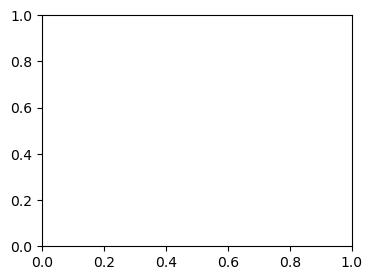

In [58]:
makefig(obs_d02, d02, var_name)

## WRF Validation & Analyses!

### Basic stats

#### Overall Stats

In [110]:
import pandas as pd
import numpy as np
import scipy.stats as st
from netCDF4 import Dataset

####################################################################################################################################
# Functions for model evaluation
def stats(data, prediction):
    x, y = data[~np.isnan(data)], prediction[~np.isnan(data)]  # get rid of NaNs
    mu_d, mu_p = np.mean(x), np.mean(y)
    mb = np.sum(y - x) / len(x)
    ge = np.mean(np.abs(x - y))
    rmse = np.sqrt(np.mean((y - x) ** 2))
    r, p = st.pearsonr(x, y)
    return mu_d, mu_p, mb, ge, rmse, r, p

####################################################################################################################################

# Read netCDF for location information

def validate_meterology_overall(sim):
    d02 = Dataset(f"/projects/b1045/wrf-cmaq/output/CONUS4K/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/lat_lon_CONUS4K_d02.nc")
    lat, lon = d02['LAT'][0][0].data, d02['LON'][0][0].data
    
    # Directory and variables for CMAQ run
    domain = 'd02'
    dir_WRF = r"/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/"
    var = ['t2', 'rh', 'winddir', 'winds']
    
    years = ['2016'] * 4
    months = ['1'] * 4
    days = ['31'] * 4
    months_start = ['1'] * 4
    years_start = ['2016'] * 4
    ss = sim * 4
    
    # Format file names
    wrf_files_d02 = [dir_WRF + sim[i] + '/' + v + 'd02.csv' for v in var for i in range(len(sim))]
    print(wrf_files_d02)
    
    # Station data files for comparison
    station_files = [
        f'{sim[0]}/wrfcheck_withstations_{sim[0]}_012016.csv', 
        f'{sim[0]}/wrfcheck_withstations_{sim[0]}_RH.csv',
        f'{sim[0]}/wrfcheck_withstations_{sim[0]}_WindDir.csv',
        f'{sim[0]}/wrfcheck_withstations_{sim[0]}_Wind.csv',
    ]
    
    # Process data for `d02`
    results = []
    
    for f in range(len(wrf_files_d02)):
        stn = pd.read_csv(dir_WRF + station_files[f], index_col=0)
        
        times = pd.read_csv(dir_WRF + ss[f] + '/completeddata_mini_extras2.csv', index_col=0)
        times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
        
        # Filter and process the station data
        stn_d02 = stn[stn.in_d02 == True].reset_index()
        obs_d02 = pd.DataFrame([stn_d02[str(i)].tolist() for i in range(len(times))])
        d02 = pd.read_csv(wrf_files_d02[f], index_col=0).T
    
        # Convert units (temperature, wind speed)
        if f == 0:
            obs_d02 = (obs_d02 - 32) * 5 / 9 + 273.15  # Convert Fahrenheit to Kelvin
        if f == 3:
            d02 = 2.236936 * d02  # Convert m/s to mph
        
        # Format time columns and align data
        times = np.array(pd.to_datetime(times['0'])[0:len(times)])
        d02['dt'] = np.array(times_perf)[0:len(d02) + 1]
        obs_d02['dt'] = times
        
        # Resample to hourly averages
        obs_d02 = obs_d02.set_index('dt').resample('h').mean()
        d02 = d02.set_index('dt')
    
        # Flatten the 2D arrays for element-wise comparison
        obs_flat = obs_d02.to_numpy().flatten()
        obs_flat = np.where(obs_flat == 2237.0, np.nan, obs_flat)  # Replace 2237.0 with NaN
        d02_flat = d02[5:].to_numpy().flatten()
        
        # Calculate statistics
        #print(max(obs_flat))
        var_name = var[f] + 'd02'
        mu_d, mu_p, mb, ge, rmse, r, p = stats(obs_flat, d02_flat)
        
        # Store results
        results.append({
            'Variable': var_name,
            'Mean Observed': mu_d,
            'Mean Predicted': mu_p,
            'Mean Bias': mb,
            'Gross Error': ge,
            'RMSE': rmse,
            'Pearson r': r,
            'p-value': p
        })
    return results

# Convert results to DataFrame for summary
sim_2020 = ['output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852']
sim = ['output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852']

results_df_2020 = pd.DataFrame(validate_meterology_overall(sim_2020))
results_df = validate_meterology_overall(sim)

results_df = pd.DataFrame(results_df)


['/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852/t2d02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852/rhd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852/winddird02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852/windsd02.csv']


/tmp/ipykernel_232800/2967358005.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/2967358005.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/2967358005.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/2967358005.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{m

['/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/t2d02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/rhd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/winddird02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/windsd02.csv']


/tmp/ipykernel_232800/2967358005.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/2967358005.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/2967358005.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/2967358005.py:56: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{m

In [107]:
results_df_2020 = results_df_2020.set_index("Variable")
results_df_2020

,Mean Observed,Mean Predicted,Mean Bias,Gross Error,RMSE,Pearson r,p-value
Variable,,,,,,,
t2d02,274.691087,274.630288,-0.060799,2.226803,2.974846,0.940331,0.0
rhd02,70.149899,71.226183,1.076284,11.763162,15.344042,0.721437,0.0
winddird02,183.141772,206.994786,23.853014,66.870016,116.951331,0.464809,0.0
windsd02,8.421246,7.268858,-1.152388,3.383897,4.816958,0.670041,0.0


In [108]:
results_df = results_df.set_index("Variable")
results_df

,Mean Observed,Mean Predicted,Mean Bias,Gross Error,RMSE,Pearson r,p-value
Variable,,,,,,,
t2d02,274.691087,274.617392,-0.073695,2.225977,2.974399,0.940362,0.0
rhd02,70.149899,71.246472,1.096573,11.741475,15.312486,0.722230,0.0
winddird02,183.141772,207.028413,23.886641,66.826147,116.900272,0.465361,0.0
windsd02,8.421246,7.268557,-1.152689,3.384967,4.817573,0.669937,0.0


In [4]:
var ="Mean Bias"
print(f"PERCENT DIFFERENCE in {var}")
(results_df_2020[var] - results_df[var]) / results_df_2020[var] * 100

PERCENT DIFFERENCE in Mean Bias


Variable
t2d02   -21.211128
Name: Mean Bias, dtype: float64

#### Stats by station

In [13]:
import pandas as pd
import numpy as np
import scipy.stats as st
from netCDF4 import Dataset

####################################################################################################################################
# Functions for model evaluation
def stats(data, prediction):
    x, y = data[~np.isnan(data)], prediction[~np.isnan(data)]  # get rid of NaNs
    if x.shape[0] < 2 or y.shape[0]<2:
        return 0,0,0,0,0,0,0
    mu_d, mu_p = np.mean(x), np.mean(y)
    mb = np.sum(y - x) / len(x)
    ge = np.mean(np.abs(x - y))
    rmse = np.sqrt(np.mean((y - x) ** 2))
    r, p = st.pearsonr(x, y)
    return mu_d, mu_p, mb, ge, rmse, r, p

####################################################################################################################################

# Read netCDF for location information
sim_2020 = ['output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852']
sim = ['output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852']
def stats_by_station(sim):
    
    d02 = Dataset(f"/projects/b1045/wrf-cmaq/output/CONUS4K/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/lat_lon_CONUS4K_d02.nc")
    lat, lon = d02['LAT'][0][0].data, d02['LON'][0][0].data
    
    # Directory and variables for CMAQ run
    domain = 'd02'
    dir_WRF = r"/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/"
    var = ['t2', 'rh', 'winds', 'winddir']
    
    years = ['2016'] * 4
    months = ['1'] * 4
    days = ['31'] * 4
    months_start = ['1'] * 4
    years_start = ['2016'] * 4
    ss = sim * 4
    
    # Format file names
    wrf_files_d02 = [dir_WRF + sim[i] + '/' + v + 'd02.csv' for v in var for i in range(len(sim))]
    print(wrf_files_d02)
    
    # Station data files for comparison
    station_files = [
        f'{sim[0]}/wrfcheck_withstations_{sim[0]}_012016.csv', 
        f'{sim[0]}/wrfcheck_withstations_{sim[0]}_RH.csv',
        f'{sim[0]}/wrfcheck_withstations_{sim[0]}_Wind.csv',
        f'{sim[0]}/wrfcheck_withstations_{sim[0]}_WindDir.csv'
    ]
    
    # Process data for `d02`
    results = []
    
    for f in range(len(wrf_files_d02)):
        stn = pd.read_csv(dir_WRF + station_files[f], index_col=0)
        
        times = pd.read_csv(dir_WRF + ss[f] + '/completeddata_mini_extras2.csv', index_col=0)
        times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
        
        # Filter and process the station data
        stn_d02 = stn[stn.in_d02 == True].reset_index()
        obs_d02 = pd.DataFrame([stn_d02[str(i)].tolist() for i in range(len(times))])
        d02 = pd.read_csv(wrf_files_d02[f], index_col=0).T
    
        # Convert units (temperature, wind speed)
        if f == 0:
            obs_d02 = (obs_d02 - 32) * 5 / 9 + 273.15  # Convert Fahrenheit to Kelvin
        if f == 2:
            d02 = 2.236936 * d02  # Convert m/s to mph
        
        # Format time columns and align data
        times = np.array(pd.to_datetime(times['0'])[0:len(times)])
        d02['dt'] = np.array(times_perf)[0:len(d02) + 1]
        obs_d02['dt'] = times
        
        # Resample to hourly averages
        obs_d02 = obs_d02.set_index('dt').resample('h').mean()
        d02 = d02.set_index('dt')
    
        # Loop through each station and calculate statistics for each row
        for col in obs_d02.columns:
            
            # Select the observed data for this station (flatten the values for comparison)
            obs_station_data = obs_d02[col].to_numpy().flatten()
            d02_station_data = d02[col][5:].to_numpy().flatten()  # Assuming d02 data starts at column 5
            
            # Calculate statistics for the station
            mu_d, mu_p, mb, ge, rmse, r, p = stats(obs_station_data, d02_station_data)
            
            # Store results for this station
            results.append({
                'Station': col,
                'Variable': var[f] + 'd02',
                'Mean Observed': mu_d,
                'Mean Predicted': mu_p,
                'Mean Bias': mb,
                'Gross Error': ge,
                'RMSE': rmse,
                'Pearson r': r,
            })
    return results

# Convert results to DataFrame for summary
results_df_by_station_2020 = pd.DataFrame(stats_by_station(sim_2020))

# Display or save the results DataFrame
results_df_by_station = pd.DataFrame(stats_by_station(sim))


['/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852/t2d02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852/rhd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852/windsd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852/winddird02.csv']


/tmp/ipykernel_232800/599320173.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/599320173.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/599320173.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/599320173.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{month

['/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/t2d02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/rhd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/windsd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/winddird02.csv']


/tmp/ipykernel_232800/599320173.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/599320173.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/599320173.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
/tmp/ipykernel_232800/599320173.py:60: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{month

In [14]:
# Get average station values with latitude and longitude
sim = ['output_CONUS4K_d02_2020_RWC_4km_sf_rrtmg_10_10_1_v3852']

# Station data files for comparison
station_files = [
    f'{sim[0]}/wrfcheck_withstations_{sim[0]}_012016.csv', 
    f'{sim[0]}/wrfcheck_withstations_{sim[0]}_RH.csv',
    f'{sim[0]}/wrfcheck_withstations_{sim[0]}_Wind.csv',
    f'{sim[0]}/wrfcheck_withstations_{sim[0]}_WindDir.csv'
]

# Directory and variables for CMAQ run
dir_WRF = r"/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/"
var = ['t2', 'rh', 'winds', 'winddir']

# Format file names
wrf_files_d02 = [dir_WRF + sim[i] + '/' + v + 'd02.csv' for v in var for i in range(len(sim))]

# Projection parameters and origin
import pandas as pd
from pyproj import Proj, Transformer, CRS

xorig = -2292000
yorig = -1584000
cell_size = 4000

# Define the source CRS using Lambert Conformal Conic parameters
source_crs = CRS.from_proj4('+proj=lcc +lat_1=33 +lat_2=45 +lon_0=-97 +lat_0=40 +datum=WGS84')

# Create a Transformer from the source CRS (LCC) to WGS84 (EPSG:4326)
transformer = Transformer.from_crs(source_crs, "EPSG:4326", always_xy=True)

for f in range(len(wrf_files_d02[0:1])):
    stn = pd.read_csv(dir_WRF + station_files[f], index_col=0)
    stn_d02 = stn[stn.in_d02 == True].reset_index()
        
    # Compute Cartesian coordinates (x, y) for each grid cell
    stn_d02['x'] = xorig + stn_d02['yy_d02'] * cell_size
    stn_d02['y'] = yorig + stn_d02['xx_d02'] * cell_size
    
    # Transform Cartesian coordinates to latitude and longitude
    stn_d02['lon'], stn_d02['lat'] = transformer.transform(stn_d02['x'], stn_d02['y'])
    
    # Drop intermediate Cartesian coordinates if not needed
    stn_d02.drop(columns=['x', 'y'], inplace=True)
    

stn_d02

,index,0,1,2,3,4,5,6,7,8,...,737,738,739,740,xx_d02,yy_d02,lat,lon,in_d02,UTC_offset
0,0,10.0,10.0,10.0,8.0,8.0,6.0,7.0,8.0,14.0,...,29.000000,NaN,NaN,NaN,404,416,40.057848,-104.407923,True,6.0
1,1,42.0,41.0,41.0,41.0,40.0,40.0,39.0,39.0,39.0,...,56.000000,53.00,53.0,NaN,301,904,35.585778,-82.273894,True,4.0
2,2,54.0,53.0,53.0,52.0,51.0,50.0,49.0,49.0,48.0,...,63.000000,60.00,60.0,NaN,222,890,32.844737,-83.408557,True,4.0
3,3,32.0,32.0,31.0,30.0,31.0,31.0,30.0,28.0,28.0,...,65.000000,65.00,65.0,NaN,328,760,37.220221,-88.518097,True,5.0
4,4,60.0,59.0,58.0,56.0,55.0,54.0,54.0,55.0,55.0,...,60.000000,58.00,58.0,NaN,247,926,33.529849,-81.713616,True,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,219,26.0,26.0,25.0,25.0,24.0,24.0,23.0,23.0,22.0,...,33.333333,33.25,33.0,NaN,561,841,45.229396,-83.303667,True,4.0
220,220,20.0,NaN,NaN,NaN,NaN,NaN,NaN,19.0,NaN,...,NaN,NaN,NaN,NaN,592,759,46.712140,-87.287580,True,4.0
221,221,28.0,28.0,26.5,26.0,26.0,27.0,27.0,26.0,26.0,...,44.500000,43.00,41.0,41.0,496,811,43.059912,-85.245299,True,4.0
222,222,17.0,18.0,19.0,20.0,21.0,21.0,22.0,22.0,21.0,...,37.000000,35.00,35.0,NaN,472,707,42.574992,-90.442223,True,5.0


In [15]:
temp_results_2020 = results_df_by_station_2020.loc[results_df_by_station_2020['Variable'] == 't2d02']
temp_results_2020['Mean Observed'] = (temp_results_2020['Mean Observed'] - 273.15)
temp_results_2020.loc[:, 'lat'] = stn_d02['lat'].values
temp_results_2020.loc[:, 'lon'] = stn_d02['lon'].values

temp_results_baseline = results_df_by_station.loc[results_df_by_station['Variable'] == 't2d02']
temp_results_baseline['Mean Observed'] = (temp_results_baseline['Mean Observed'] - 273.15)
temp_results_baseline['lat'] = stn_d02['lat']
temp_results_baseline['lon'] = stn_d02['lon']

ws_results_2020 = results_df_by_station_2020.loc[results_df_by_station_2020['Variable'] == 'windsd02'].reset_index()
ws_results_2020['lat'] = stn_d02['lat']
ws_results_2020['lon'] = stn_d02['lon']

ws_results_baseline = results_df_by_station.loc[results_df_by_station['Variable'] == 'windsd02'].reset_index()
ws_results_baseline.loc[:, 'lat'] = stn_d02['lat']
ws_results_baseline['lon'] = stn_d02['lon']

rh_results_2020 = results_df_by_station_2020.loc[results_df_by_station_2020['Variable'] == 'rhd02'].reset_index()
rh_results_2020['lat'] = stn_d02['lat']
rh_results_2020['lon'] = stn_d02['lon']

rh_results_baseline = results_df_by_station.loc[results_df_by_station['Variable'] == 'rhd02'].reset_index()
rh_results_baseline['lat'] = stn_d02['lat']
rh_results_baseline['lon'] = stn_d02['lon']


wd_results_2020 = results_df_by_station_2020.loc[results_df_by_station_2020['Variable'] == 'winddird02'].reset_index()
wd_results_2020['lat'] = stn_d02['lat']
wd_results_2020['lon'] = stn_d02['lon']

wd_results_baseline = results_df_by_station.loc[results_df_by_station['Variable'] == 'winddird02'].reset_index()
wd_results_baseline.loc[:, 'lat'] = stn_d02['lat']
wd_results_baseline['lon'] = stn_d02['lon']

/tmp/ipykernel_232800/2237410814.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_results_2020['Mean Observed'] = (temp_results_2020['Mean Observed'] - 273.15)
/tmp/ipykernel_232800/2237410814.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_results_2020.loc[:, 'lat'] = stn_d02['lat'].values
/tmp/ipykernel_232800/2237410814.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

In [16]:
ws_results_2020['Pearson r'].quantile(0.25)

0.6043838441955214

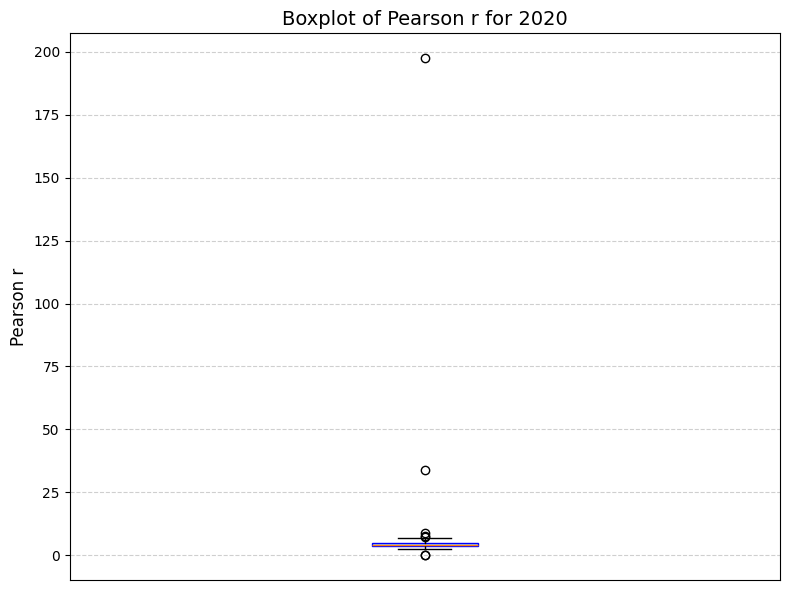

In [20]:
import matplotlib.pyplot as plt

def plot_boxplot(data, title="Boxplot of Pearson r", ylabel="Pearson r"):
    """
    Create a boxplot for the given data.

    Args:
        data (pd.Series or list): Data to plot.
        title (str): Title of the plot.
        ylabel (str): Label for the y-axis.
    """
    # Create the figure and axis
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Create the boxplot
    ax.boxplot(data, patch_artist=True, boxprops=dict(facecolor='lightblue', color='blue'))
    
    # Set title and labels
    ax.set_title(title, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.set_xticks([])  # Remove x-ticks since it's a single boxplot
    ax.grid(True, axis='y', linestyle='--', alpha=0.6)
    
    # Show the plot
    plt.tight_layout()
    plt.show()

# Example usage
plot_boxplot(ws_results_2020['RMSE'], title="Boxplot of Pearson r for 2020", ylabel="Pearson r")


In [24]:
ws_results_2020.loc[ws_results_2020['RMSE'] > 197.5]

,index,Station,Variable,Mean Observed,Mean Predicted,Mean Bias,Gross Error,RMSE,Pearson r,lat,lon
94,542,94,windsd02,25.059524,8.172071,-16.887453,20.771882,197.509658,0.018955,41.403431,-76.645695


### Combine files into one average (proto for Quest py script)

In [56]:

import xarray as xr
# Variables of interest
runname = 'output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852'
dirToWRF = f'/projects/b1045/wrf-cmaq/output/CONUS4K/{runname}/'
filenames_d02 = sorted(glob.glob(os.path.join(dirToWRF, "wrfout_*")))
variables_of_interest = ['T2', 'Q2', 'U10', 'V10']

datasets =[]
# Load and combine all datasets along a new dimension (e.g., 'day')
for file in filenames_d02[0:2]:
    dataset = xr.open_dataset(file)
    selected_data = dataset[variables_of_interest]
    datasets.append(selected_data)

combined_dataset = xr.concat(datasets, dim='Time')

average_dataset = combined_dataset.mean(dim="Time", keep_attrs=True)

# Manually copy over non-Time coordinates
for coord in combined_dataset.coords:
    if coord != "Time":  # Exclude the dimension being reduced
        average_dataset.coords[coord] = combined_dataset.coords[coord]

average_dataset = average_dataset.drop_dims("Time")

#average_dataset.to_netcdf(output_file)
average_dataset = average_dataset.assign_coords({
    "XLONG": combined_dataset["XLONG"].isel(Time=0),
    "XLAT": combined_dataset["XLAT"].isel(Time=0)
})


#print(f"Averaged file saved as {output_file}")

In [61]:
# Write to a NetCDF file
del average_dataset.coords["XTIME"]

output_file = "test3.nc"
average_dataset.to_netcdf(output_file)

In [62]:
average_dataset

<xarray.Dataset> Size: 21MB
Dimensions:  (south_north: 738, west_east: 1167)
Coordinates:
    XLAT     (south_north, west_east) float32 3MB 23.11 23.12 ... 48.31 48.29
    XLONG    (south_north, west_east) float32 3MB -119.2 -119.1 ... -64.82
Dimensions without coordinates: south_north, west_east
Data variables:
    T2       (south_north, west_east) float32 3MB 292.9 292.9 ... 273.1 273.3
    Q2       (south_north, west_east) float32 3MB 0.01106 0.01107 ... 0.003797
    U10      (south_north, west_east) float32 3MB -2.099 -2.06 ... -2.831 -3.1
    V10      (south_north, west_east) float32 3MB -7.86 -7.957 ... 1.129 1.034
Attributes: (12/126)
    TITLE:                            OUTPUT FROM WRF V3.8 MODEL
    START_DATE:                      2015-12-23_00:00:00
    SIMULATION_START_DATE:           2015-12-23_00:00:00
    WEST-EAST_GRID_DIMENSION:        1168
    SOUTH-NORTH_GRID_DIMENSION:      739
    BOTTOM-TOP_GRID_DIMENSION:       36
    ...                              ...
    NUM_LAND_CAT:                    40
    ISWATER:                         17
    ISLAKE:                          -1
    ISICE:                           15
    ISURBAN:                         13
    ISOILWATER:                      14

### Statistics over time and diurnal profiles

In [66]:
import pandas as pd
import numpy as np
import scipy.stats as st
from netCDF4 import Dataset

####################################################################################################################################
# Functions for model evaluation
def stats(data, prediction):
    x, y = data[~np.isnan(data)], prediction[~np.isnan(data)]  # get rid of NaNs
    mu_d, mu_p = np.mean(x), np.mean(y)
    mb = np.sum(y - x) / len(x) if len(x) > 0 else np.nan  # Handle division by zero
    ge = np.mean(np.abs(x - y)) if len(x) > 0 else np.nan
    rmse = np.sqrt(np.mean((y - x) ** 2)) if len(x) > 0 else np.nan
    r, p = st.pearsonr(x, y) if len(x) > 0 else (np.nan, np.nan)  # Handle case where no valid data
    return mu_d, mu_p, mb, ge, rmse, r, p

####################################################################################################################################

# Read netCDF for location information
sim = ['output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852']

d02 = Dataset(f"/projects/b1045/wrf-cmaq/output/CONUS4K/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/lat_lon_CONUS4K_d02.nc")
lat, lon = d02['LAT'][0][0].data, d02['LON'][0][0].data

# Directory and variables for CMAQ run
domain = 'd02'
dir_WRF = r"/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/"
var = ['t2', 'rh', 'winds', 'winddir']

years = ['2016'] * 4
months = ['1'] * 4
days = ['31'] * 4
months_start = ['1'] * 4
years_start = ['2016'] * 4
ss = sim * 4

# Format file names
wrf_files_d02 = [dir_WRF + sim[i] + '/' + v + 'd02.csv' for v in var for i in range(len(sim))]
print(wrf_files_d02)

# Station data files for comparison
station_files = [
    f'{sim[0]}/wrfcheck_withstations_{sim[0]}_012016.csv', 
    f'{sim[0]}/wrfcheck_withstations_{sim[0]}_RH.csv',
    f'{sim[0]}/wrfcheck_withstations_{sim[0]}_Wind.csv',
    f'{sim[0]}/wrfcheck_withstations_{sim[0]}_WindDir.csv'
]

# Process data for `d02`
results = []

def get_stats_by_day(wrf_files_d02):
    for f in range(len(wrf_files_d02)):
        stn = pd.read_csv(dir_WRF + station_files[f], index_col=0)
        
        times = pd.read_csv(dir_WRF + ss[f] + '/completeddata_mini_extras2.csv', index_col=0)
        times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')
        
        # Filter and process the station data
        stn_d02 = stn[stn.in_d02 == True].reset_index()
        obs_d02 = pd.DataFrame([stn_d02[str(i)].tolist() for i in range(len(times))])
        d02 = pd.read_csv(wrf_files_d02[f], index_col=0).T
        
        # Convert units (temperature, wind speed)
        if f == 0:
            obs_d02 = (obs_d02 - 32) * 5 / 9 + 273.15  # Convert Fahrenheit to Kelvin
        if f == 2:
            d02 = 2.236936 * d02  # Convert m/s to mph
        
        # Format time columns and align data
        times = np.array(pd.to_datetime(times['0'])[0:len(times)])
        d02['dt'] = np.array(times_perf)[0:len(d02) + 1]
        d02 = d02[5:]
        obs_d02['dt'] = times
        
        # Set index for both DataFrames
        obs_d02 = obs_d02.set_index('dt')
        d02 = d02.set_index('dt')
        
        # Loop through each day in the date range
        for day in pd.date_range(start=f'{years[f]}-{months[f]}-01', end=f'{years[f]}-{months[f]}-{days[f]}'):
            # Filter data for the specific day
            obs_daily = obs_d02.loc[day.strftime('%Y-%m-%d')]
            d02_daily = d02.loc[day.strftime('%Y-%m-%d')]
        
             # Ensure both datasets are aligned
            # Remove duplicate indices
            obs_daily = obs_daily[~obs_daily.index.duplicated(keep='first')]
            d02_daily = d02_daily[~d02_daily.index.duplicated(keep='first')]
        
            # Ensure both datasets are aligned
            aligned_indices = obs_daily.index.intersection(d02_daily.index)
            obs_daily = obs_daily.loc[aligned_indices]
            d02_daily = d02_daily.loc[aligned_indices]
            
            # Flatten the 2D arrays for element-wise comparison
            obs_flat = obs_daily.to_numpy().flatten()
            d02_flat = d02_daily.to_numpy().flatten()
            
            # Skip if there are no valid observations or predictions for the day
            if np.all(np.isnan(obs_flat)) or np.all(np.isnan(d02_flat)):
                continue
            
            var_name = f"{var[f]}d02 - {day.strftime('%Y-%m-%d')}"
            mu_d, mu_p, mb, ge, rmse, r, p = stats(obs_flat, d02_flat)
            
            # Store results
            results.append({
                'Variable': var_name,
                'Mean Observed': mu_d,
                'Mean Predicted': mu_p,
                'Mean Bias': mb,
                'Gross Error': ge,
                'RMSE': rmse,
                'Pearson r': r,
                'p-value': p
            })
    return results

results =  get_stats_by_day(wrf_files_d02)

# Convert results to DataFrame for summary
results_df = pd.DataFrame(results)

['/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/t2d02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/rhd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/windsd02.csv', '/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/winddird02.csv']


/tmp/ipykernel_163797/3745798136.py:57: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_163797/3745798136.py:57: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_163797/3745798136.py:57: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_163797/3745798136.py:57: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



/tmp/ipykernel_163797/340548909.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  var_results["Mean Observed"] -= 273.15
/tmp/ipykernel_163797/340548909.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  var_results["Mean Predicted"] -= 273.15


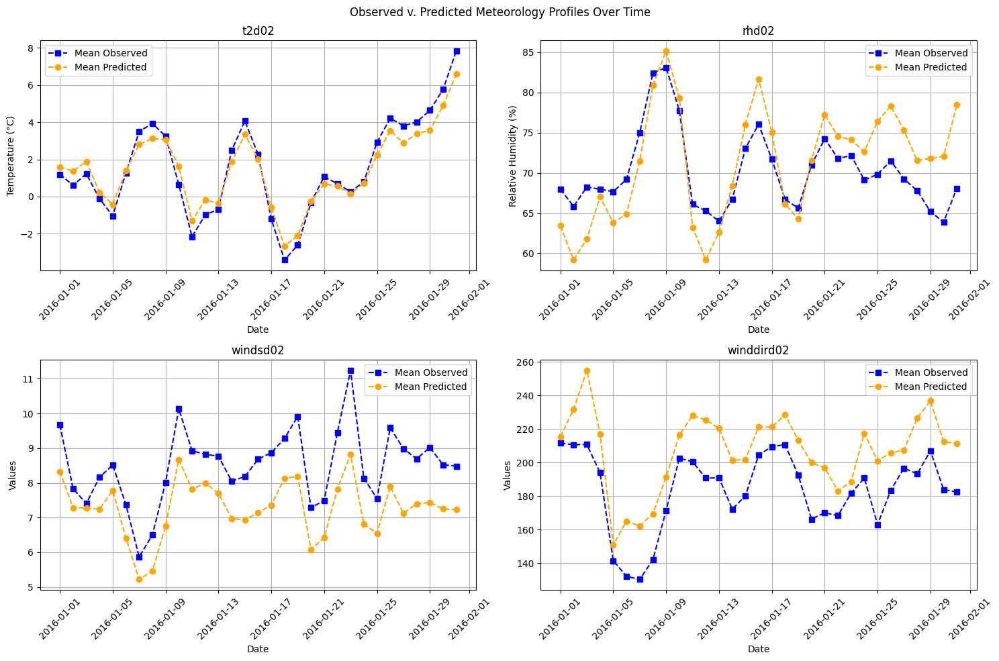

In [42]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming `results_df` is already prepared with 'Date' as the index
results_df['Date'] = pd.to_datetime(results_df['Variable'].str.split(' - ').str[1])  # Extract the date from Variable
results_df.set_index('Date', inplace=True)

# Define variable-specific y-axis labels with units
variable_ylabels = {
    "t2d02": "Temperature (°C)",
    "rhd02": "Relative Humidity (%)",
    "wsd02": "Wind Speed (m/s)",
    "wdd02": "Wind Direction (degrees)"
}

# Extract unique variable categories
variable_categories = results_df['Variable'].str.split(' - ').str[0].unique()

def plot_four_panel_diff():
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # Create a 2x2 grid of subplots
    axes = axes.flatten()  # Flatten the 2D array of axes for easier iteration

    for i, var in enumerate(variable_categories):
        if i >= 4:  # Ensure only four panels are plotted
            break
        
        # Filter results for the current variable category
        var_results = results_df[results_df['Variable'].str.startswith(var)]
        
        if "t2" in var:
            var_results["Mean Observed"] -= 273.15
            var_results["Mean Predicted"] -= 273.15
            
        # Plot Mean Observed and Mean Predicted
        axes[i].plot(var_results.index, var_results["Mean Observed"], label="Mean Observed", linestyle='--', marker='s', color='blue')
        axes[i].plot(var_results.index, var_results["Mean Predicted"], label="Mean Predicted", linestyle='--', marker='o', color='orange')
        
        # Set title and axis labels
        axes[i].set_title(var)
        axes[i].set_xlabel("Date")
        ylabel = variable_ylabels.get(var, "Values")  # Default to "Values" if the variable isn't in the dictionary
        axes[i].set_ylabel(ylabel)
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].grid(True)
        axes[i].legend()
    
    # Remove unused subplots if there are fewer than 4 variables
    for j in range(i + 1, 4):
        fig.delaxes(axes[j])
    
    # Adjust layout
    fig.suptitle("Observed v. Predicted Meteorology Profiles Over Time")
    plt.tight_layout()
    plt.show()
    

plot_four_panel_diff()


In [55]:
def get_average_diurnal_profile(wrf_files_d02):
    diurnal_profiles = []

    for f in range(len(wrf_files_d02)):
        # Load station data and WRF output
        stn = pd.read_csv(dir_WRF + station_files[f], index_col=0)
        times = pd.read_csv(dir_WRF + ss[f] + '/completeddata_mini_extras2.csv', index_col=0)
        times_perf = pd.date_range(start=f'{months[f]}-01-{years[f]}', end=f'{months[f]}-{days[f]} {years[f]} 23:00:00', freq='H')

        # Process station data
        stn_d02 = stn[stn.in_d02 == True].reset_index()
        obs_d02 = pd.DataFrame([stn_d02[str(i)].tolist() for i in range(len(times))])
        d02 = pd.read_csv(wrf_files_d02[f], index_col=0).T

        # Unit conversions if necessary
        if f == 0:
            obs_d02 = (obs_d02 - 32) * 5 / 9 + 273.15  # Fahrenheit to Kelvin
        if f == 2:
            d02 = 2.236936 * d02  # m/s to mph

        # Format time columns and align data
        times = np.array(pd.to_datetime(times['0'])[0:len(times)])
        d02['dt'] = np.array(times_perf)[0:len(d02) + 1]
        d02 = d02[5:]
        obs_d02['dt'] = times

        # Set index for both DataFrames
        obs_d02 = obs_d02.set_index('dt')
        d02 = d02.set_index('dt')

        # Add a column for the hour of the day
        obs_d02['hour'] = obs_d02.index.hour
        d02['hour'] = d02.index.hour

        # Average across stations and compute diurnal profiles
        obs_diurnal_mean = obs_d02.groupby('hour').mean().mean(axis=1)
        d02_diurnal_mean = d02.groupby('hour').mean().mean(axis=1)

        # Combine observed and predicted averages into a DataFrame
        diurnal_profile = pd.DataFrame({
            f'{var[f]}_Observed': obs_diurnal_mean,
            f'{var[f]}_Predicted': d02_diurnal_mean
        })

        # Append to the list
        diurnal_profiles.append(diurnal_profile)

    # Concatenate all profiles into a single DataFrame
    combined_profiles = pd.concat(diurnal_profiles, axis=1)
    return combined_profiles

diurnal_profiles = get_average_diurnal_profile(wrf_files_d02)

/tmp/ipykernel_163797/642139861.py:8: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_163797/642139861.py:8: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_163797/642139861.py:8: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/tmp/ipykernel_163797/642139861.py:8: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



In [56]:
diurnal_profiles

,t2_Observed,t2_Predicted,rh_Observed,rh_Predicted,winds_Observed,winds_Predicted,winddir_Observed,winddir_Predicted
hour,,,,,,,,
0,275.119153,276.414430,68.912920,65.890870,7.928077,6.765123,180.138753,205.301779
1,274.619080,275.406014,70.699738,68.759939,7.743862,6.822755,175.206663,203.805479
2,274.112482,274.624437,72.167703,71.036408,7.738823,6.840825,175.234896,203.135808
3,273.776368,274.041806,73.208565,72.815217,7.714655,6.827968,175.041422,204.421267
4,274.230171,273.597248,75.251529,74.195510,7.725069,6.833944,172.978039,204.384448
5,272.943023,273.274625,75.873745,75.063842,8.214104,6.827407,176.673280,204.652973
6,272.937050,272.985281,75.885678,75.862876,9.240693,6.788291,175.405528,204.555210
7,272.741384,272.746811,76.264261,76.490497,7.552712,6.765433,174.835148,204.365447
8,272.529627,272.546948,76.863426,77.004310,7.527923,6.752389,174.480743,206.211989


In [57]:
import matplotlib.pyplot as plt

def plot_four_panel_diurnal_profiles(diurnal_profiles, variable_units):
    """
    Create a 4-panel plot for average diurnal profiles of observed and predicted values using Matplotlib.

    Args:
        diurnal_profiles (pd.DataFrame): DataFrame with rows as hours and columns for observed and predicted values.
        variable_units (dict): Dictionary mapping variable names to their units (e.g., {"Temperature": "C", ...}).
    """
    # Extract variable names from DataFrame
    variables = [col.split('_')[0] for col in diurnal_profiles.columns[::2]]

    # Create a 2x2 subplot layout
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    axes = axes.flatten()  # Flatten to iterate through a single list of axes

    for i, var in enumerate(variables):
        if i >= 4:  # Ensure only four panels are plotted
            break

        # Extract observed and predicted values for the current variable
        observed = diurnal_profiles[f"{var}_Observed"]
        predicted = diurnal_profiles[f"{var}_Predicted"]

        # Plot observed and predicted values
        axes[i].plot(
            diurnal_profiles.index, observed, label="Observed", linestyle='--', marker='o', color='blue'
        )
        axes[i].plot(
            diurnal_profiles.index, predicted, label="Predicted", linestyle='--', marker='s', color='orange'
        )

        # Set title, labels, and grid
        axes[i].set_title(f"{var} Diurnal Profile")
        axes[i].set_xlabel("Hour of the Day")
        ylabel = f"{var} ({variable_units.get(var, 'Values')})"
        axes[i].set_ylabel(ylabel)
        axes[i].grid(True)
        axes[i].legend()
        axes[i].tick_params(axis='x', rotation=45)

    # Remove unused subplots if there are fewer than 4 variables
    for j in range(i + 1, 4):
        fig.delaxes(axes[j])

    # Adjust layout and add a global title
    fig.suptitle("Average Diurnal Profiles of Observed and Predicted Values")
    plt.tight_layout()
    plt.show()


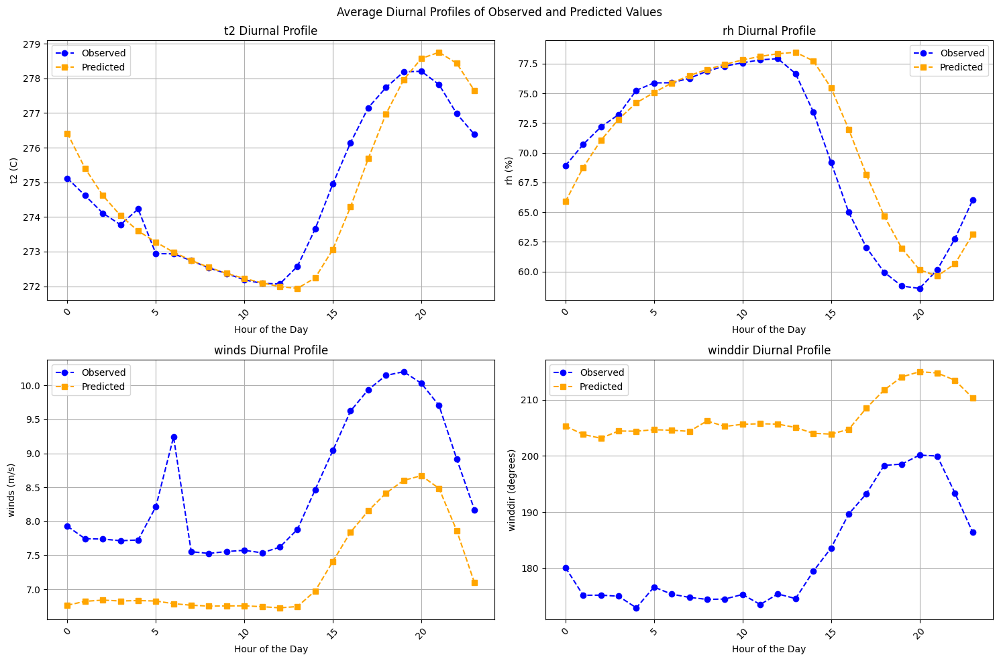

In [60]:
# Assuming diurnal_profiles is generated
variable_units = {
    "t2": "C",
    "winds": "m/s",
    "rh": "%",
    "winddir": "degrees"
}

plot_four_panel_diurnal_profiles(diurnal_profiles, variable_units)

### Plotting Weather Spatially

#### Plotting WRF

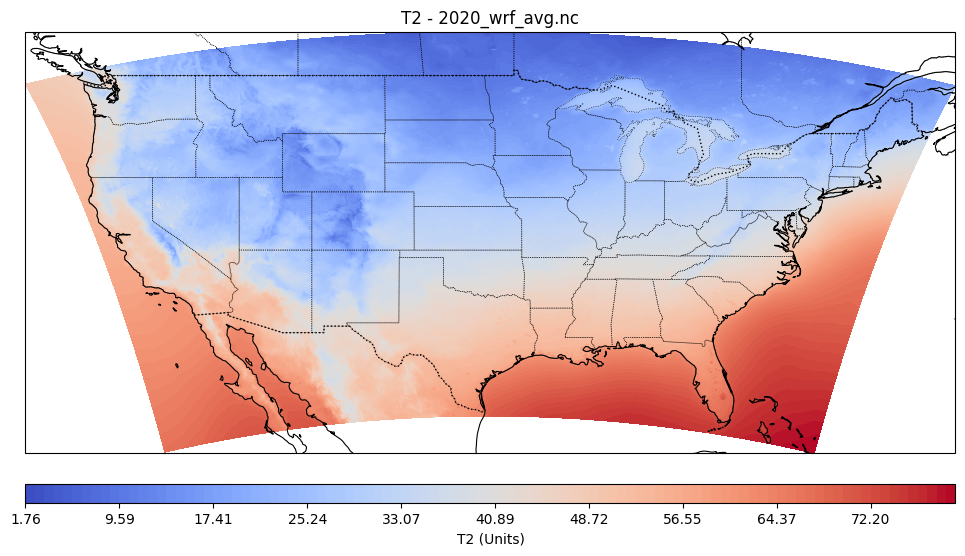

In [72]:
# Import necessary libraries
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from wrf import getvar, interplevel, to_np, latlon_coords
import cartopy.crs as crs
import cartopy.feature as creature
import xarray as xr

# # Variables of interest
# runname = 'output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852'
# dirToWRF = f'/projects/b1045/wrf-cmaq/output/CONUS4K/{runname}/'
# picdir = f'/home/ksz4578/Heat_Pump_Project/WRF_analyses/CMAQ_LCD/{runname}/figures/'

# # Gather WRF output files for domain 2 (d02) for a specific time range or single file
# filenames_d02 = sorted(glob.glob(os.path.join(dirToWRF, "wrfout_*")))

# Load the first file as an example

def plot_variable(filename, var_name, timeidx=0, save_plot=True):
    """
    Plots a specified variable from a WRF output file.
    
    Parameters:
    - filename: str, path to the WRF NetCDF file.
    - var_name: str, name of the variable to plot (e.g., 'T2', 'P', 'U', etc.).
    - timeidx: int, time index to plot (default is 0).
    - save_plot: bool, whether to save the plot to file (default is True).
    
    Returns:
    - None. Displays and optionally saves the plot.
    """
    # Load the WRF file
    xr_dataset = xr.open_dataset(filename)
    
    
    if var_name == "windspeed":
        u10 = xr_dataset["U10"]
        v10 = xr_dataset["V10"]
        variable_data = np.sqrt(u10**2 + v10**2)
    else:
        # Extract the variable
        variable_data = xr_dataset[var_name]
        
        # Example conversion for temperature (T2) from Kelvin to Fahrenheit
        if var_name == "T2":
            variable_data = (variable_data - 273.15) * 9/5 + 32  # Convert to Fahrenheit

    # Get latitude and longitude coordinates
    lats, lons = xr_dataset["XLAT"], xr_dataset["XLONG"]
    
    # Set min and max for the color scale based on data range
    min_var = np.nanmin(variable_data)
    max_var = np.nanmax(variable_data)
    
    # Plotting
    plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=crs.PlateCarree())
    var_plot = ax.contourf(lons, lats, variable_data, 
                            levels=np.linspace(min_var, max_var, 100), cmap="coolwarm", transform=crs.PlateCarree())
    
    # Add color bar with label
    cbar = plt.colorbar(var_plot, ax=ax, orientation="horizontal", pad=0.05, aspect=50)
    cbar.set_label(f"{var_name} (Units)")  # Change "Units" based on the variable

    # Add map features
    ax.coastlines('50m', linewidth=0.8)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.STATES, linestyle=':', linewidth=0.5)
    
    # Title and Labels
    plt.title(f"{var_name} - {filename}")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    
    plt.show()

    
# Example usage
plot_variable(filename='2020_wrf_avg.nc', var_name='T2')  # Change 'T2' to any other variable name you wish to plot.

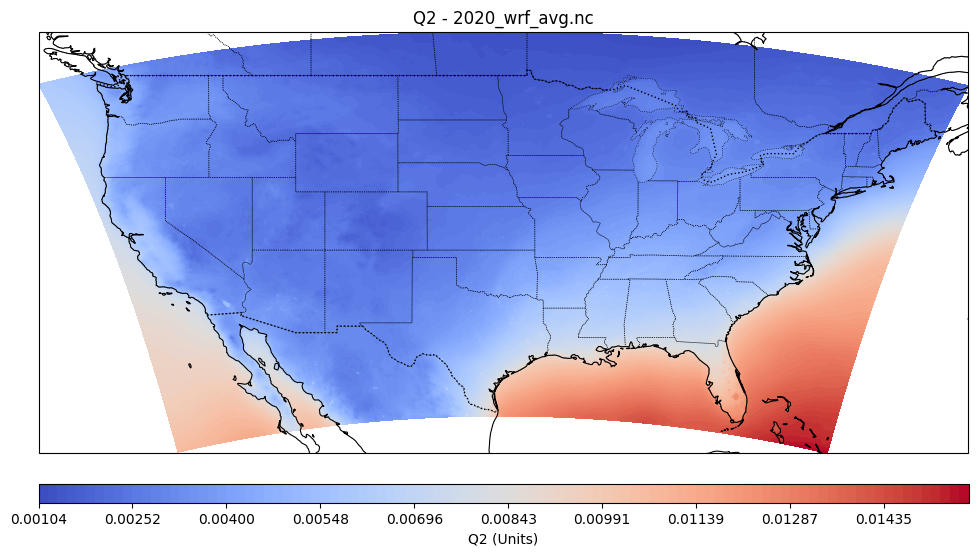

In [74]:
plot_variable(filename='2020_wrf_avg.nc', var_name='Q2')  # Change 'T2' to any other variable name you wish to plot.

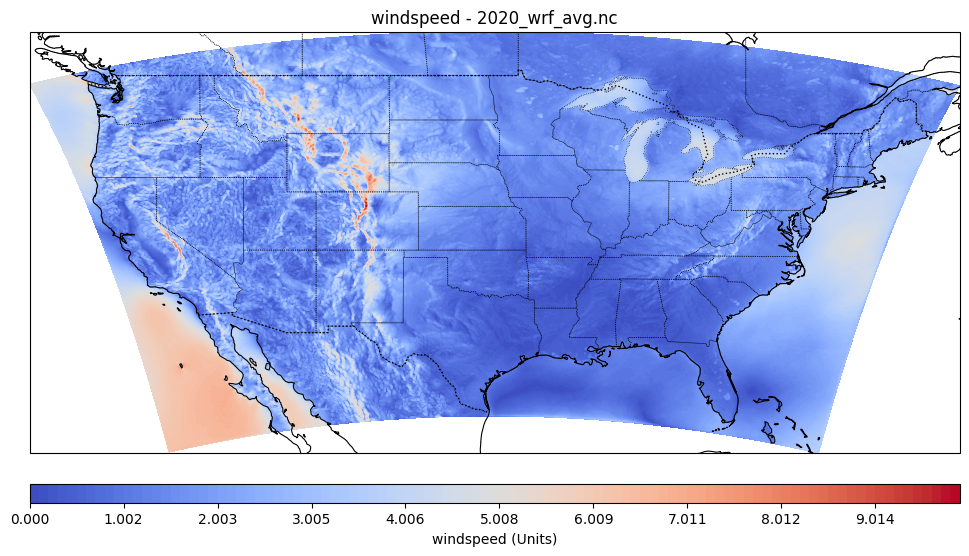

In [75]:
plot_variable(filename='2020_wrf_avg.nc', var_name='windspeed')  # Change 'T2' to any other variable name you wish to plot.

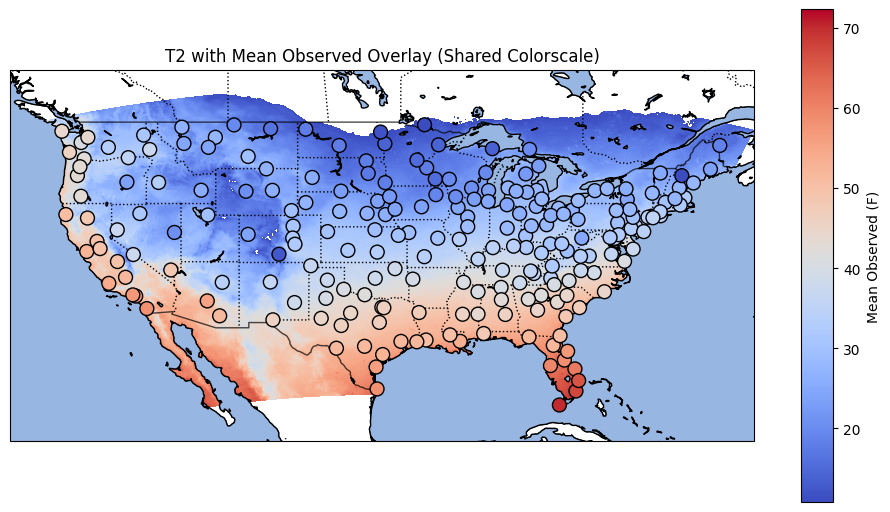

In [76]:
import matplotlib.pyplot as plt
import numpy as np
from cartopy import crs as ccrs
from cartopy.feature import NaturalEarthFeature, COLORS
import xarray as xr

def plot_spatial_with_points_shared_colorscale(
    filename, var_name, point_data, point_var, cmap='coolwarm'
):
    """
    Combines spatial plotting of WRF variable with overlayed point-based real data,
    using the same colorscale for both.

    Parameters:
    - filename: str, path to the WRF NetCDF file.
    - var_name: str, name of the WRF variable to plot.
    - point_data: pandas.DataFrame or dict-like, contains 'lat', 'lon', and real data for overlay.
    - point_var: str, name of the variable in point_data to overlay on the map.
    - timeidx: int, time index for WRF variable (default is 0).
    - cmap: str, colormap for both plots (default is 'coolwarm').
    - save_plot: bool, whether to save the plot (default is True).
    
    Returns:
    - None. Displays and optionally saves the combined plot.
    """
    # Load the WRF dataset
    xr_dataset = xr.open_dataset(filename)
    
    # Extract the spatial variable data
    if var_name == "windspeed":
        u10 = xr_dataset["U10"]
        v10 = xr_dataset["V10"]
        variable_data = np.sqrt(u10**2 + v10**2)
    else:
        variable_data = xr_dataset[var_name]
        if var_name == "T2":  # Convert temperature from Kelvin to Fahrenheit
            variable_data = (variable_data - 273.15) * 9 / 5 + 32

    # Extract latitude and longitude
    lats, lons = xr_dataset["XLAT"].values, xr_dataset["XLONG"].values
    
    # Determine shared 5th and 95th percentile bounds for colorscale
    all_values = np.concatenate([
        variable_data.values.flatten(),  # Flatten spatial data
        point_data[point_var].values     # Point data
    ])
    min_val = np.nanpercentile(all_values, 5)
    max_val = np.nanpercentile(all_values, 95)
    
    # Create the plot
    plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=ccrs.PlateCarree())
    
    # Spatial contour plot with shared colorscale
    spatial_plot = ax.contourf(
        lons, lats, variable_data, 
        levels=np.linspace(min_val, max_val, 100), cmap=cmap, transform=ccrs.PlateCarree()
    )
    # cbar = plt.colorbar(spatial_plot, ax=ax, orientation="horizontal", pad=0.05, aspect=50)
    # cbar.set_label(f"{var_name} (Units)")  # Replace "Units" with actual units
    
    # Add map features
    ax.coastlines('50m', linewidth=0.8)
    ax.add_feature(NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', scale='50m', edgecolor='black', facecolor='none', alpha=0.7))
    ax.add_feature(NaturalEarthFeature('physical', 'ocean', scale='50m', edgecolor='black', facecolor=COLORS['water']))
    ax.add_feature(NaturalEarthFeature('physical', 'lakes', scale='50m', edgecolor='black', facecolor=COLORS['water']))
    ax.add_feature(NaturalEarthFeature('cultural', 'admin_1_states_provinces_lines', scale='50m', edgecolor='black', facecolor='none', linestyle=':'))
    
    # Overlay validation points with shared colorscale
    scatter = ax.scatter(
        point_data['lon'], point_data['lat'], 
        c=point_data[point_var], cmap=cmap,
        s=100, edgecolor='black', transform=ccrs.PlateCarree(), vmin=min_val, vmax=max_val, zorder=3
    )
    point_cbar = plt.colorbar(scatter, ax=ax, orientation='vertical', shrink=0.8, aspect=15)
    point_cbar.set_label(f"{point_var} (F)")  # Replace "Units" with actual units
    
    # Add title and labels
    ax.set_title(f"{var_name} with {point_var} Overlay (Shared Colorscale)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()



# Plot with shared colorscale
plot_spatial_with_points_shared_colorscale(
    filename='2020_wrf_avg.nc',
    var_name='T2',
    point_data=temp_results_2020.loc[temp_results_2020.index != 17],
    point_var='Mean Observed',
    cmap='coolwarm'
)


#### Plotting Real Data

In [4]:
"""
temp_results_2020 
temp_results_baseline
ws_results_2020
ws_results_baseline
rh_results_2020
rh_results_baseline
"""

'\ntemp_results_2020 \ntemp_results_baseline\nws_results_2020\nws_results_baseline\nrh_results_2020\nrh_results_baseline\n'

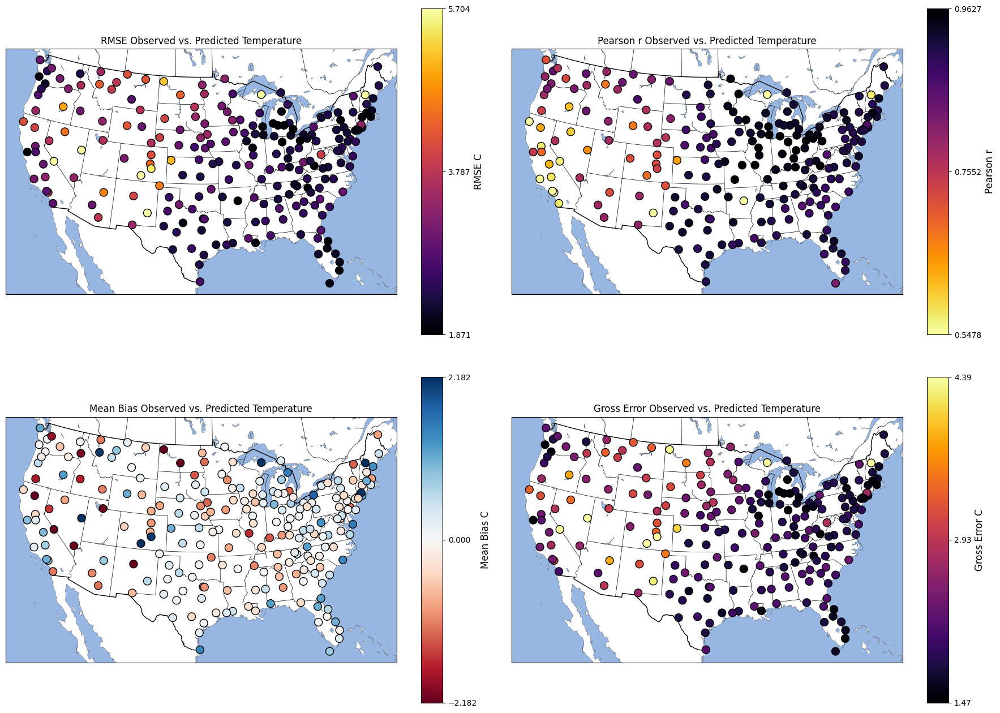

In [80]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Function to plot validation points for a given variable
def plot_validation_points(ax, data, var, title, cmap,cbar_label, difference = False):
    resol = '50m'  # use data at this scale
    state_color = 'black'
    
    bodr = cfeature.NaturalEarthFeature(category='cultural', edgecolor='black', name='admin_0_boundary_lines_land', scale='50m', facecolor='none', alpha=0.7)
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', scale=resol, edgecolor='black', facecolor=cfeature.COLORS['water'])
    lakes = cfeature.NaturalEarthFeature('physical', 'lakes', scale=resol, edgecolor='black', facecolor=cfeature.COLORS['water'])
    states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lines', scale='50m', edgecolor=state_color, facecolor='none')

    # Customize plot appearance
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])

    # Add features to the map
    ax.add_feature(ocean, linewidth=0.2, zorder=0)
    ax.add_feature(lakes, linewidth=0.2, zorder=0)
    ax.add_feature(states_provinces, edgecolor=state_color, linewidth=0.5, zorder=0)
    ax.add_feature(bodr, edgecolor=state_color, alpha=1)

    # Title
    ax.set_title(title) 

    if not difference:
        vmin = np.quantile(data[var], 0.025)
        vmax = np.quantile(data[var], 0.975)
    else:
        vmin = -max( [abs(np.quantile(data[var], 0.025)), abs(np.quantile(data[var], 0.975))] )
        vmax = -vmin 

    
    # Scatter plot
    sc = ax.scatter(data['lon'], data['lat'],
                    c=data[var], cmap=cmap,
                    s=100, edgecolor='black', transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax, zorder=3)

    # Add colorbar
    cbar = plt.colorbar(sc, ax=ax, orientation='vertical', shrink=0.8, aspect=15)
    cbar.set_label(cbar_label, fontsize=12)
    cbar.set_ticks([vmin, (vmin + vmax) / 2, vmax])

# Function to plot multiple variables on the same figure
def plot_multiple_variables(data, variables, unit, measure):
    target_proj = ccrs.LambertConformal(central_longitude=-97, central_latitude=40, standard_parallels=(33, 45))
    
    # Create the figure and axes (2x2 grid)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18, 14), subplot_kw={'projection': target_proj})
    
    # Loop through the variables and plot them
    plot_validation_points(axes[0,0] , data, variables[0], title = f"{variables[0]} Observed vs. Predicted {measure}", cmap = "inferno", cbar_label = f"RMSE {unit}")
    plot_validation_points(axes[0,1] , data, variables[1], title = f"{variables[1]} Observed vs. Predicted {measure}", cmap = "inferno_r", cbar_label = "Pearson r")
    plot_validation_points(axes[1,0] , data, variables[2], title = f"{variables[2]} Observed vs. Predicted {measure}",cmap = "RdBu",  cbar_label = f"Mean Bias {unit}", difference = True)
    plot_validation_points(axes[1,1] , data, variables[3], title = f"{variables[3]} Observed vs. Predicted {measure}", cmap = "inferno", cbar_label = f"Gross Error {unit}")

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

# Example usage
variables = ['RMSE', 'Pearson r', 'Mean Bias', 'Gross Error']  # Replace with your actual variable names
plot_multiple_variables(temp_results_2020, variables, unit = "C", measure = "Temperature")  # Adjust vmin, vmax as needed


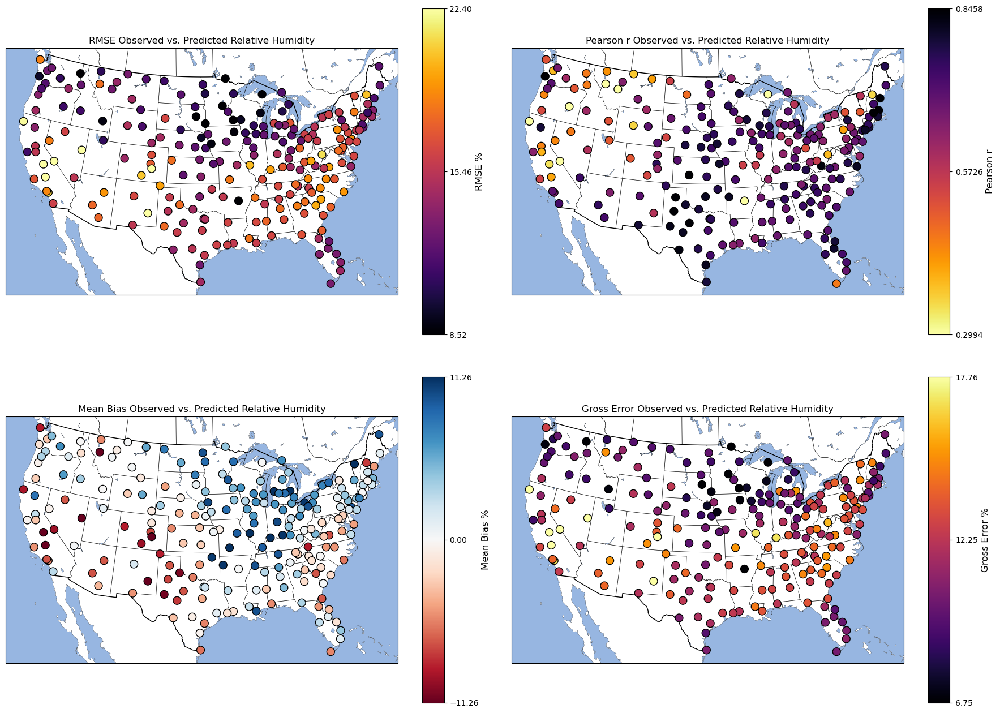

In [63]:
plot_multiple_variables(rh_results_2020, variables, unit = "%", measure = "Relative Humidity")  # Adjust vmin, vmax as needed


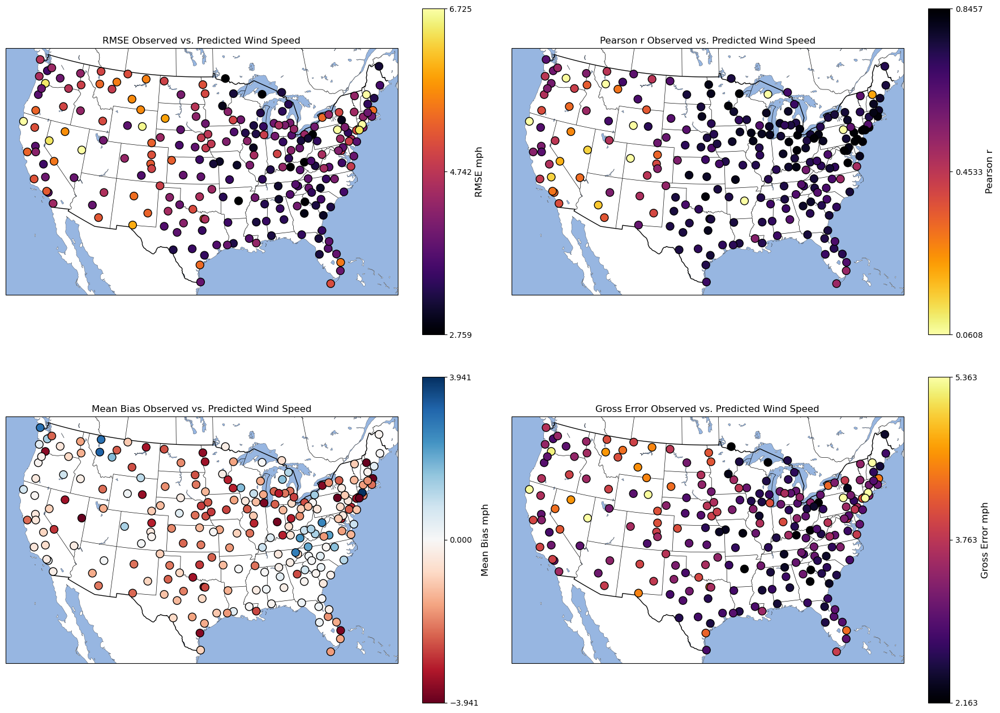

In [64]:
plot_multiple_variables(ws_results_2020, variables, unit = "mph", measure = "Wind Speed")  # Adjust vmin, vmax as needed


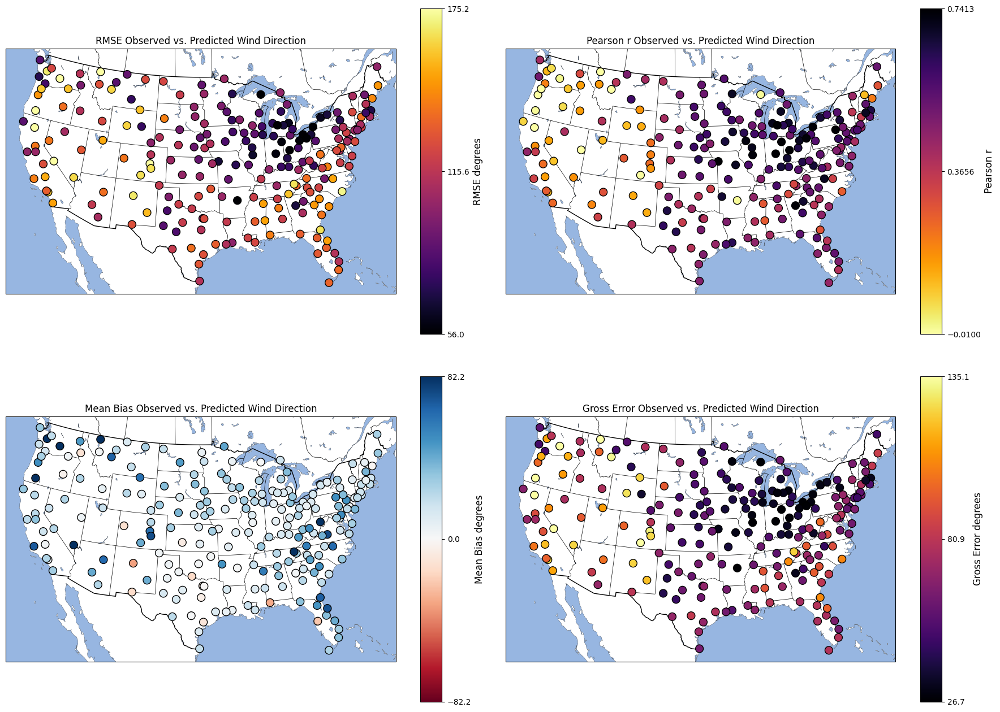

In [81]:
plot_multiple_variables(wd_results_2020, variables, unit = "degrees", measure = "Wind Direction")  # Adjust vmin, vmax as needed


# CMAQ Validation

## Proto code for validation script

In [ ]:
# Check wrf-cmaq output
# Need EPA annual AQS data
# Will append the corresponding CMAQ value to the file

import pandas as pd
import numpy as np
from netCDF4 import Dataset
from datetime import timedelta, date,datetime;

domain='d02_WHbase'
time='hourly'
year='2016'
month='01'
#epa_code=['42401','42602','44201','42101','88101']; var=['SO2','NO2','O3','CO','PM25_TOT']
stdate,enddt = 1,31
yr = 2016
mo = 1
name = '20160101'
start_dt = datetime(yr, mo, stdate)
end_dt = datetime(yr,mo,enddt,23)
fstart='COMBINE_ACONC_'

#input and output dirs
dir_cmaq ='/projects/b1045/wrf-cmaq/output/CONUS4K/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/postprocess/'
dir_epa='/home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/'

#gridfile
grid="/projects/b1045/wrf-cmaq/output/CONUS4K/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/lat_lon_CONUS4K_d02.nc"

# EPA codes for the diff species to make the file names of AQS fies
epa_code=['42401','42602','44201','42101','88101','81102']; var=['SO2','NO2','O3','CO','PM25_TOT','PM10'] #numerical identi vars
epa_files = [dir_epa+'%s_%s_%s.csv'%(time,epa_code[i],year,) for i in range(len(epa_code))]

la,lo='LAT','LON'
#cmaq_lon,cmaq_lat=np.array(Dataset(grid)[lo][0][0]),np.array(Dataset(grid)[la][0][0])
cmaq_lon,cmaq_lat=np.array(Dataset(grid)[lo]),np.array(Dataset(grid)[la])
llat,ulat,llon,ulon=cmaq_lat.min(), cmaq_lat.max(), cmaq_lon.min(), cmaq_lon.max()

In [1]:
# Check wrf-cmaq output
# Need EPA annual AQS data
# Will append the corresponding CMAQ value to the file

import pandas as pd
import numpy as np
from netCDF4 import Dataset
from datetime import timedelta, date,datetime;

In [2]:

domain='d02_WHbase'
time='hourly'
year='2016'
month='01'
#epa_code=['42401','42602','44201','42101','88101']; var=['SO2','NO2','O3','CO','PM25_TOT']
stdate,enddt = 1,31
yr = 2016
mo = 1
name = '20160101'
start_dt = datetime(yr, mo, stdate)
end_dt = datetime(yr,mo,enddt,23)
fstart='COMBINE_ACONC_'

In [14]:
start_dt

datetime.datetime(2016, 1, 1, 0, 0)

In [15]:
end_dt

datetime.datetime(2016, 1, 31, 23, 0)

In [3]:
#input and output dirs
dir_cmaq ='/projects/b1045/wrf-cmaq/output/CONUS4K/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/postprocess/'
dir_epa='/home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/'


In [4]:
#gridfile
grid="/projects/b1045/wrf-cmaq/output/CONUS4K/output_CONUS4K_d02_4km_sf_rrtmg_10_10_1_v3852/lat_lon_CONUS4K_d02.nc"


In [5]:
# EPA codes for the diff species to make the file names of AQS fies
# epa_code=['42401','42602','44201','42101','88101','81102']; 
# var=['SO2','NO2','O3','CO','PM25_TOT','PM10'] #numerical identi vars
var = ['PM25_TOT']
epa_code = ['88101']
epa_files = [dir_epa+'%s_%s_%s.csv'%(time,epa_code[i],year,) for i in range(len(epa_code))]

In [6]:
epa_files

['/home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/hourly_88101_2016.csv']

In [7]:
la,lo='LAT','LON'
#cmaq_lon,cmaq_lat=np.array(Dataset(grid)[lo][0][0]),np.array(Dataset(grid)[la][0][0])
cmaq_lon,cmaq_lat=np.array(Dataset(grid)[lo]),np.array(Dataset(grid)[la])
llat,ulat,llon,ulon=cmaq_lat.min(), cmaq_lat.max(), cmaq_lon.min(), cmaq_lon.max()

In [11]:
def find_index(stn_lon, stn_lat, wrf_lon, wrf_lat):
# stn -- points
# wrf -- list
#for iz in range(1):
    xx=[];yy=[]
    for i in range(len(stn_lat)):
    #for i in range(1):
        abslat = np.abs(wrf_lat-stn_lat[i])
        abslon= np.abs(wrf_lon-stn_lon[i])
        c = np.maximum(abslon,abslat)
        print(c)
        #latlon_idx = np.argmin(c)
        print(np.where(c == np.min(c)))
        x, y = np.where(c == np.min(c))
        
        #add indices of nearest wrf point station
        xx.append(x)
        yy.append(y)
    xx=[xx[i][0] for i in range(len(xx))];yy=[yy[i][0] for i in range(len(yy))]
    #return indices list
    return xx, yy

def make_cmaq_fnames(fstart,year,month,stdate,enddt):
        fnames = [fstart+year+month+str(i).zfill(2)+'.nc' for i in range(stdate,enddt)]
        return fnames

def crop_epa(file, start_dt, end_dt,llat,ulat,llon,ulon):
    #print("crop_epa")
#for t in range(1):
    df = pd.read_csv(file)
    print("before cropping", len(df['Latitude'].unique()))
    df = df[(df['Latitude'] >= llat) & (df['Latitude'] <= ulat) & (df.Longitude >= llon) & (df.Longitude <= ulon)].reset_index()
    print("after cropping", len(df['Latitude'].unique()))
    df['Datetime GMT']=pd.to_datetime(df['Date GMT']+ ' ' + df['Time GMT'])
    print("before datetime", len(df['Latitude'].unique()))
    df= df[(df['Datetime GMT'] >= pd.to_datetime(start_dt) ) & (df['Datetime GMT'] <= pd.to_datetime(end_dt))]
    print("after datetime", len(df['Latitude'].unique()))
    lon,lat=df['Longitude'].unique(), df['Latitude'].unique()
    #return_files =[dir_epa+'%s_%s_%s.csv'%(time,epa_code[i],year,) for i in range(len(epa_code))]
    return lon,lat,df

In [12]:
fnames = make_cmaq_fnames(fstart,year,month,stdate,enddt+1)
cmaq=[Dataset(dir_cmaq+fnames[i]) for i in range(len(fnames))]

In [15]:
def find_index(stn_lon, stn_lat, wrf_lon, wrf_lat):
    """
    Find the nearest grid points in a gridded dataset (e.g., CMAQ or WRF) for a given set of station coordinates.

    This function identifies the indices of the closest longitude and latitude points in the `wrf_lon` and `wrf_lat`
    arrays, which represent the grid points of a model dataset (like CMAQ or WRF), based on the station's 
    latitude and longitude coordinates provided in `stn_lon` and `stn_lat`.

    Parameters:
    ----------
    stn_lon : list or array
        Longitude(s) of the station(s) for which we need to find the closest grid points.
        
    stn_lat : list or array
        Latitude(s) of the station(s) for which we need to find the closest grid points.
        
    wrf_lon : array-like
        Longitudes of the model's grid (e.g., WRF/CMAQ grid).
        
    wrf_lat : array-like
        Latitudes of the model's grid (e.g., WRF/CMAQ grid).

    Returns:
    -------
    xx : list
        List of x-coordinates (longitude indices) in the model grid that are closest to the station's longitude.
    
    yy : list
        List of y-coordinates (latitude indices) in the model grid that are closest to the station's latitude.
    
    Notes:
    -----
    - The function calculates the absolute difference between the station's coordinates and the model grid coordinates 
      to find the minimum (nearest) distance.
    - It uses the `np.maximum` function to account for the larger deviation between latitude or longitude.
    - It outputs the index of the nearest grid point for each station.

    Example:
    --------
    # Given station coordinates (lon, lat) and model grid (wrf_lon, wrf_lat)
    stn_lon = [-75.0]
    stn_lat = [40.0]
    wrf_lon = model_lon_array  # CMAQ/WRF longitudes
    wrf_lat = model_lat_array  # CMAQ/WRF latitudes
    
    # Find the nearest grid point for the given station
    x_index, y_index = find_index(stn_lon, stn_lat, wrf_lon, wrf_lat)
    """
    
    # Initialize lists to store the grid indices for each station
    xx = []
    yy = []

    # Loop over each station's latitude and longitude
    for i in range(len(stn_lat)):
        #print(i)
        # Calculate the absolute differences between the station's coordinates and all grid points
        abslat = np.abs(wrf_lat - stn_lat[i])  # Absolute latitude difference
        abslon = np.abs(wrf_lon - stn_lon[i])  # Absolute longitude difference
        
        # Take the maximum of the longitude and latitude differences to handle irregular grids
        c = np.maximum(abslon, abslat)
        #print(c)  # Debugging: Print the difference array

        # Find the indices of the minimum difference (i.e., the nearest grid point)
        #print(np.where(c == np.min(c)))  # Debugging: Print the index of the nearest point
        args = np.where(c == np.min(c))  # Get the x (lon) and y (lat) indices
        
        # Append the indices of the nearest grid point to the lists
        xx.append(args[-2])
        yy.append(args[-1])

    # Since np.where returns arrays, extract the first element from each index
    xx = [xx[i][0] for i in range(len(xx))]
    yy = [yy[i][0] for i in range(len(yy))]

    # Return the lists of x and y indices for the nearest grid points
    return xx, yy

#find_index([epa_lon[i]], [epa_lat[i]], cmaq_lon, cmaq_lat)

In [13]:
for v in range(len(var)):
    # Print information about the current EPA file and geographic bounding box
    print(var[v], epa_files[v], start_dt, end_dt, llat, ulat, llon, ulon)
    
    # Crop the EPA data based on the specified time range and bounding box
    epa_lon, epa_lat, df = crop_epa(epa_files[v], start_dt, end_dt, llat, ulat, llon, ulon)
    
    # Extract CMAQ variable data for the current variable
    cmaqv = [np.array(cmaq[d][var[v]]) for d in range(len(cmaq))]
    
    print(len(epa_lon))

#     # Loop through each EPA station's longitude and latitude
#     for i in range(len(epa_lon)):
#         # Filter the EPA dataframe for the current station's coordinates
#         tmp = df[(df['Longitude'] == epa_lon[i]) & (df['Latitude'] == epa_lat[i])]
        
#         # Get unique metadata: state, county, and units of measure
#         tsn = tmp['State Name'].unique()[0]
#         tcn = tmp['County Name'].unique()[0]
#         um = tmp['Units of Measure'].unique()[0]
        
#         # Find the closest grid index in the CMAQ dataset for the current EPA station
#         x, y = find_index([epa_lon[i]], [epa_lat[i]], cmaq_lon, cmaq_lat)
#         x, y = x[0], y[0]
        
#         # Skip edge cases where the index is out of bounds (e.g., at the boundary of the dataset)
#         if (x != 0) | (y != 0) | (x != cmaq_lon.shape[0]) | (y != cmaq_lat.shape[1]):  # remove edge cases
#             # Resample the EPA data to 1-hour intervals and fill missing values with NaN
#             tmp.index = tmp['Datetime GMT']
#             t_index = pd.date_range(start=start_dt, end=end_dt, freq='1h')
#             tmp = tmp.resample('1H').mean().reindex(t_index).fillna(np.nan)
            
#             # Add grid indices, state name, county name, and units of measure to the EPA data
#             tmp['x'], tmp['y'] = x, y
#             tmp['State Name'] = tsn
#             tmp['County Name'] = tcn
#             tmp['Units of Measure'] = um

#             # Retrieve CMAQ data at the matching grid index for the current EPA station
#             z = [cmaqv[d][:, 0, x, y] for d in range(len(cmaq))]
#             zi = []

#             # Flatten the CMAQ data into a single list
#             for q in range(len(z)):
#                 zi = zi + list(z[q])

#             # Convert the CMAQ data to a flat array
#             z = np.array(zi).ravel()
#             print(len(z))
            
#             # If the CMAQ data is shorter than the EPA data, pad it with NaN
#             if len(z) < len(tmp): 
#                 z = list(z) + [np.nan] * (len(tmp) - len(z))
            
#             # Add the CMAQ data to the EPA dataframe
#             tmp['CMAQ'] = z

#             # Remove 'dt' and 'level_0' columns, then reset the dataframe index
#             tmp['dt'] = tmp.index
#             tmp['level_0'] = tmp.index
#             tmp = tmp.reset_index(drop=True)
            
#             # Initialize final_df with the first station's data, otherwise append to it
#             if i == 0:
#                 print('here')
#                 final_df = tmp
#             else:
#                 final_df = final_df.append(tmp, ignore_index=True)

#     # Remove rows where 'Sample Measurement' is zero or negative (invalid values)
#     final_df.loc[final_df['Sample Measurement'] <= 0] = np.nan  # Remove zeros
#     final_df.loc[final_df['Sample Measurement'] < 0] = np.nan   # Remove negatives
    
#     # Save the combined EPA and CMAQ data to a CSV file
#     final_df.to_csv(dir_epa + var[v] + '_' + domain + '_' + str(year) + '_' + str(mo) + '_EPA_CMAQ_Combine.csv')
#     print('done ' + var[v])

PM25_TOT /home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/hourly_88101_2016.csv 2016-01-01 00:00:00 2016-01-31 23:00:00 23.289497 51.808937 -128.31609 -65.23047


/tmp/ipykernel_104347/3848416846.py:30: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)


before cropping 448
after cropping 429
before datetime 429
after datetime 369
369


## Analyze AQS Results

### Plot EPA AQS Sites

In [33]:
pm25 = pd.read_csv('AQS_data_2016/hourly_88101_2016.csv')

/tmp/ipykernel_214550/4200452596.py:1: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  pm25 = pd.read_csv('AQS_data_2016/hourly_88101_2016.csv')


In [34]:
import plotly.express as px
len(pm25['Longitude'].unique())

# Create an interactive map with Plotly
fig = px.scatter_mapbox(all_sites_df, 
                        lat='Latitude', 
                        lon='Longitude', 
                        #olor='Pollutant', 
                        #hover_name='Pollutant',
                        #color_discrete_sequence=px.colors.qualitative.Set1,  # Set of qualitative colors
                        zoom=4, 
                        height=600)

# Set the map style to "open-street-map"
fig.update_layout(mapbox_style="open-street-map")

# Add title and layout improvements
fig.update_layout(title='EPA Monitoring Sites for Various Pollutants (2016)',
                  margin={"r":0,"t":0,"l":0,"b":0})

# Show the interactive map
fig.show()

NameError: name 'all_sites_df' is not defined

/tmp/ipykernel_40222/1331805394.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_unique['Pollutant'] = pollutants[i]
/tmp/ipykernel_40222/1331805394.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_unique['Pollutant'] = pollutants[i]
/tmp/ipykernel_40222/1331805394.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

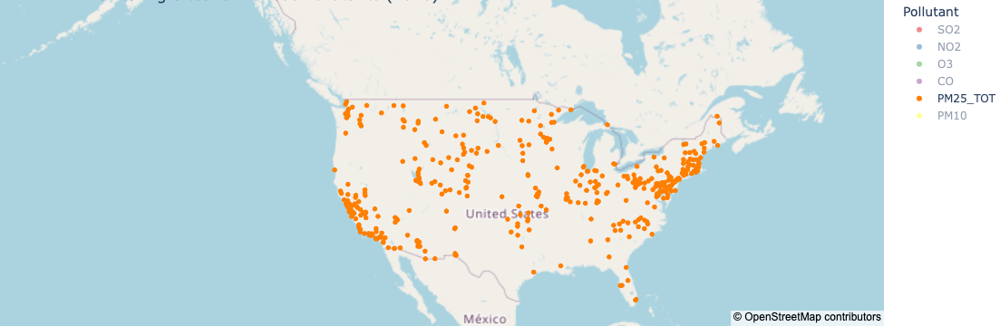

In [ ]:
import pandas as pd
import plotly.express as px

# Directory containing the EPA AQS data files
dir_epa = '/home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/'

# EPA codes and corresponding pollutants
epa_code = ['42401', '42602', '44201', '42101', '88101', '81102']
pollutants = ['SO2', 'NO2', 'O3', 'CO', 'PM25_TOT', 'PM10']

# Initialize an empty DataFrame to store all unique site data
all_sites_df = pd.DataFrame()

# Loop through each pollutant and read only Latitude and Longitude from each large data file
for i, code in enumerate(epa_code):
    file_path = f"{dir_epa}hourly_{code}_2016.csv"
    
    # Read only the Latitude and Longitude columns
    df = pd.read_csv(file_path, usecols=['Latitude', 'Longitude'])
    
    # Keep only the unique pairs of latitude and longitude
    df_unique = df.drop_duplicates()
    
    # Add a column to indicate the pollutant
    df_unique['Pollutant'] = pollutants[i]
    
    # Append the unique site data for this pollutant to the all_sites_df DataFrame
    all_sites_df = pd.concat([all_sites_df, df_unique], ignore_index=True)

# Create an interactive map with Plotly
fig = px.scatter_mapbox(all_sites_df, 
                        lat='Latitude', 
                        lon='Longitude', 
                        color='Pollutant', 
                        hover_name='Pollutant',
                        color_discrete_sequence=px.colors.qualitative.Set1,  # Set of qualitative colors
                        zoom=4, 
                        height=600)

# Set the map style to "open-street-map"
fig.update_layout(mapbox_style="open-street-map")

# Add title and layout improvements
fig.update_layout(title='EPA Monitoring Sites for Various Pollutants (2016)',
                  margin={"r":0,"t":0,"l":0,"b":0})

# Show the interactive map
fig.show()

In [2]:
fig.write_html("aqs_monitoring_sites.html")

### Statistics Baseline No Neighbors

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# Load the CSV file into a DataFrame
file_path = '/home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/PM25_TOT_d02_WHbase_2016_1_EPA_CMAQ_Combine.csv'
df = pd.read_csv(file_path)

# # Remove any rows with missing data in 'Sample Measurement' or 'CMAQ'
# before = len(df.index)
# df = df.dropna(subset=['Sample Measurement', 'CMAQ'])
# print(round((before - len(df.index))/ before * 100, 2), "% lost to na")

In [2]:
percent_under_detection_limit = ((df.loc[df['Sample Measurement'] <= 2]).shape[0])/ df.shape[0] * 100 
print(f"{round(percent_under_detection_limit,2)}% of AQS measurements under the detection limit of 2ug/m^3")


df_detection_limit = df.loc[df['Sample Measurement'] >= 2]

15.67% of AQS measurements under the detection limit of 2ug/m^3


In [3]:
def do_overall_stats(df, daily):
    df = df.copy(deep = True)
    if daily:
        grouped = df.groupby(['Latitude', 'Longitude'])
        groups = []
        for (lat, lon), group in grouped:
            group = group.set_index('dt')
            group.index = pd.to_datetime(group.index)

            numeric_cols = group.select_dtypes(include='number').columns
            non_numeric_cols = group.select_dtypes(exclude='number').columns
            numeric_resampled = group[['Sample Measurement', 'CMAQ']].resample('D').mean().dropna()
            non_numeric_resampled = group[non_numeric_cols].resample('D').last()

            group = pd.concat([numeric_resampled, non_numeric_resampled], axis=1).reset_index().dropna(subset = ['Sample Measurement', 'CMAQ'])
            group['Latitude'] = lat
            group['Longitude'] = lon
            groups.append(group)

        df = pd.concat(groups)
        df = pd.concat(groups).reset_index()
    
    df_all = df[['CMAQ', 'Sample Measurement']].dropna()
    observed = df_all['Sample Measurement']
    predicted = df_all['CMAQ']

    # Calculate mean observed (μd) and mean predicted (μp)
    μd = observed.mean()
    μp = predicted.mean()

    # Calculate NMB
    nmb = ((predicted - observed).sum() / observed.sum()) * 100

    # Calculate NME
    nme = (abs(predicted - observed).sum() / observed.sum()) * 100

    # Calculate Pearson correlation coefficient (r)
    if len(observed) > 1:  # Ensure there is enough data for correlation
        r_value, _ = pearsonr(observed, predicted)
    else:
        r_value = np.nan  # Not enough data to compute correlation

    # Append the calculated metrics to the DataFrame
    return pd.DataFrame({
        'μd': [μd],
        'μp': [μp],
        'NMB': [nmb],
        'NME': [nme],
        'r': [r_value]
    })

do_overall_stats(df, daily = True)

,μd,μp,NMB,NME,r
0,9.076258,10.378428,14.346987,58.770062,0.519313


In [4]:
file_path = '/home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/PM25_TOT_d02_WHbase_2016_1_EPA_CMAQ_Combine_2020_RWC.csv'
df_2020 = pd.read_csv(file_path)

do_overall_stats(df_2020, daily = True)

,μd,μp,NMB,NME,r
0,9.076258,10.930021,20.42431,61.274423,0.514436


In [6]:
def do_stats(df, daily = False):
    df_new = df.copy(deep = True)

    # Group by unique (Latitude, Longitude) pairs
    grouped = df_new.groupby(['Latitude', 'Longitude'])
    
    metrics_dfs = []
    groups = []

    # Iterate through each group and calculate the metrics
    for (lat, lon), group in grouped:
        if daily:
            group_before = group
            group = group.set_index('dt')
            group.index = pd.to_datetime(group.index)

            numeric_cols = group.select_dtypes(include='number').columns
            non_numeric_cols = group.select_dtypes(exclude='number').columns
            numeric_resampled = group[['Sample Measurement', 'CMAQ']].resample('D').mean().dropna()
            non_numeric_resampled = group[non_numeric_cols].resample('D').last()

            group = pd.concat([numeric_resampled, non_numeric_resampled], axis=1).reset_index().dropna(subset = ['Sample Measurement', 'CMAQ'])
            group['Latitude'] = lat
            group['Longitude'] = lon
            groups.append(group)
        
        observed = group['Sample Measurement']
        predicted = group['CMAQ']

        # Calculate mean observed (μd) and mean predicted (μp)
        μd = observed.mean()
        μp = predicted.mean()

        # Calculate NMB
        if observed.sum() != 0:
            nmb = ((predicted - observed).sum() / observed.sum()) * 100
    
            # Calculate NME
            nme = (abs(predicted - observed).sum() / observed.sum()) * 100
        else:
            print("observed = 0")
            nmb = 0
            nme = 0
        
        # Calculate Pearson correlation coefficient (r)
        if len(observed) > 1:  # Ensure there is enough data for correlation
            r_value, _ = pearsonr(observed, predicted)
        else:
            r_value = np.nan  # Not enough data to compute correlation

        # Append the calculated metrics to the DataFrame
        metrics_dfs.append(pd.DataFrame({
            'Latitude': [lat],
            'Longitude': [lon],
            'μd': [μd],
            'μp': [μp],
            'NMB': [nmb],
            'NME': [nme],
            'r': [r_value]
        }))
    if daily:
        return pd.concat(metrics_dfs), pd.concat(groups)
    else:
        return pd.concat(metrics_dfs)

metrics_df = do_stats(df, daily = False)
metrics_df_daily, df_daily  = do_stats(df, daily = True)
metrics_df_daily_2020, df_daily_2020  = do_stats(df_2020, daily = True)
metrics_df_detection_limit = do_stats(df_detection_limit)
metrics_df_detection_limit_daily = do_stats(df_detection_limit, daily = True)

# Display the metrics DataFrame

In [5]:
metrics_df

,Latitude,Longitude,μd,μp,NMB,NME,r
0,27.965650,-82.230400,9.062329,11.022905,21.634355,75.741039,0.479596
0,29.670025,-95.128508,8.654167,16.920166,95.514675,119.655947,0.475117
0,30.262778,-81.606833,9.632000,19.168204,99.005444,121.701566,0.439381
0,30.461981,-91.179219,11.699592,15.995541,36.718796,67.192192,0.397091
0,31.337204,-110.936718,19.684877,5.875725,-70.151071,80.846296,0.079081
...,...,...,...,...,...,...,...
0,48.363694,-114.189272,9.050068,5.908262,-34.715826,76.274816,0.086515
0,48.391545,-115.553309,19.446301,3.043765,-84.347846,86.348305,0.044332
0,48.520590,-122.614280,3.989011,6.123033,53.497518,90.409257,0.413555
0,48.641930,-102.401800,6.479388,3.465110,-46.521031,65.529331,0.367290


In [ ]:
df_daily_2020.to_csv("AQS_data_2016/PM25_TOT_d02_WHbase_2016_1_EPA_CMAQ_Combine_2020_RWC_daily.csv")

In [177]:
metrics_df_daily.to_csv("AQS_data_2016/validation_baseline_daily.csv")
metrics_df_detection_limit_daily.to_csv("AQS_data_2016/validation_baseline_daily_detection_limit.csv")
metrics_df.to_csv("AQS_data_2016/validation_baseline_hourly.csv")
metrics_df_detection_limit.to_csv("AQS_data_2016/validation_baseline_hourly_detection_limit.csv")

### Daytime only

In [5]:
df['dt'] = pd.to_datetime(df['dt'])
df['hour'] = df['dt'].dt.hour

In [6]:
file_path = '/home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/PM25_TOT_d02_WHbase_2016_1_EPA_CMAQ_Combine_2020_RWC.csv'
df_2020 = pd.read_csv(file_path)

df_2020['dt'] = pd.to_datetime(df_2020['dt'])
df_2020['hour'] = df_2020['dt'].dt.hour

In [10]:
for i in range(0, 12):
    day_bound = i
    night_bound = i+11
    df_day = df.loc[(df['hour'] >= day_bound) & (df['hour'] <= night_bound)]
    df_night= df.loc[(df['hour'] < day_bound) | (df['hour'] > night_bound)]
    do_overall_stats(df_day,  daily = True)
    x = do_overall_stats(df_day,  daily = True)
    print(i, round(list(x['NMB'])[0], 2))

0 11.92
1 9.72
2 7.74
3 6.28
4 5.27
5 4.88
6 5.25
7 6.03
8 7.16
9 8.54
10 10.25
11 12.73


In [12]:
df_2020['dt'] = pd.to_datetime(df_2020['dt'])
df_2020['hour'] = df_2020['dt'].dt.hour
day_bound = 6
night_bound = 17

df_day_2020 = df_2020.loc[(df_2020['hour'] >= day_bound) & (df_2020['hour'] <= night_bound)]
df_night_2020 = df_2020.loc[(df_2020['hour'] < day_bound) | (df_2020['hour'] > night_bound)]
df_day = df.loc[(df['hour'] >= day_bound) & (df['hour'] <= night_bound)]
df_night= df.loc[(df['hour'] < day_bound) | (df['hour'] > night_bound)]

In [13]:
do_overall_stats(df, daily = True)

,μd,μp,NMB,NME,r
0,9.076258,10.378428,14.346987,58.770062,0.519313


In [14]:
do_overall_stats(df_2020,  daily = True)

,μd,μp,NMB,NME,r
0,9.076258,10.930021,20.42431,61.274423,0.514436


In [15]:
do_overall_stats(df_day,  daily = True)

,μd,μp,NMB,NME,r
0,9.60066,10.104659,5.249625,61.15033,0.454411


In [16]:
do_overall_stats(df_day_2020,  daily = True)

,μd,μp,NMB,NME,r
0,9.60066,10.555861,9.949316,62.621297,0.446866


In [17]:
do_overall_stats(df_night,  daily = True)

,μd,μp,NMB,NME,r
0,8.474609,10.644333,25.602644,64.307415,0.559536


In [18]:
do_overall_stats(df_night_2020,  daily = True)

,μd,μp,NMB,NME,r
0,8.474609,11.302532,33.369359,68.200907,0.560261


In [57]:
out, _ = do_stats(df, daily = True)
out.mean()

Latitude     40.056247
Longitude   -96.638735
μd            9.074969
μp           10.338731
NMB          28.624188
NME          71.601187
r             0.620196
dtype: float64

In [58]:
out, _ = do_stats(df_day, daily = True)
out.mean()

Latitude      40.056247
Longitude    -96.638735
μd             9.352318
μp             9.891424
NMB          121.123222
NME          177.968438
r              0.562044
dtype: float64

In [59]:
out, _ = do_stats(df_night, daily = True)
out.mean()

Latitude     40.056247
Longitude   -96.638735
μd            8.701608
μp           10.780234
NMB          36.948097
NME          76.513010
r             0.612957
dtype: float64

### timezone validation

In [7]:
!pip3 install timezonefinder

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 MB 7.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 996.8/996.8 kB 6.0 MB/s eta 0:00:00


In [8]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from timezonefinder import TimezoneFinder

# Initialize TimezoneFinder instance
tf = TimezoneFinder()

def get_timezone_from_coordinates(lat, lon):
    """Get timezone name from latitude and longitude."""
    return tf.timezone_at(lat=lat, lng=lon)

def map_to_standard_timezone(lat, lon):
    """Map detailed timezones to standard time zones."""
    timezone = get_timezone_from_coordinates(lat, lon)
    pst = ['America/Los_Angeles']
    mst = ['America/Denver', 'America/Boise', 'America/Phoenix']  # Exclude 'America/Phoenix'
    cst = ['America/Chicago', 'America/North_Dakota/Beulah', 'America/North_Dakota/Center']
    est = ['America/New_York', 'America/Detroit', 'America/Indiana/Indianapolis', 'America/Kentucky/Louisville']
    
    if timezone in pst:
        return 'PST'
    elif timezone in mst:
        return 'MST'
    elif timezone in cst:
        return 'CST'
    elif timezone in est:
        return 'EST'
    elif timezone in others:
        return 'Other (MST no DST)'
    else:
        return 'Other'

def do_overall_stats_per_timezone(df):
    # Ensure necessary columns exist
    if 'Latitude' not in df.columns or 'Longitude' not in df.columns:
        raise ValueError("The dataframe must contain 'Latitude' and 'Longitude' columns.")
    
    df = df.dropna(subset = ['Latitude', 'Longitude'])
    
    # Get timezone for each row based on Latitude and Longitude
    df['timezone'] = df.apply(lambda row: map_to_standard_timezone(row['Latitude'], row['Longitude']), axis=1)

    # Handle missing or invalid timezones
    df['timezone'].fillna('Unknown', inplace=True)

    # Group the data by timezone
    grouped = df.groupby('timezone')

    # Define a function to compute stats for each group
    def compute_stats(group):
        df_all = group[['CMAQ', 'Sample Measurement']].dropna()
        observed = df_all['Sample Measurement']
        predicted = df_all['CMAQ']
        
        if len(observed) == 0:  # Handle case where no data is available after dropping NaNs
            return pd.Series({'μd': np.nan, 'μp': np.nan, 'NMB': np.nan, 'NME': np.nan, 'r': np.nan})

        # Calculate mean observed (μd) and mean predicted (μp)
        μd = observed.mean()
        μp = predicted.mean()

        # Calculate NMB
        nmb = ((predicted - observed).sum() / observed.sum()) * 100

        # Calculate NME
        nme = (abs(predicted - observed).sum() / observed.sum()) * 100
        mb = predicted.mean() - observed.mean()

        # Calculate Pearson correlation coefficient (r)
        if len(observed) > 1:  # Ensure there is enough data for correlation
            r_value, _ = pearsonr(observed, predicted)
        else:
            r_value = np.nan  # Not enough data to compute correlation

        #return pd.Series({'μd': μd, 'μp': μp, 'NMB': nmb, 'NME': nme, 'mb': mb,'r': r_value})
        return pd.Series({'mb': mb,'r': r_value})

    # Apply the stats calculation function to each group and return the results as a DataFrame
    return grouped.apply(compute_stats).reset_index()

# Example usage:
overall_stats_per_timezone = do_overall_stats_per_timezone(df_daily_2020)
print("RWC 2020:")
overall_stats_per_timezone

NameError: name 'df_daily_2020' is not defined

### Latidudinal Swathe

In [11]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

def get_latitudinal_swath(lat):
    """Map latitude to a specific 5-degree swath."""
    # Define the swath range
    if lat < 24.3963 or lat > 49.3845:  # Check if lat is within the continental US
        return 'Outside US'
    elif lat < 35:  # Group all latitudes under 35 into "<35"
        return '<35'
    swath = int(lat // 5) * 5  # Calculate the swath starting point

    return f"{swath}° to {swath + 5}°"

def do_overall_stats_per_latitudinal_swath(df):
    # Ensure necessary columns exist
    if 'Latitude' not in df.columns or 'Longitude' not in df.columns:
        raise ValueError("The dataframe must contain 'Latitude' and 'Longitude' columns.")
    
    df = df.dropna(subset=['Latitude', 'Longitude'])
    
    # Get swath for each row based on Latitude
    df['lat_swath'] = df['Latitude'].apply(get_latitudinal_swath)

    # Handle missing or invalid swaths
    df['lat_swath'].fillna('Unknown', inplace=True)

    # Group the data by latitudinal swath
    grouped = df.groupby('lat_swath')

    # Define a function to compute stats for each group
    def compute_stats(group):
        df_all = group[['CMAQ', 'Sample Measurement']].dropna()
        observed = df_all['Sample Measurement']
        predicted = df_all['CMAQ']
        
        if len(observed) == 0:  # Handle case where no data is available after dropping NaNs
            return pd.Series({'μᴅ': np.nan, 'μᵐ': np.nan, 'NMB (%)': np.nan, 'NME (%)': np.nan, 'r': np.nan, 'n': 0})

        # Calculate means
        mu_d = observed.mean()
        mu_p = predicted.mean()

        # Calculate Normalized Mean Bias (NMB)
        nmb = 100 * (predicted.sum() - observed.sum()) / observed.sum()

        # Calculate Normalized Mean Error (NME)
        nme = 100 * np.abs(predicted - observed).sum() / observed.sum()

        # Calculate Pearson correlation coefficient (r)
        if len(observed) > 1:  # Ensure there is enough data for correlation
            r_value, _ = pearsonr(observed, predicted)
        else:
            r_value = np.nan  # Not enough data to compute correlation
        
        # Count number of valid sensors (data points)
        n = len(group['Latitude'].unique())

        return pd.Series({'μᴅ': mu_d, 'μᵐ': mu_p, 'NMB (%)': nmb, 'NME (%)': nme, 'r': r_value, 'n': n})

    # Apply the stats calculation function to each group and return the results as a DataFrame
    return grouped.apply(compute_stats).reset_index()


# Example usage:
# Assuming df_daily_2020 is your DataFrame containing the necessary data
overall_stats_per_latitudinal_swath = do_overall_stats_per_latitudinal_swath(df_daily)
print("Overall Statistics by 5-Degree Latitudinal Swath:")
print(overall_stats_per_latitudinal_swath)


Overall Statistics by 5-Degree Latitudinal Swath:
    lat_swath         μᴅ         μᵐ    NMB (%)    NME (%)         r      n
0  35° to 40°   9.051009  10.986590  21.385249  59.763526  0.564893  135.0
1  40° to 45°   8.801498  10.042380  14.098536  51.587518  0.690619  126.0
2  45° to 50°   8.849961   8.115398  -8.300192  67.444310  0.420959   55.0
3         <35  10.030939  11.991869  19.548816  63.561690  0.360775   53.0


/tmp/ipykernel_86405/2305325094.py:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['lat_swath'].fillna('Unknown', inplace=True)
/tmp/ipykernel_86405/2305325094.py:63: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return grouped.appl

In [12]:
overall_stats_per_latitudinal_swath = do_overall_stats_per_latitudinal_swath(df_daily_2020)
overall_stats_per_latitudinal_swath

/tmp/ipykernel_86405/2305325094.py:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['lat_swath'].fillna('Unknown', inplace=True)
/tmp/ipykernel_86405/2305325094.py:63: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return grouped.appl

,lat_swath,μᴅ,μᵐ,NMB (%),NME (%),r,n
0,35° to 40°,9.051009,11.699016,29.256477,64.760068,0.543916,135.0
1,40° to 45°,8.801498,10.644509,20.939740,55.754195,0.679508,126.0
2,45° to 50°,8.849961,8.829560,-0.230529,64.812597,0.465757,55.0
3,<35,10.030939,11.845880,18.093426,61.599218,0.355191,53.0


### Validation by time of day

In [58]:
df

,Unnamed: 0,index,State Code,County Code,Site Num,Parameter Code,POC,Latitude,Longitude,Sample Measurement,...,Method Code,x,y,State Name,County Name,Units of Measure,CMAQ,dt,level_0,hour
6,6,0.0,1.0,73.0,23.0,88101.0,3.0,33.553056,-86.81500,12.9,...,183.0,230,808,Alabama,Jefferson,Micrograms/cubic meter (LC),14.963564,2016-01-01 06:00:00,2016-01-01 06:00:00,6
7,7,1.0,1.0,73.0,23.0,88101.0,3.0,33.553056,-86.81500,8.9,...,183.0,230,808,Alabama,Jefferson,Micrograms/cubic meter (LC),14.740301,2016-01-01 07:00:00,2016-01-01 07:00:00,7
8,8,2.0,1.0,73.0,23.0,88101.0,3.0,33.553056,-86.81500,14.8,...,183.0,230,808,Alabama,Jefferson,Micrograms/cubic meter (LC),14.020829,2016-01-01 08:00:00,2016-01-01 08:00:00,8
9,9,3.0,1.0,73.0,23.0,88101.0,3.0,33.553056,-86.81500,13.0,...,183.0,230,808,Alabama,Jefferson,Micrograms/cubic meter (LC),13.740897,2016-01-01 09:00:00,2016-01-01 09:00:00,9
10,10,4.0,1.0,73.0,23.0,88101.0,3.0,33.553056,-86.81500,13.5,...,183.0,230,808,Alabama,Jefferson,Micrograms/cubic meter (LC),14.356115,2016-01-01 10:00:00,2016-01-01 10:00:00,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
274531,274531,3495569.0,56.0,45.0,4.0,88101.0,3.0,43.849890,-104.20432,2.0,...,170.0,508,429,Wyoming,Weston,Micrograms/cubic meter (LC),1.084184,2016-01-31 19:00:00,2016-01-31 19:00:00,19
274532,274532,3495570.0,56.0,45.0,4.0,88101.0,3.0,43.849890,-104.20432,3.0,...,170.0,508,429,Wyoming,Weston,Micrograms/cubic meter (LC),0.886242,2016-01-31 20:00:00,2016-01-31 20:00:00,20
274533,274533,3495571.0,56.0,45.0,4.0,88101.0,3.0,43.849890,-104.20432,1.0,...,170.0,508,429,Wyoming,Weston,Micrograms/cubic meter (LC),0.905801,2016-01-31 21:00:00,2016-01-31 21:00:00,21
274534,274534,3495572.0,56.0,45.0,4.0,88101.0,3.0,43.849890,-104.20432,2.0,...,170.0,508,429,Wyoming,Weston,Micrograms/cubic meter (LC),1.096679,2016-01-31 22:00:00,2016-01-31 22:00:00,22


/tmp/ipykernel_252705/1778151500.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['hour'] = df['dt'].dt.hour
/tmp/ipykernel_252705/1778151500.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  hourly_metrics = df.groupby('hour').apply(calculate_metrics).reset_index()


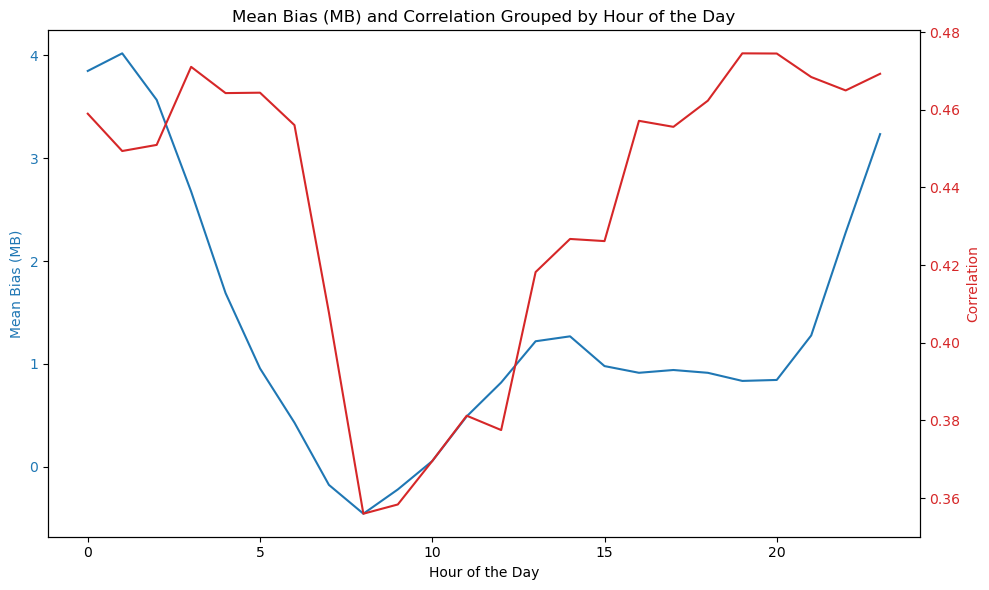

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Convert 'dt' to datetime if not already
df['dt'] = pd.to_datetime(df['dt'])

df  = df.dropna(subset=['Sample Measurement', 'CMAQ'])


# Extract hour of the day
df['hour'] = df['dt'].dt.hour

# Define a function to calculate MB and correlation
def calculate_metrics(group):
    mb = np.mean(group['CMAQ'] - group['Sample Measurement'])  # Mean Bias
    corr, _ = st.pearsonr(group['CMAQ'], group['Sample Measurement'])  # Pearson correlation
    return pd.Series({'MB': mb, 'Correlation': corr})

# Group by hour and calculate metrics
hourly_metrics = df.groupby('hour').apply(calculate_metrics).reset_index()

# Plot MB and Correlation against hour of the day
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot Mean Bias
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Mean Bias (MB)', color='tab:blue')
ax1.plot(hourly_metrics['hour'], hourly_metrics['MB'], label='Mean Bias', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create a secondary y-axis for Correlation
ax2 = ax1.twinx()
ax2.set_ylabel('Correlation', color='tab:red')
ax2.plot(hourly_metrics['hour'], hourly_metrics['Correlation'], label='Correlation', color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Titles and Legends
plt.title('Mean Bias (MB) and Correlation Grouped by Hour of the Day')
fig.tight_layout()
plt.show()


## Statistics 2020 RWC

In [8]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# Load the CSV file into a DataFrame
file_path = '/home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/PM25_TOT_d02_WHbase_2016_1_EPA_CMAQ_Combine_2020_RWC.csv'
df = pd.read_csv(file_path)

# # Remove any rows with missing data in 'Sample Measurement' or 'CMAQ'
# before = len(df.index)
# df = df.dropna(subset=['Sample Measurement', 'CMAQ'])
# print(round((before - len(df.index))/ before * 100, 2), "% lost to na")

In [9]:
percent_under_detection_limit = ((df.loc[df['Sample Measurement'] <= 2]).shape[0])/ df.shape[0] * 100 
print(f"{round(percent_under_detection_limit,2)}% of AQS measurements under the detection limit of 2ug/m^3")


df_detection_limit = df.loc[df['Sample Measurement'] >= 2]

15.67% of AQS measurements under the detection limit of 2ug/m^3


In [10]:
metrics_df_2020 = do_stats(df, daily = False)
metrics_df_daily_2020, df_daily_2020  = do_stats(df, daily = True)
metrics_df_detection_limit_2020 = do_stats(df_detection_limit)
metrics_df_detection_limit_daily_2020 = do_stats(df_detection_limit, daily = True)

# Display the metrics DataFrame

In [178]:
metrics_df_daily_2020.to_csv("AQS_data_2016/validation_RWC2020_daily.csv")
metrics_df_detection_limit_daily_2020.to_csv("AQS_data_2016/validation_RWC2020_daily_detection_limit.csv")
metrics_df_2020.to_csv("AQS_data_2016/validation_RWC2020_hourly.csv")
metrics_df_detection_limit_2020.to_csv("AQS_data_2016/validation_RWC2020_hourly_detection_limit.csv")

In [174]:
metrics_df_detection_limit_daily_2020.mean()

Latitude     40.056247
Longitude   -96.638735
μd            9.812196
μp           11.090442
NMB          15.674962
NME          60.581454
r             0.577884
dtype: float64

## Statistics Baseline Neighbors

In [11]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# Load the CSV file into a DataFrame
file_path = '/home/ksz4578/Heat_Pump_Project/WRF_analyses/AQS_data_2016/PM25_TOT_d02_WHbase_2016_1_EPA_CMAQ_Combine_neighbors.csv'
df = pd.read_csv(file_path)

# Remove any rows with missing data in 'Sample Measurement' or 'CMAQ'
before = len(df.index)
df = df.dropna(subset=['Sample Measurement', 'CMAQ'])
print(round((before - len(df.index))/ before * 100, 2), "% lost to na")

6.46 % lost to na


In [12]:
percent_under_detection_limit = ((df.loc[df['Sample Measurement'] <= 2]).shape[0])/ df.shape[0] * 100 
print(f"{round(percent_under_detection_limit,2)}% of AQS measurements under the detection limit of 2ug/m^3")

df_detection_limit = df.loc[df['Sample Measurement'] >= 2]

16.75% of AQS measurements under the detection limit of 2ug/m^3


In [13]:
def do_stats(df):
# Initialize an empty DataFrame to store the metrics for each site
    metrics_df = pd.DataFrame(columns=['Latitude', 'Longitude', 'μd', 'μp', 'NMB', 'NME', 'r'])

    # Group by unique (Latitude, Longitude) pairs
    grouped = df.groupby(['Latitude', 'Longitude'])

    # Iterate through each group and calculate the metrics
    for (lat, lon), group in grouped:
        observed = group['Sample Measurement']
        predicted = group['CMAQ']

        # Calculate mean observed (μd) and mean predicted (μp)
        μd = observed.mean()
        μp = predicted.mean()

        # Calculate NMB
        nmb = ((predicted - observed).sum() / observed.sum()) * 100

        # Calculate NME
        nme = (abs(predicted - observed).sum() / observed.sum()) * 100

        # Calculate Pearson correlation coefficient (r)
        if len(observed) > 1:  # Ensure there is enough data for correlation
            r_value, _ = pearsonr(observed, predicted)
        else:
            r_value = np.nan  # Not enough data to compute correlation

        # Append the calculated metrics to the DataFrame
        metrics_df = metrics_df.append({
            'Latitude': lat,
            'Longitude': lon,
            'μd': μd,
            'μp': μp,
            'NMB': nmb,
            'NME': nme,
            'r': r_value
        }, ignore_index=True)
    return metrics_df
    
metrics_df_neighbors = do_stats(df)
metrics_df_detection_limit = do_stats(df_detection_limit)

# Display the metrics DataFrame

/tmp/ipykernel_271792/2161004798.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append({
/tmp/ipykernel_271792/2161004798.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append({
/tmp/ipykernel_271792/2161004798.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append({
/tmp/ipykernel_271792/2161004798.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics_df = metrics_df.append({
/tmp/ipykernel_271792/2161004798.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inst

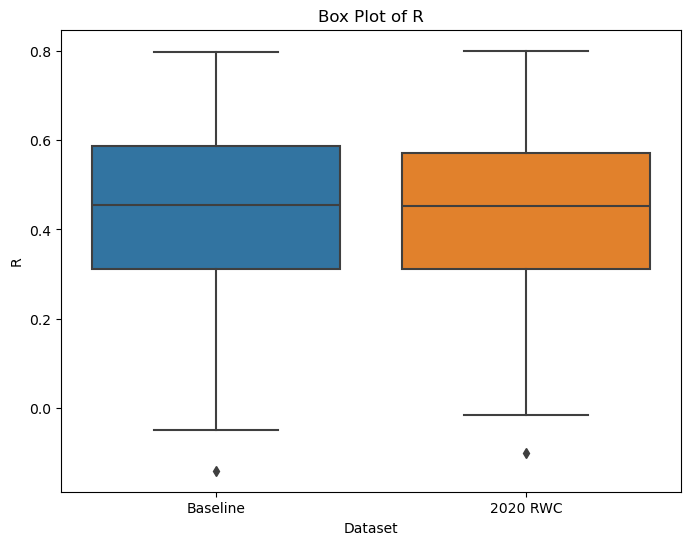

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Add a column to distinguish between the two DataFrames
metrics_df['Dataset'] = 'Baseline'
metrics_df_2020['Dataset'] = '2020 RWC'

# Concatenate the two DataFrames
df_combined = pd.concat([metrics_df[['r', 'Dataset']], metrics_df_2020[['r', 'Dataset']]])

# Create the box plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Dataset', y='r', data=df_combined)
plt.title('Box Plot of R')
plt.ylabel('R')
plt.show()

In [6]:
metrics_df_detection_limit.mean()

Latitude     40.056247
Longitude   -96.638735
μd           10.119354
μp           10.337371
NMB           4.460169
NME          69.599842
r             0.426607
dtype: float64

## Plotting Validation

In [11]:
metrics_df_2020['overestimation'] = metrics_df_2020['μp'] - metrics_df_2020['μd']
metrics_df['overestimation'] = metrics_df['μp'] - metrics_df['μd']

In [13]:
import plotly.express as px
import pandas as pd

# Assuming 'metrics_df' is your DataFrame with the 'r' column for Pearson correlation coefficients
# Calculate the 1st and 99th quantiles of the 'r' values
def generate_AQS_validation_fig(metrics_df, var = 'r'):
    r_min = metrics_df[var].quantile(0.04)
    r_max = metrics_df[var].quantile(0.96)

    # Create the scattermapbox plot with color range set to the quantile limits
    fig = px.scatter_mapbox(
        metrics_df,
        lat="Latitude",
        lon="Longitude",
        color=var,  # Color points by the Pearson correlation coefficient 'r'
        size_max=15,  # Optional: Scale the size of the points
        color_continuous_scale="Rdbu",  # Color scale (choose 'Viridis', 'Plasma', etc.)
        hover_data=['r', 'NME', 'NMB', 'μd','μp'], # Show r-value on hover
        zoom=4,  # Adjust zoom level based on the range of lat/lon
        mapbox_style="open-street-map",  # Use a map style; "carto-positron" is another option
        range_color=[r_min, r_max]  # Set the color range to the 1st and 99th quantile of 'r'
    )


    # Customize Layours
    fig.update_layout(
        title=f"PM2.5 Sensors Correlation with Modeled Data (Color-Coded by {var})",
        autosize=False,  # Disable autosizing to specify a custom size
        width=1000,  # Set width of the figure
        height=800,  # Set height of the figure
        hovermode='closest',
        mapbox=dict(
            bearing=0,
            center=dict(
                lat=metrics_df['Latitude'].mean(),  # Center map on mean latitude
                lon=metrics_df['Longitude'].mean()  # Center map on mean longitude
            ),
            pitch=0,
            zoom=5  # Set initial zoom level
        ),
    )
    
    return fig

fig = generate_AQS_validation_fig(metrics_df, 'NMB')
#generate_AQS_validation_fig(metrics_df_2020_daily, 'r')

In [16]:
fig.write_html("o.html")

/tmp/ipykernel_43251/394445438.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  scatter_colors = plt.cm.get_cmap(scatter_cmap)(norm(r_values))


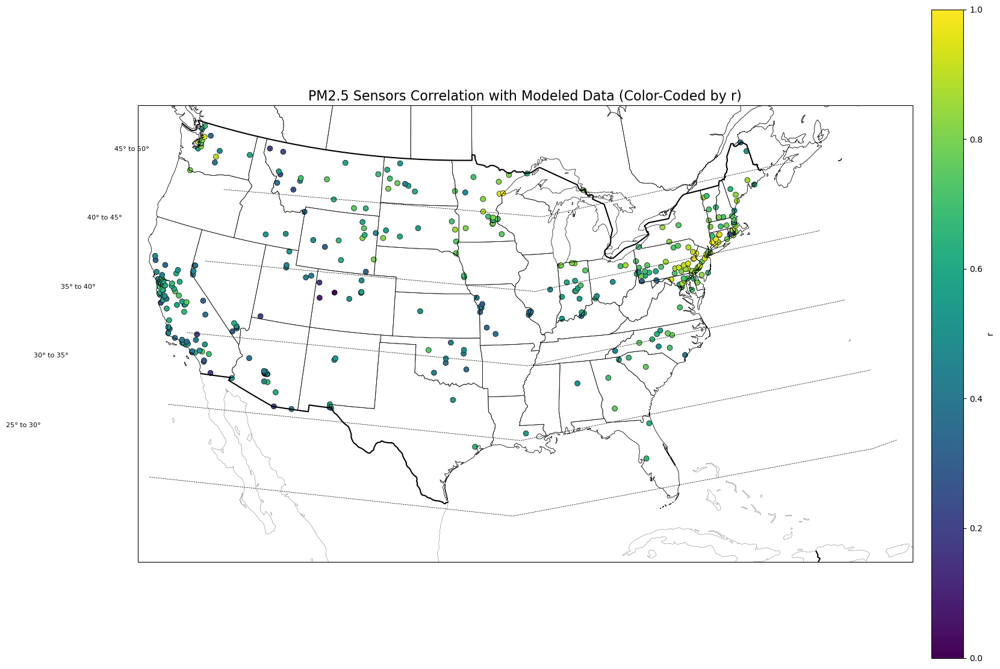

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_us_map_with_monitors(metrics_df, var='r', scatter_cmap='RdBu', colorbar_cmap='viridis'):
    # Create a figure with Cartopy
    fig, ax = plt.subplots(figsize=(20, 14), subplot_kw={'projection': ccrs.LambertConformal()})

    # Set the extent to the United States
    ax.set_extent([-119, -64, 22, 49], crs=ccrs.PlateCarree())

    # Add features to the map
    ax.add_feature(cfeature.LAND, facecolor='white')
    #ax.add_feature(cfeature.LAKES, facecolor='lightgray')
    ax.add_feature(cfeature.BORDERS, linewidth=1.5)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.2)
    ax.add_feature(cfeature.STATES, linewidth=0.5)

    # Scatter plot for monitors
    lat = metrics_df['Latitude']
    lon = metrics_df['Longitude']
    r_values = metrics_df[var]

    # Normalize the variable for color mapping
    norm = plt.Normalize(vmin=r_values.min(), vmax=r_values.max())
    scatter_colors = plt.cm.get_cmap(scatter_cmap)(norm(r_values))

    # Scatter plot with large dots
    scatter = ax.scatter(lon, lat, s=40, color=scatter_colors, edgecolor='black', linewidth=0.5, transform=ccrs.PlateCarree())

    # Add colorbar using the specified colormap
    cbar = plt.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02)
    cbar.set_label(var)

    # Add titles and labels
    plt.title(f"PM2.5 Sensors Correlation with Modeled Data (Color-Coded by {var})", fontsize=16)
    # Add latitudinal swath lines
    for lat_swath in range(25, 50, 5):
        ax.plot([-119, -64], [lat_swath, lat_swath], color='black', linestyle='--', linewidth=0.5, transform=ccrs.PlateCarree())
        ax.text(-130, lat_swath + 0.2, f"{lat_swath}° to {lat_swath + 5}°", color='black', fontsize=8, transform=ccrs.PlateCarree())


    plt.show()

# Example usage
plot_us_map_with_monitors(metrics_df, var='r', scatter_cmap='viridis', colorbar_cmap='viridis')


In [36]:
!source activate WRF

## Plot Over Time

In [11]:
df.columns

Index(['Unnamed: 0', 'index', 'State Code', 'County Code', 'Site Num',
       'Parameter Code', 'POC', 'Latitude', 'Longitude', 'Sample Measurement',
       'MDL', 'Uncertainty', 'Method Code', 'x', 'y', 'State Name',
       'County Name', 'Units of Measure', 'CMAQ', 'dt', 'level_0'],
      dtype='object')

/tmp/ipykernel_231020/1616518259.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_231020/1616518259.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



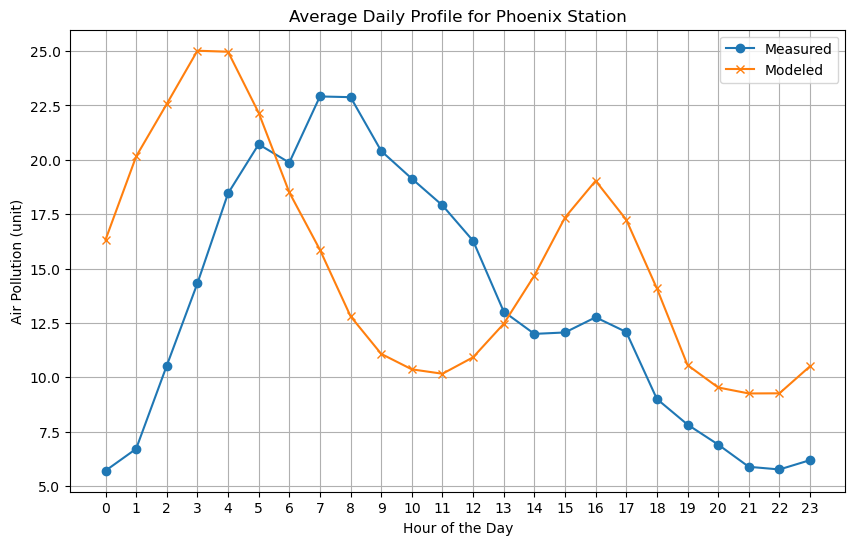

/tmp/ipykernel_231020/1616518259.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_231020/1616518259.py:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



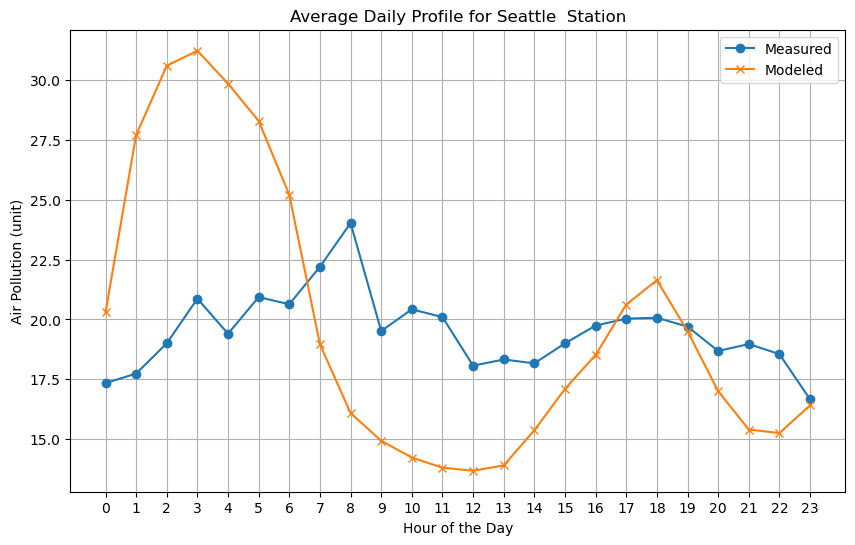

/tmp/ipykernel_231020/1616518259.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_231020/1616518259.py:55: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



R: 0.228


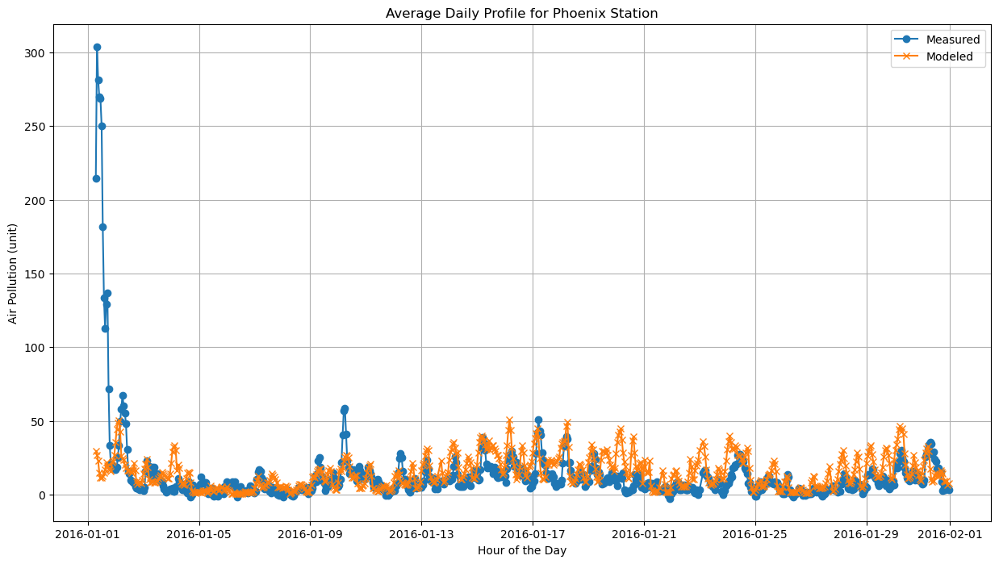

/tmp/ipykernel_231020/1616518259.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_231020/1616518259.py:55: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



R: 0.221


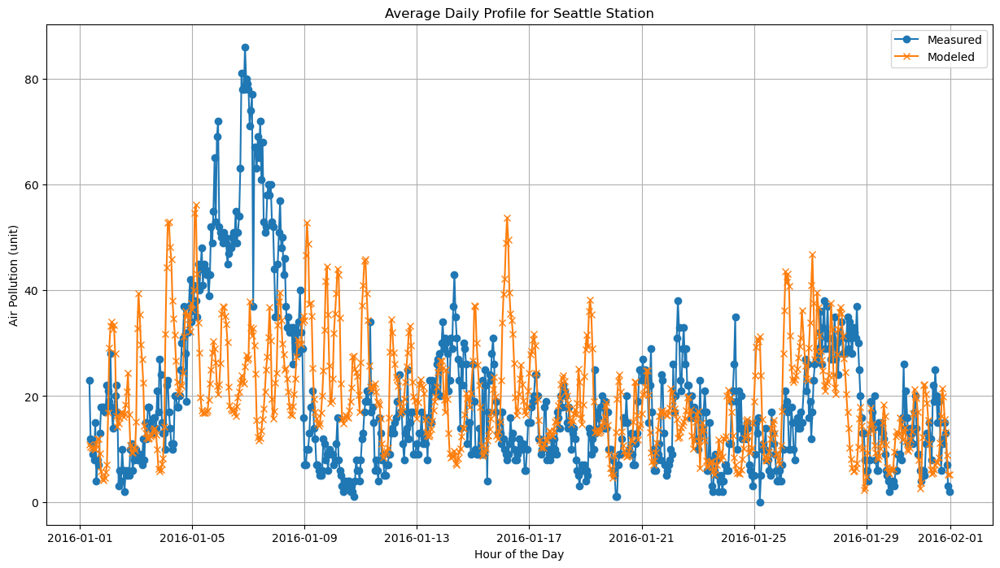

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame structure
# df = pd.DataFrame({
#     'timestamp': pd.date_range(start='2024-01-01', periods=5000, freq='H'),
#     'station': ['Station_A'] * 5000,
#     'measured': np.random.rand(5000) * 100,
#     'modeled': np.random.rand(5000) * 100,
# })

# Ensure 'timestamp' is a datetime object
df_copy = df.copy(deep = True)
df_copy['dt'] = pd.to_datetime(df_copy['dt'])

df_copy = df_copy[df_copy['dt'] >= "2016-01-01 00:00:00"]

# Set 'timestamp' as index (optional if not already)
df_copy.set_index('dt', inplace=True)

# Extract hour and date information
df_copy['hour'] = df_copy.index.hour

# Group by station and hour, then calculate the mean for each hour of the day
daily_profile = df_copy.groupby(['Latitude', 'Longitude', 'hour']).agg({'Sample Measurement': 'mean', 'CMAQ': 'mean'}).reset_index()



def plot_station_diurnal_profile(daily_profile = daily_profile, Latitude = 36.19125, city = ""):

    # Plot for a specific station
    station_data = daily_profile[daily_profile['Latitude'] == Latitude]
    station_data['measured'] = station_data['Sample Measurement']
    station_data['modeled'] = station_data['CMAQ']

    plt.figure(figsize=(10, 6))
    plt.plot(station_data['hour'], station_data['measured'], label='Measured', marker='o')
    plt.plot(station_data['hour'], station_data['modeled'], label='Modeled', marker='x')

    plt.title(f'Average Daily Profile for {city} Station')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Air Pollution (unit)')
    plt.legend()
    plt.grid(True)
    plt.xticks(range(24))  # Show all hours on the x-axis
    plt.show()
    
    
def plot_station_profile(df_copy = df_copy, Latitude = 36.19125, city = ""):
    from scipy.stats import pearsonr

    # Plot for a specific station
    station_data = df_copy[df_copy['Latitude'] == Latitude]
    station_data['measured'] = station_data['Sample Measurement']
    station_data['modeled'] = station_data['CMAQ']
    r_value, _ = pearsonr( station_data['measured'], station_data['modeled'])
    print("R:", round(r_value,3))

    plt.figure(figsize=(15, 8))
    plt.plot(station_data.index, station_data['measured'], label='Measured', marker='o')
    plt.plot(station_data.index, station_data['modeled'], label='Modeled', marker='x')

    plt.title(f'Average Daily Profile for {city} Station')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Air Pollution (unit)')
    plt.legend()
    plt.grid(True)
    #plt.xticks(range(24))  # Show all hours on the x-axis
    plt.show()

plot_station_diurnal_profile(Latitude = 33.57453, city = "Phoenix")
plot_station_diurnal_profile(Latitude = 46.598056, city = "Seattle ")

plot_station_profile(Latitude = 33.57453, city = "Phoenix")
plot_station_profile(Latitude = 46.598056, city = "Seattle")




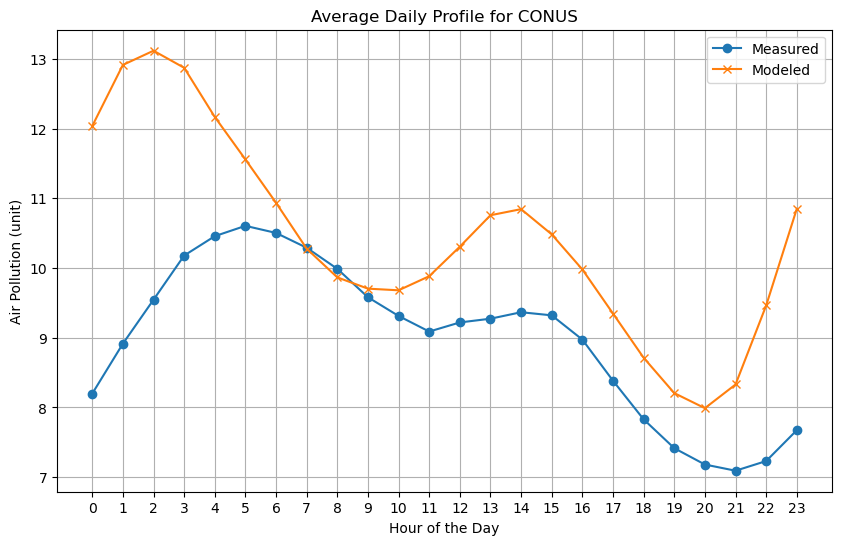

In [68]:
station_data  = daily_profile.groupby('hour').mean() 
station_data['measured'] = station_data['Sample Measurement']
station_data['modeled'] = station_data['CMAQ']
station_data = station_data.reset_index()
plt.figure(figsize=(10, 6))
plt.plot(station_data['hour'], station_data['measured'], label='Measured', marker='o')
plt.plot(station_data['hour'], station_data['modeled'], label='Modeled', marker='x')

plt.title(f'Average Daily Profile for CONUS')
plt.xlabel('Hour of the Day')
plt.ylabel('Air Pollution (unit)')
plt.legend()
plt.grid(True)
plt.xticks(range(24))  # Show all hours on the x-axis
plt.show()

## put_cmaq_on_shp_v2

In [1]:
# Updated 2022-06-07: Make box was projecting cells slightly off center. Fixed by using MCIP files to create shapes. 
#---------------------------------------------------------------------
from netCDF4 import Dataset
import numpy as np
import pandas as pd
import netCDF4
from geopandas.tools import sjoin
from shapely.geometry import Point, shape, Polygon
import geopandas as gpd
#---------------------------------------------------------------------
print(gpd.__version__)
#exit()

# User defined functions
#---------------------------------------------------------------------
def make_box(X0,Y0,X1,Y1): # OLD 
    # Create the lat lon values given corner indices
    # For creating outer edge values of the array
    #       L
    #       lu----ru
    # H     |   c  |
    #       |      |
    #       ll----rl
    #
    L = np.abs(X0 - X1)
    H = np.abs(Y0 - Y1)
    lo_lu, la_lu = X0-L/2,Y0+H/2
    lo_ru, la_ru = X0+L/2,Y0+H/2
    lo_rl, la_rl = X0+L/2,Y0-H/2
    lo_ll, la_ll = X0-L/2,Y0-H/2
    return lo_lu, la_lu, lo_ru, la_ru,lo_rl, la_rl,lo_ll, la_ll

#---------------------------------------------------------------------
def make_shp(datas,datas_headers,lon3,lat3,tract_shapes):
    # 
    # datas = list of data in nvar x 1 array
    # datas_headers = the name of the variable that will go into shp file
    #
    # Begin:
    # create dictionary using air quality concs for future geodataframe
    d = {}
    for i in range(len(datas)):
        d[datas_headers[i]]=datas[i]
    #
    # pull locations and put into shapely point so we can do geographical transformations
    pointline = [Point(lon3.ravel()[i],lat3.ravel()[i]) for i in range(len(lon3.ravel()))]
    # add in geometry into dictionary
    d['geometry']=pointline
    #
    # make geodataframe using dictionary and transform lon/lats projections into the same geometry as the tracts
    gdf = gpd.GeoDataFrame(d, crs="EPSG:4326")
    gdf = gdf.to_crs(tract_shapes.crs)
    # pull out these lat lon points that have the tract crs
    x,y = gdf['geometry'].x,gdf['geometry'].y
    #
    # Start to make little polygons to surround the centroids
    # Create outer limits
    #       L
    #       lu----ru
    # H     |   c  |
    #       |      |
    #       ll----rl
    #
    # set up empty shape to hold the future polygons
    shape=np.zeros(lon.shape).tolist()
    # go through the indices in the lat lon
    for i in range(len(lon)):
            for j in range(len(lon[0])):
                X0,Y0 = lat[i][j],lon[i][j]
                # get corners
                lo_lu, la_lu = latd[i][j],lond[i][j]
                lo_ru, la_ru = latd[i+1][j],lond[i+1][j]
                lo_rl, la_rl = latd[i+1][j+1],lond[i+1][j+1]
                lo_ll, la_ll = latd[i][j+1],lond[i][j+1]
                # create points of corners
                pointList = [Point(lo_lu, la_lu),Point(lo_ru, la_ru), Point(lo_rl, la_rl), Point(lo_ll, la_ll),Point(lo_lu, la_lu)]
                # create a polygon from the corners
                poly = Polygon([[p.y, p.x] for p in pointList])
                # put the shape of the pixel into the shape list
                shape[i][j] = poly 
    # put list of shapes into final gdf, needs to be 1D
    shape = np.array(shape).ravel()
    d['geometry'] = shape
    d['lat'],d['lon'] = lat.ravel(),lon.ravel()
    d['lat_m'],d['lon_m'] = x,y
    #
    # make geodataframe
    gdf = gpd.GeoDataFrame(d, crs="EPSG:4326")
    gdf = gdf.to_crs(tract_shapes.crs)
    gdf.to_file('tmp.shp')
    gdf['geom_saved']=gdf['geometry']
    print('create polygon shapes')
    #
    # Uncomment/edit this area if things are too big 
    # Like if there are too many polygons -- more efficient to go through states
    #tractjoinlist = []
    #ntracks = []
    #combien tracts with the geodataframe -- there are many repeating variables
    #for tractstate in ['17','18','55','26']: # selecting only midwest states, can change to all
    #       tractsubset = tract_shapes[tract_shapes['STATEFP']==tractstate]
    #       for tractcounty in tractsubset.COUNTYFP.unique():
    #           tractjoin = tractsubset[tractsubset['COUNTYFP']==tractcounty]
    #           tractjoin = gpd.sjoin(tractjoin,gdf,how="inner",op='intersects')
    #           if len(tractjoin)!=0: 
    #               tractjoinlist.append(tractjoin)
    #               ntracks.append(tractjoin.NAME.unique().shape)
    #
    #tractjoinfinal = gpd.GeoDataFrame(tractjoinlist[0])
    #for i in range(len(tractjoinlist)):
    #       tractjoinfinal = tractjoinfinal.append(tractjoinlist[i])
    #
    # need to combine AQ by distances from centroids to remove repeating variables
    v=[];geo = [];gisjoin = [];geoid=[]
    #
    tractjoinfinal =  gpd.sjoin(tract_shapes,gdf,how="inner",op='intersects')
    grouped_tracts = tractjoinfinal.groupby('GISJOIN')
    #
    print('joined tracts to polygon shapes')
    # go through each join code and do computations to get final weight AQ
    for group in grouped_tracts.groups:
            # pull the section of the tract with repeating values
            tmp = grouped_tracts.get_group(group)
            # save geometry data from the census shape
            geo.append(tmp.iloc[0]['geometry'])
            # save the gidjoin coide
            gisjoin.append(tmp.iloc[0]['GISJOIN'])
            geoid.append(tmp.iloc[0]['GEOID'])
            # Now process data for weighting
            # get the area of intersection of cells inside of the shape
            area = tmp.geometry.intersection(tmp.geom_saved).area
            # get distance between tract and cmaq centroids
            # now weight each air quality constiteunt to get average depending on distances
            for dh in datas_headers:
                v.append(np.sum(1/np.array(area)*tmp[dh])/np.sum(1/np.array(area)))
    #
    v = np.array(v)
    v2 = v.reshape(int(v.shape[0]/len(datas_headers)),len(datas_headers))
    v2 = gpd.GeoDataFrame(v2)
    v2.columns = datas_headers
    v2['GISJOIN'] = gisjoin
    v2['geometry'] = geo
    v2.crs = tractjoinfinal.crs
    #
    print('outputting to file')
    v2.to_file(fdirout+fnameout)
    print('complete')
#---------------------------------------------------------------------



0.14.3


In [3]:
# pull in lat lon data -- doesn't matter dates
d03 = Dataset('/projects/b1045/wrf-cmaq/output/CONUS4K/mcip/PXLSM/CONUS4K_d02/GRIDCRO2D_CONUS4K_2016-01-01.nc')
lat3,lon3 = np.array(d03['LAT'][0][0]),np.array(d03['LON'][0][0])
lat,lon = lat3,lon3
print('lat',lat)
print('lon',lon)

lat [[23.365318 23.37368  23.382019 ... 23.306435 23.297974 23.289497]
 [23.399208 23.407578 23.415916 ... 23.340302 23.331833 23.323349]
 [23.433105 23.441475 23.44983  ... 23.374168 23.3657   23.357216]
 ...
 [48.20777  48.219814 48.23183  ... 48.12298  48.110786 48.09858 ]
 [48.241375 48.253418 48.26544  ... 48.156548 48.144344 48.132133]
 [48.274975 48.287018 48.29905  ... 48.19009  48.1779   48.165672]]
lon [[-118.985596 -118.94867  -118.91174  ...  -74.7561    -74.71924
   -74.68237 ]
 [-118.994705 -118.95776  -118.92082  ...  -74.74689   -74.71002
   -74.67316 ]
 [-119.00383  -118.96687  -118.92992  ...  -74.73767   -74.700775
   -74.66388 ]
 ...
 [-128.27989  -128.22946  -128.179    ...  -65.367615  -65.31732
   -65.26709 ]
 [-128.29797  -128.24751  -128.19704  ...  -65.349365  -65.29904
   -65.24878 ]
 [-128.31609  -128.2656   -128.21509  ...  -65.331055  -65.28076
   -65.23047 ]]


In [4]:
f = '/projects/b1045/wrf-cmaq/output/CONUS4K/mcip/PXLSM/CONUS4K_d02/GRIDDOT2D_CONUS4K_2016-01-01.nc'

lond,latd = np.array(Dataset(f)['LOND'][0][0]),np.array(Dataset(f)['LATD'][0][0])
print('latd',latd)
print('lond',lond)

latd [[23.344193 23.352554 23.360903 ... 23.28528  23.276812 23.26833 ]
 [23.378084 23.386452 23.394804 ... 23.31914  23.310667 23.30218 ]
 [23.411982 23.420351 23.428709 ... 23.353003 23.344524 23.336033]
 ...
 [48.218555 48.230602 48.242634 ... 48.13367  48.12147  48.109253]
 [48.25215  48.264206 48.276237 ... 48.16723  48.15502  48.142796]
 [48.28574  48.2978   48.30984  ... 48.20078  48.18857  48.176334]]
lond [[-118.9995   -118.962585 -118.92566  ...  -74.74228   -74.70542
   -74.66858 ]
 [-119.00861  -118.97169  -118.934746 ...  -74.73306   -74.6962
   -74.65933 ]
 [-119.01774  -118.9808   -118.94385  ...  -74.72384   -74.68696
   -74.65008 ]
 ...
 [-128.31415  -128.26372  -128.21326  ...  -65.33333   -65.28305
   -65.2328  ]
 [-128.33226  -128.2818   -128.23132  ...  -65.31505   -65.264755
   -65.21448 ]
 [-128.35039  -128.2999   -128.24939  ...  -65.29675   -65.24643
   -65.19613 ]]


In [5]:
# get shape files -- this is the target shape you want the AQ data to be averaged on
tract_shapes = gpd.GeoDataFrame.from_file('/projects/b1045/montgomery/nhgis0006_shape/US_tract_2018.shp')
#tract_shapes = tract_shapes.to_crs("EPSG:4326") #kills